In [2]:
# Importing libraries
import numpy as np
import nibabel as nib
import nilearn
import os
import glob
import matplotlib.pyplot as plt
import time
import random

from collections import OrderedDict

import torch 
from torch.utils.data import DataLoader
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import torchvision.datasets as datasets

import torchio

%matplotlib inline

If you use TorchIO for your research, please cite the following paper:
Pérez-García et al., TorchIO: a Python library for efficient loading,
preprocessing, augmentation and patch-based sampling of medical images
in deep learning. Link: https://arxiv.org/abs/2003.04696



## Dataloader

In [17]:
input_folder = '../../1_Data/HCP/'

input_images = [f for f in glob.glob(input_folder + '*/'+'*.nii.gz', recursive=True)]

In [20]:
subjects_list = {'train': [torchio.Subject(t1=torchio.Image(path_to_file), type=torchio.INTENSITY) for path_to_file in input_images]}

In [23]:
# Transforms
from torchio.transforms import (RescaleIntensity,RandomFlip,Compose)

rescale = RescaleIntensity((0,1))
flip = RandomFlip((0,1,2), flip_probability=0.5, p=0.25)

transforms = [rescale, flip]
transform = Compose(transforms)

In [24]:
# Datasets
dataset = {'train': torchio.ImagesDataset(subjects_list['train'], transform=transform)}

In [26]:
# Dataloaders 
batch= 32
num_worker=8

dataloaders={'train': DataLoader(dataset=dataset['train'], batch_size=batch, shuffle=True, num_workers=num_worker)}

In [34]:
data = next(iter(dataloaders['train']))

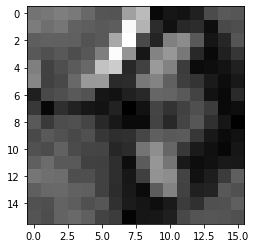

In [50]:
plt.imshow(data['t1']['data'][0][0,:,:,5], cmap='gray');

## Network's design

In [2]:
# Set cuda if available
if (torch.cuda.is_available()):
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
device

device(type='cpu')

In [ ]:
# Design network
class UNet(nn.Module):
    
    def __init__(self, in_channels=1, out_channels=1, init_features=10):
        super(UNet, self).__init__()
        
        # Parameter determining depth of layers when going down the network
        features = init_features
        
        # Encoding layers
        self.encoder1 = self.unet_block(in_channels, features, "enc1")
        self.pool1 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)
        self.encoder2 = self.unet_block(features, features*2, name='enc2')
        self.pool2 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)
        self.encoder3 = self.unet_block(features*2, features*4, name='enc3')
        self.pool3 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)
        self.encoder4 = self.unet_block(features*4, features*8, name='enc4')
        self.pool4 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)
        
        # Bottleneck layer
        self.bottleneck = self.unet_block(features*8, features*8*2, name='bottleneck')
        
        # Decoding layers (where merge with prevois encoding layers occurs)
        self.upconv4 = nn.ConvTranspose3d(features*8*2, features*8, kernel_size=2, stride=2)        
        self.decoder4 = self.unet_block(features*8*2, features*8, name='dec4')
        
        self.upconv3 = nn.ConvTranspose3d(features*4*2, features*4, kernel_size=2, stride=2)
        self.decoder3 = self.unet_block(features*4*2, features*4, name='dec3')
        
        self.upconv2 = nn.ConvTranspose3d(features*2*2, features*2, kernel_size=2, stride=2)
        self.decoder2 = self.unet_block(features*2*2, features*2, name='dec2')
        
        self.upconv1 = nn.ConvTranspose3d(features*2, features, kernel_size=2, stride=2)
        self.decoder1 = self.unet_block(features*2, features, name='dec1')
        
        # Final convolution - output equals number of output channels
        self.conv = nn.Conv3d(features, out_channels, kernel_size=1)
        self.softmax = nn.Softmax(dim=1)   
        
    def forward(self,x):
        
        # Encoding
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))  
        # Bottleneck
        bottleneck = self.bottleneck(self.pool4(enc4))
        
        # Upconvolving, concatenating data from respective encoding phase and executing UNet block
        dec4 = self.upconv4(bottleneck)
        
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)
        
        out_conv = self.conv(dec1)
        
        return self.softmax(out_conv)
    
    def unet_block(self, in_channels, features, name):
        
        return nn.Sequential(OrderedDict([(name+'conv1',nn.Conv3d(in_channels=in_channels, out_channels=features, kernel_size=3, padding=1, bias=False)),
                             (name+'bnorm1', nn.BatchNorm3d(num_features=features)),
                             (name+'relu1', nn.ReLU(inplace=True)),
                             (name+'conv2', nn.Conv3d(in_channels=features, out_channels=features, kernel_size=3, padding=1, bias=False)),
                             (name+'bnorm2', nn.BatchNorm3d(num_features=features)),
                             (name+'relu2', nn.ReLU(inplace=True))])
                            )


In [ ]:
# Discriminator

# Load original UNet AE, replace synthesis path with FC as in previous study

In [ ]:
# Generator

# Try synthesis path from UNet + hints from  https://machinelearningmastery.com/how-to-develop-a-conditional-generative-adversarial-network-from-scratch/

In [ ]:
# Initialize weights

In [ ]:
# Build network

In [ ]:
# Define hyperparameters

In [ ]:
# Loss function

In [ ]:
# Optimizer

In [ ]:
# Training

In [ ]:
# Training loss

In [ ]:
# Samples

Among available architectures we decided to use 3D u-net, due to its good performance and robustness to imperfect target labels.

As a final step, we instantiate a network of above defined class.

In [11]:
unet = UNet(1,2);
unet.to(device);

## Optimizer, loss criterion and training hyperparameters

We chose the Sorensen-Dice coefficient, defined below, which is commonly used and well-advised loss function in case of semantic segmentation.

In [13]:
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
           
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice

For an optimizer we chose a well established Adam, simultaneously testing several combinations of learning rates and total number of epochs. The combinations were chosen on the empirical basis.

In [14]:
# Criterion
criterion = DiceLoss()
#criterion = nn.CrossEntropyLoss()

# Optimizer
optimizer = torch.optim.Adam(params=unet.parameters(), lr=0.00005)

# Number of epochs
n_epochs = 100

Finally, we define a training function, which, apart from trained model, outputs also variables describing the progress of training (change of loss function for training and validation data). In addition to that, the function output in intervals information about progress of tracking, which allows for monitoring of the training progress.

In [15]:
from tqdm import tqdm

# Function returning trained model
def train_network(n_epochs, dataloaders, model, optimizer, criterion, device, print_every, save_path):
    
    track_train_loss = []
    track_valid_loss = []
      
    valid_loss_min = np.Inf
    
    model.to(device)
    
    # Initialize loss monitoring variables
    train_loss = 0.0
    valid_loss = 0.0
    
    for epoch in tqdm(range(1, n_epochs+1)):
        
        start = time.time()
        
        # Train the model
        model.train()
        for batch_idx, batch in enumerate(dataloaders['train']):
            
            data, target = batch['t1']['data'].to(device), batch['label']['data'].to(device)
            del batch
            
            optimizer.zero_grad()
            
            output = model(data)
            loss = criterion(output[0,0], target)
            loss.backward()
            optimizer.step()
            
            train_loss = train_loss + loss.item()
            
            # Update about loss stats
            if batch_idx % print_every == 0:
                if batch_idx !=0:

                    duration = time.time() - start

                    print('Epoch [{:5d}/{:5d}] | Batch [{:5d}] | Loss: {:6.4f} | Duration from start {:6.4f} '.format(epoch, n_epochs, batch_idx, train_loss/print_every, duration))

                    track_train_loss.append(train_loss/print_every)
                    train_loss = 0.0

                    #plt.imshow(data.cpu()[0,0,:,:,50].numpy(), cmap='gray', alpha=1)
                    plt.imshow(output.cpu()[0,0,:,:,50].detach().numpy(), cmap='gray', alpha=1)
                    plt.show()
            
        # Validate the model
        model.eval()
        for batch_idx, batch in enumerate(dataloaders['valid']):
                
            data, target = batch['t1']['data'].to(device), batch['label']['data'].to(device)
            del batch
                
            with torch.no_grad():
                output = model(data)
                loss = criterion(output[0,0], target)

                valid_loss = valid_loss + loss.item()

        # print training/validation statistics 
        print('END OF EPOCH: {} \tValidation Loss per image: {:.6f}'.format(epoch, valid_loss/(batch_idx+1)))
        track_valid_loss.append(valid_loss/(batch_idx+1))
        
        ## Save the model if reached min validation loss
        if valid_loss < valid_loss_min:
            valid_loss_min = valid_loss
            torch.save(model.state_dict(),save_path)
            
        valid_loss=0.0
            
    # return trained model
    return model, track_train_loss, track_valid_loss            

With everything prepared, the next step was to train the network

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch [    1/  100] | Batch [  100] | Loss: 1.0098 | Duration from start 356.8927 


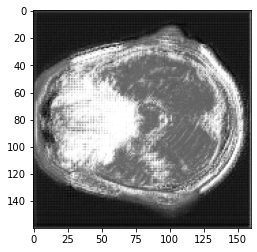

Epoch [    1/  100] | Batch [  200] | Loss: 0.9996 | Duration from start 706.9263 


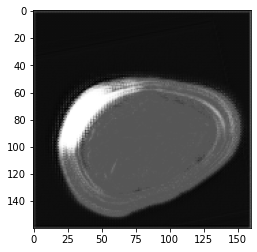

Epoch [    1/  100] | Batch [  300] | Loss: 0.9995 | Duration from start 1056.9738 


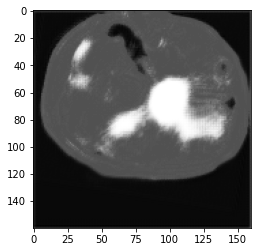

Epoch [    1/  100] | Batch [  400] | Loss: 0.9995 | Duration from start 1407.5694 


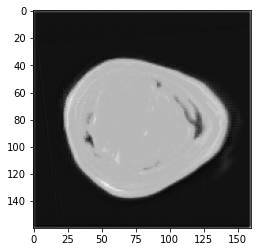

Epoch [    1/  100] | Batch [  500] | Loss: 0.9995 | Duration from start 1757.5718 


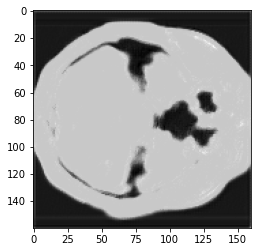

Epoch [    1/  100] | Batch [  600] | Loss: 0.9995 | Duration from start 2107.4317 


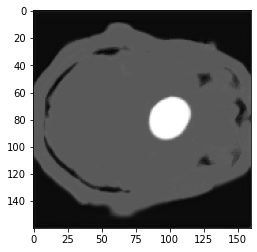

Epoch [    1/  100] | Batch [  700] | Loss: 0.9995 | Duration from start 2457.2120 


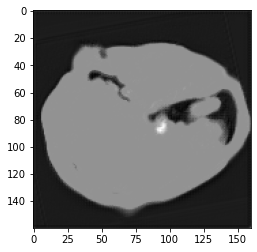

Epoch [    1/  100] | Batch [  800] | Loss: 0.9995 | Duration from start 2806.9814 


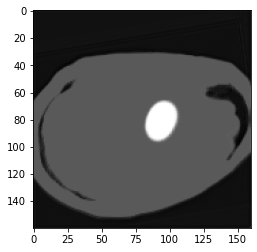

Epoch [    1/  100] | Batch [  900] | Loss: 0.9995 | Duration from start 3156.7349 


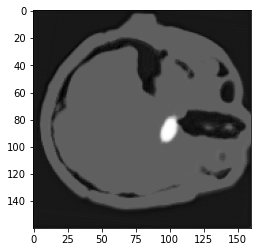

  1%|          | 1/100 [55:46<92:01:11, 3346.18s/it]

END OF EPOCH: 1 	Validation Loss per image: 0.999503
Epoch [    2/  100] | Batch [  100] | Loss: 1.3093 | Duration from start 355.7050 


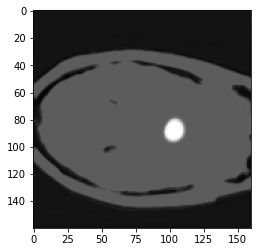

Epoch [    2/  100] | Batch [  200] | Loss: 0.9994 | Duration from start 705.5542 


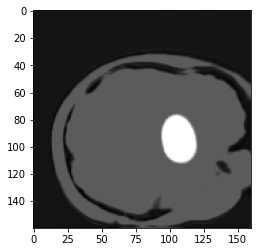

Epoch [    2/  100] | Batch [  300] | Loss: 0.9994 | Duration from start 1055.3295 


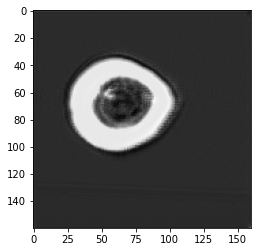

Epoch [    2/  100] | Batch [  400] | Loss: 0.9994 | Duration from start 1405.0280 


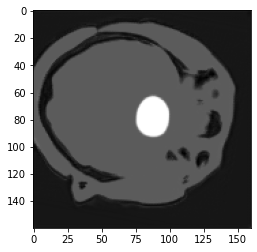

Epoch [    2/  100] | Batch [  500] | Loss: 0.9994 | Duration from start 1756.7766 


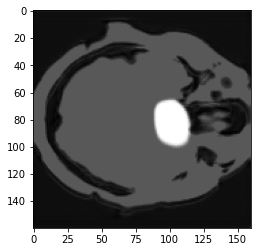

Epoch [    2/  100] | Batch [  600] | Loss: 0.9994 | Duration from start 2107.7945 


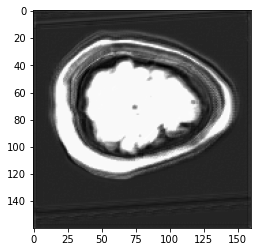

Epoch [    2/  100] | Batch [  700] | Loss: 0.9993 | Duration from start 2457.6267 


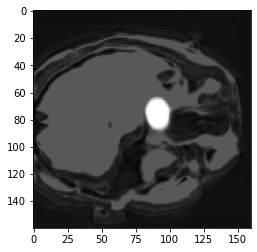

Epoch [    2/  100] | Batch [  800] | Loss: 0.9993 | Duration from start 2807.5916 


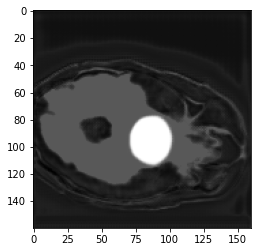

Epoch [    2/  100] | Batch [  900] | Loss: 0.9992 | Duration from start 3157.4125 


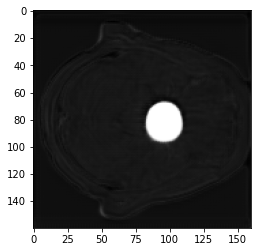

  2%|▏         | 2/100 [1:51:31<91:04:51, 3345.84s/it]

END OF EPOCH: 2 	Validation Loss per image: 0.999267
Epoch [    3/  100] | Batch [  100] | Loss: 1.3088 | Duration from start 355.9845 


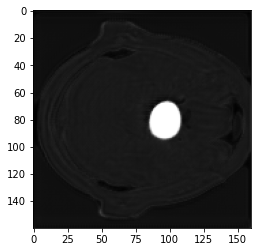

Epoch [    3/  100] | Batch [  200] | Loss: 0.9990 | Duration from start 705.8654 


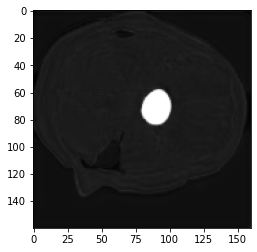

Epoch [    3/  100] | Batch [  300] | Loss: 0.9991 | Duration from start 1055.6289 


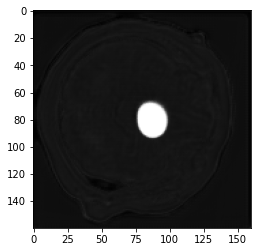

Epoch [    3/  100] | Batch [  400] | Loss: 0.9990 | Duration from start 1405.3806 


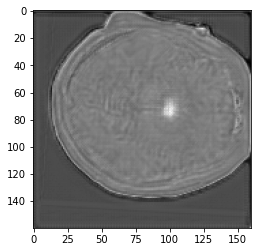

Epoch [    3/  100] | Batch [  500] | Loss: 0.9989 | Duration from start 1755.1567 


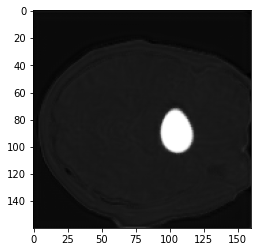

Epoch [    3/  100] | Batch [  600] | Loss: 0.9989 | Duration from start 2105.0330 


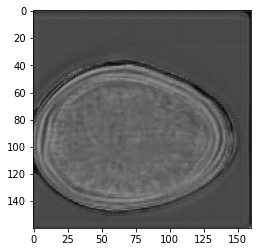

Epoch [    3/  100] | Batch [  700] | Loss: 0.9988 | Duration from start 2454.9513 


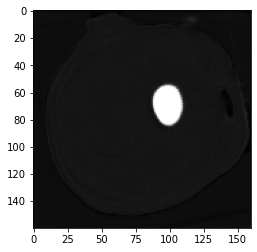

Epoch [    3/  100] | Batch [  800] | Loss: 0.9987 | Duration from start 2804.7534 


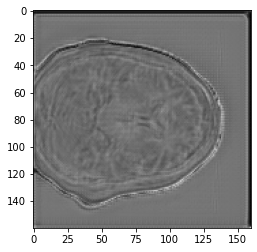

Epoch [    3/  100] | Batch [  900] | Loss: 0.9987 | Duration from start 3154.5294 


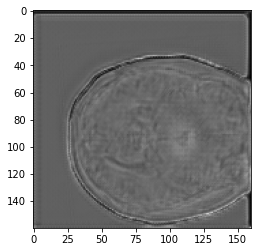

  3%|▎         | 3/100 [2:47:16<90:08:38, 3345.55s/it]

END OF EPOCH: 3 	Validation Loss per image: 0.998701
Epoch [    4/  100] | Batch [  100] | Loss: 1.3081 | Duration from start 355.7476 


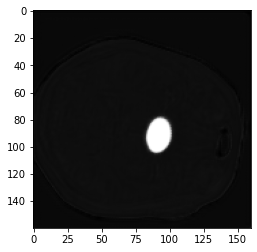

Epoch [    4/  100] | Batch [  200] | Loss: 0.9985 | Duration from start 705.5076 


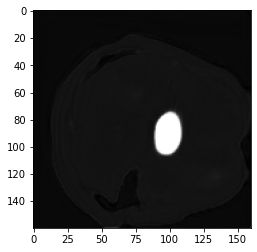

Epoch [    4/  100] | Batch [  300] | Loss: 0.9983 | Duration from start 1055.4512 


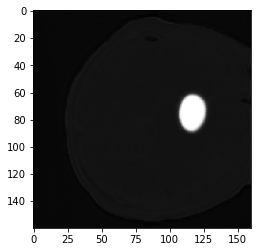

Epoch [    4/  100] | Batch [  400] | Loss: 0.9982 | Duration from start 1405.2329 


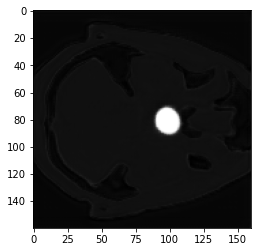

Epoch [    4/  100] | Batch [  500] | Loss: 0.9982 | Duration from start 1755.2722 


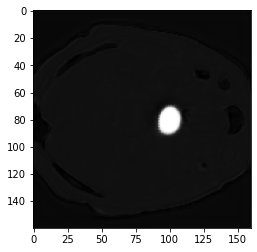

Epoch [    4/  100] | Batch [  600] | Loss: 0.9980 | Duration from start 2106.4418 


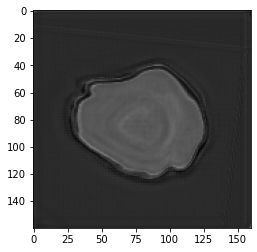

Epoch [    4/  100] | Batch [  700] | Loss: 0.9979 | Duration from start 2456.3660 


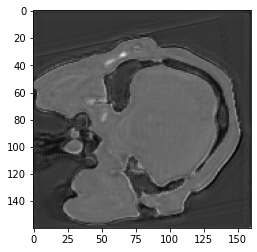

Epoch [    4/  100] | Batch [  800] | Loss: 0.9978 | Duration from start 2806.2537 


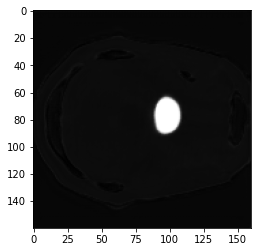

Epoch [    4/  100] | Batch [  900] | Loss: 0.9978 | Duration from start 3156.2236 


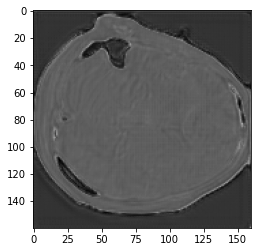

  4%|▍         | 4/100 [3:43:01<89:12:43, 3345.46s/it]

END OF EPOCH: 4 	Validation Loss per image: 0.997858
Epoch [    5/  100] | Batch [  100] | Loss: 1.3066 | Duration from start 354.6817 


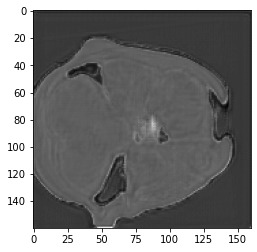

Epoch [    5/  100] | Batch [  200] | Loss: 0.9973 | Duration from start 704.7897 


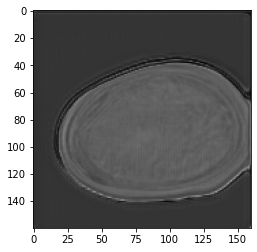

Epoch [    5/  100] | Batch [  300] | Loss: 0.9971 | Duration from start 1055.2246 


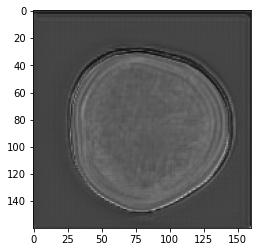

Epoch [    5/  100] | Batch [  400] | Loss: 0.9969 | Duration from start 1405.2804 


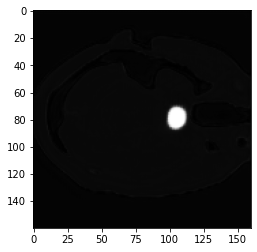

Epoch [    5/  100] | Batch [  500] | Loss: 0.9968 | Duration from start 1755.0475 


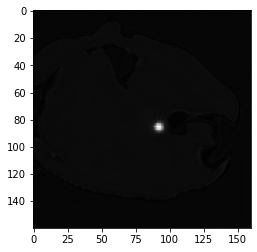

Epoch [    5/  100] | Batch [  600] | Loss: 0.9966 | Duration from start 2104.9173 


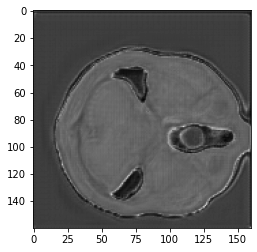

Epoch [    5/  100] | Batch [  700] | Loss: 0.9962 | Duration from start 2454.7257 


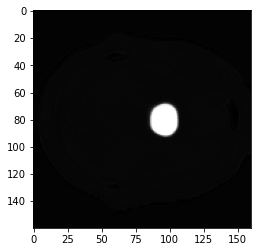

Epoch [    5/  100] | Batch [  800] | Loss: 0.9958 | Duration from start 2804.5151 


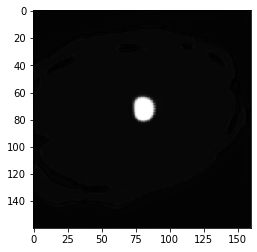

Epoch [    5/  100] | Batch [  900] | Loss: 0.9954 | Duration from start 3154.3401 


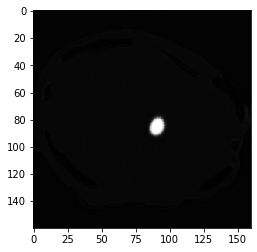

  5%|▌         | 5/100 [4:38:45<88:16:13, 3344.98s/it]

END OF EPOCH: 5 	Validation Loss per image: 0.996044
Epoch [    6/  100] | Batch [  100] | Loss: 1.3033 | Duration from start 356.3744 


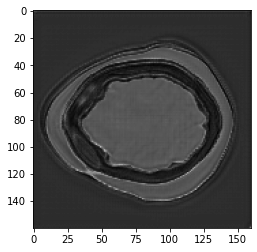

Epoch [    6/  100] | Batch [  200] | Loss: 0.9945 | Duration from start 706.2818 


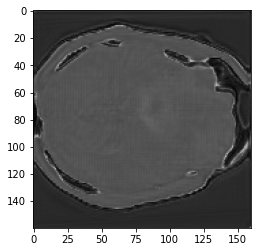

Epoch [    6/  100] | Batch [  300] | Loss: 0.9937 | Duration from start 1056.0030 


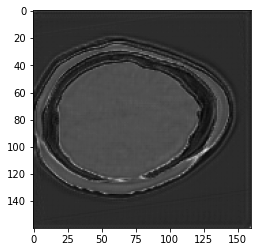

Epoch [    6/  100] | Batch [  400] | Loss: 0.9932 | Duration from start 1405.7248 


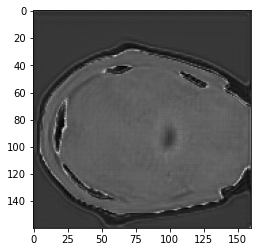

Epoch [    6/  100] | Batch [  500] | Loss: 0.9924 | Duration from start 1755.5614 


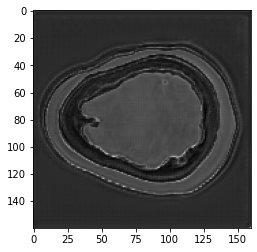

Epoch [    6/  100] | Batch [  600] | Loss: 0.9919 | Duration from start 2105.4252 


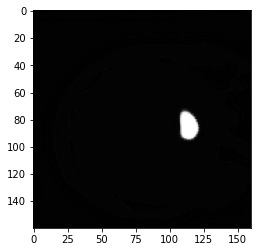

Epoch [    6/  100] | Batch [  700] | Loss: 0.9905 | Duration from start 2456.2663 


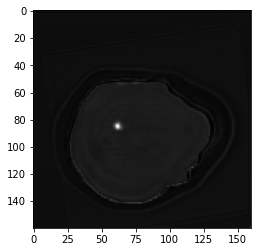

Epoch [    6/  100] | Batch [  800] | Loss: 0.9902 | Duration from start 2806.8669 


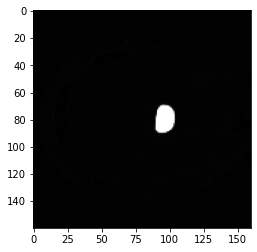

Epoch [    6/  100] | Batch [  900] | Loss: 0.9894 | Duration from start 3156.6969 


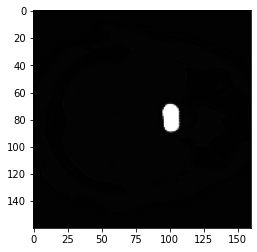

  6%|▌         | 6/100 [5:34:31<87:20:51, 3345.22s/it]

END OF EPOCH: 6 	Validation Loss per image: 0.991063
Epoch [    7/  100] | Batch [  100] | Loss: 1.2942 | Duration from start 358.4091 


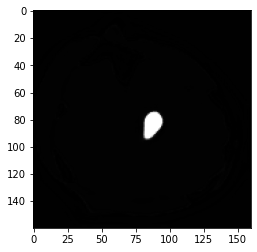

Epoch [    7/  100] | Batch [  200] | Loss: 0.9857 | Duration from start 708.2149 


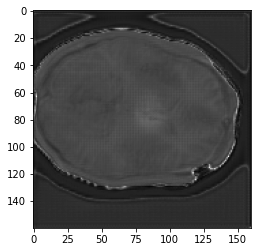

Epoch [    7/  100] | Batch [  300] | Loss: 0.9844 | Duration from start 1058.0423 


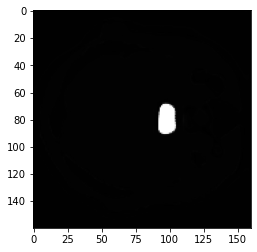

Epoch [    7/  100] | Batch [  400] | Loss: 0.9827 | Duration from start 1407.7936 


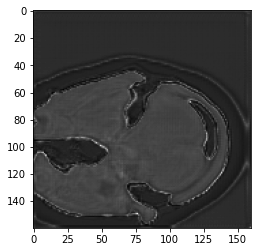

Epoch [    7/  100] | Batch [  500] | Loss: 0.9811 | Duration from start 1757.6024 


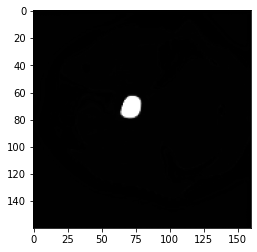

Epoch [    7/  100] | Batch [  600] | Loss: 0.9783 | Duration from start 2107.4826 


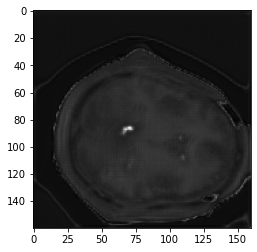

Epoch [    7/  100] | Batch [  700] | Loss: 0.9754 | Duration from start 2457.4412 


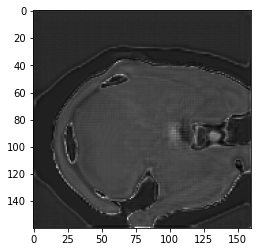

Epoch [    7/  100] | Batch [  800] | Loss: 0.9735 | Duration from start 2807.3556 


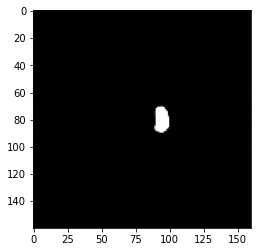

Epoch [    7/  100] | Batch [  900] | Loss: 0.9695 | Duration from start 3157.1530 


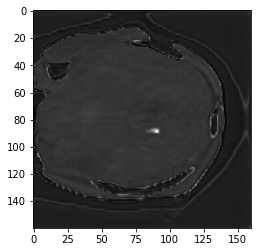

  7%|▋         | 7/100 [6:30:19<86:26:34, 3346.18s/it]

END OF EPOCH: 7 	Validation Loss per image: 0.967153
Epoch [    8/  100] | Batch [  100] | Loss: 1.2658 | Duration from start 357.7446 


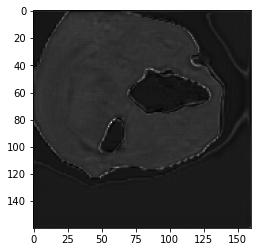

Epoch [    8/  100] | Batch [  200] | Loss: 0.9611 | Duration from start 707.5731 


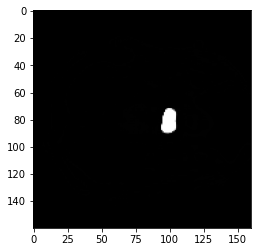

Epoch [    8/  100] | Batch [  300] | Loss: 0.9555 | Duration from start 1057.4085 


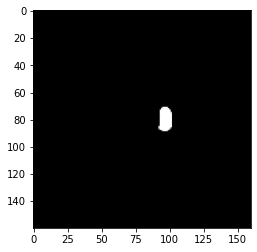

Epoch [    8/  100] | Batch [  400] | Loss: 0.9510 | Duration from start 1407.1439 


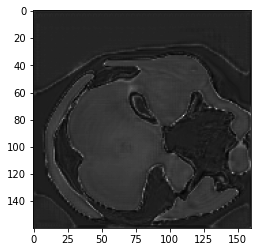

Epoch [    8/  100] | Batch [  500] | Loss: 0.9437 | Duration from start 1756.9442 


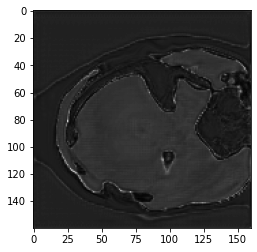

Epoch [    8/  100] | Batch [  600] | Loss: 0.9427 | Duration from start 2106.6786 


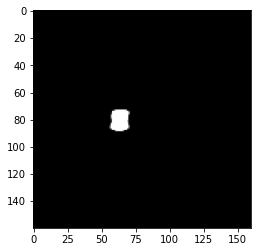

Epoch [    8/  100] | Batch [  700] | Loss: 0.9269 | Duration from start 2456.4322 


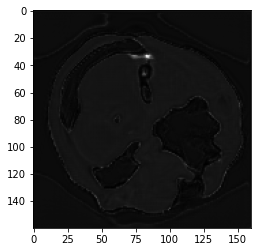

Epoch [    8/  100] | Batch [  800] | Loss: 0.9203 | Duration from start 2806.1986 


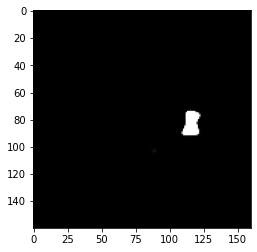

Epoch [    8/  100] | Batch [  900] | Loss: 0.9136 | Duration from start 3156.0146 


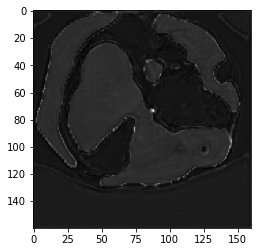

  8%|▊         | 8/100 [7:26:04<85:30:29, 3345.97s/it]

END OF EPOCH: 8 	Validation Loss per image: 0.917889
Epoch [    9/  100] | Batch [  100] | Loss: 1.1798 | Duration from start 355.9452 


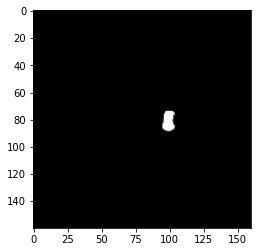

Epoch [    9/  100] | Batch [  200] | Loss: 0.8857 | Duration from start 705.6222 


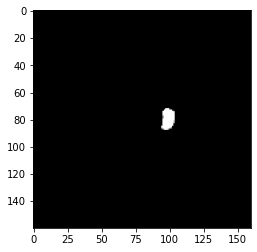

Epoch [    9/  100] | Batch [  300] | Loss: 0.8739 | Duration from start 1055.4489 


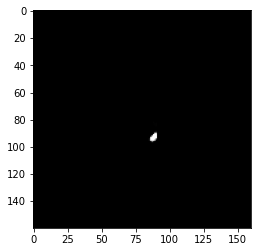

Epoch [    9/  100] | Batch [  400] | Loss: 0.8580 | Duration from start 1405.1695 


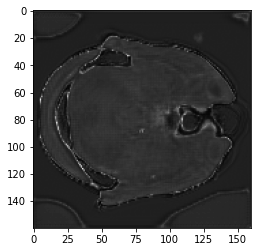

Epoch [    9/  100] | Batch [  500] | Loss: 0.8498 | Duration from start 1754.8598 


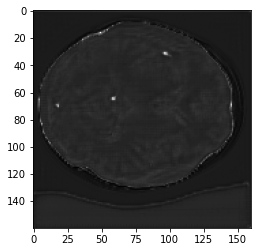

Epoch [    9/  100] | Batch [  600] | Loss: 0.8359 | Duration from start 2104.5757 


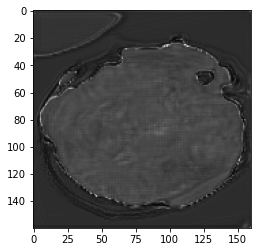

Epoch [    9/  100] | Batch [  700] | Loss: 0.8168 | Duration from start 2454.2984 


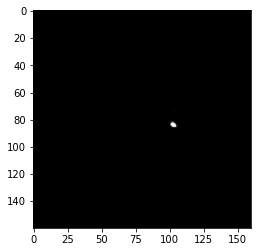

Epoch [    9/  100] | Batch [  800] | Loss: 0.7978 | Duration from start 2803.9741 


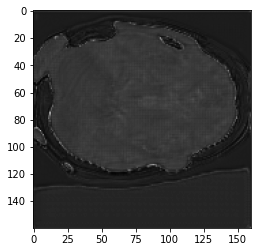

Epoch [    9/  100] | Batch [  900] | Loss: 0.7751 | Duration from start 3153.6605 


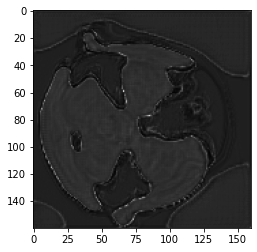

  9%|▉         | 9/100 [8:21:47<84:33:03, 3344.88s/it]

END OF EPOCH: 9 	Validation Loss per image: 0.809821
Epoch [   10/  100] | Batch [  100] | Loss: 0.9966 | Duration from start 356.8412 


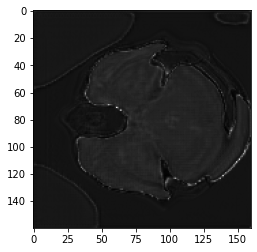

Epoch [   10/  100] | Batch [  200] | Loss: 0.7378 | Duration from start 706.6066 


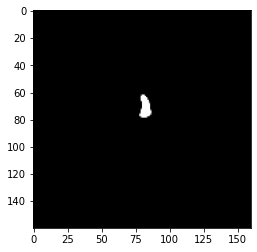

Epoch [   10/  100] | Batch [  300] | Loss: 0.7061 | Duration from start 1056.2882 


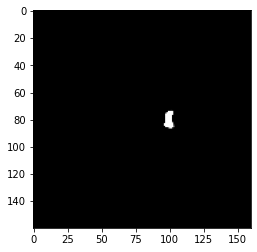

Epoch [   10/  100] | Batch [  400] | Loss: 0.6943 | Duration from start 1406.0720 


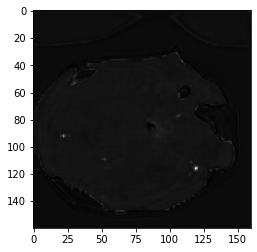

Epoch [   10/  100] | Batch [  500] | Loss: 0.6835 | Duration from start 1755.7446 


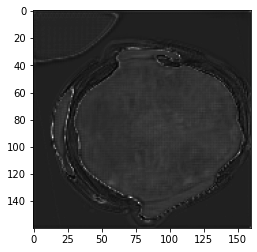

Epoch [   10/  100] | Batch [  600] | Loss: 0.6530 | Duration from start 2105.4788 


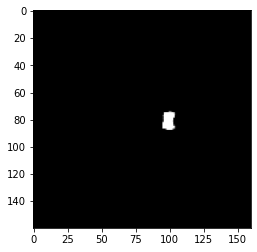

Epoch [   10/  100] | Batch [  700] | Loss: 0.6385 | Duration from start 2455.1987 


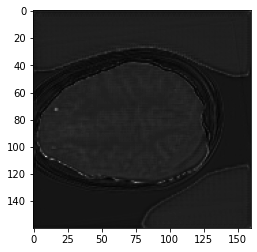

Epoch [   10/  100] | Batch [  800] | Loss: 0.6216 | Duration from start 2804.9746 


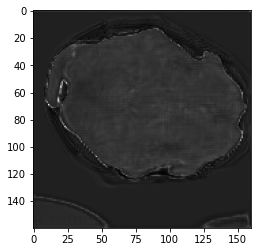

Epoch [   10/  100] | Batch [  900] | Loss: 0.5780 | Duration from start 3154.7803 


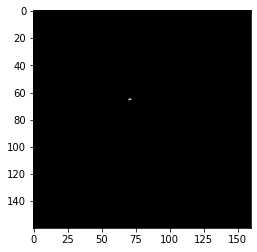

 10%|█         | 10/100 [9:17:32<83:37:19, 3344.89s/it]

END OF EPOCH: 10 	Validation Loss per image: 0.634182
Epoch [   11/  100] | Batch [  100] | Loss: 0.7350 | Duration from start 354.2806 


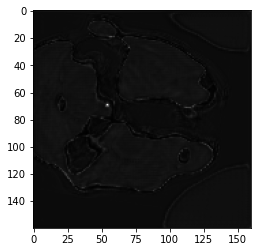

Epoch [   11/  100] | Batch [  200] | Loss: 0.5564 | Duration from start 704.0178 


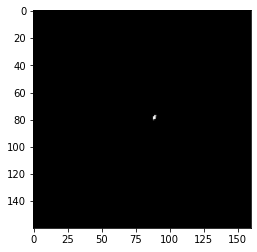

Epoch [   11/  100] | Batch [  300] | Loss: 0.5440 | Duration from start 1053.7860 


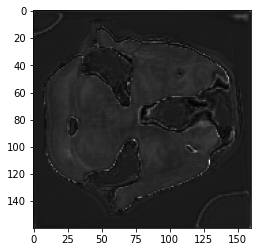

Epoch [   11/  100] | Batch [  400] | Loss: 0.5333 | Duration from start 1403.4278 


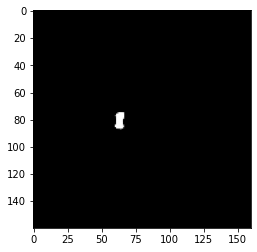

Epoch [   11/  100] | Batch [  500] | Loss: 0.5094 | Duration from start 1753.2289 


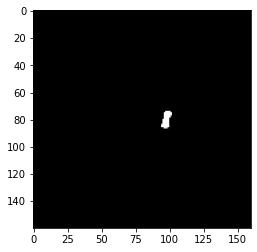

Epoch [   11/  100] | Batch [  600] | Loss: 0.4979 | Duration from start 2103.0536 


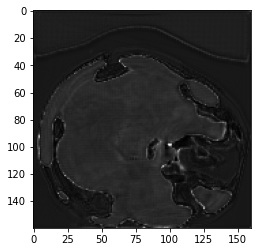

Epoch [   11/  100] | Batch [  700] | Loss: 0.4865 | Duration from start 2452.9265 


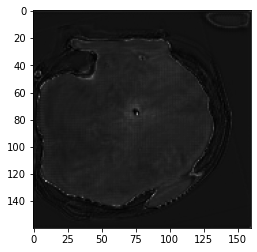

Epoch [   11/  100] | Batch [  800] | Loss: 0.4751 | Duration from start 2802.7084 


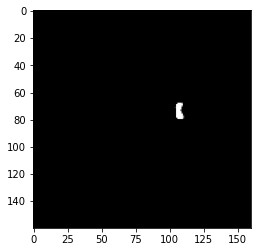

Epoch [   11/  100] | Batch [  900] | Loss: 0.4378 | Duration from start 3152.4586 


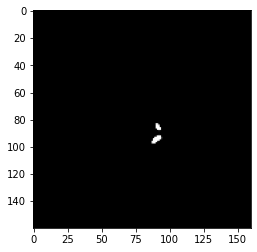

 11%|█         | 11/100 [10:13:13<82:40:05, 3343.88s/it]

END OF EPOCH: 11 	Validation Loss per image: 0.519876
Epoch [   12/  100] | Batch [  100] | Loss: 0.5736 | Duration from start 355.6162 


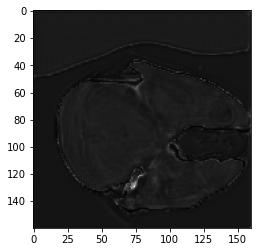

Epoch [   12/  100] | Batch [  200] | Loss: 0.4354 | Duration from start 705.4413 


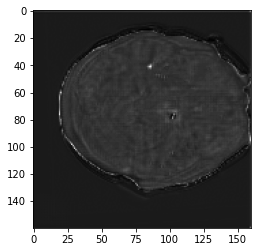

Epoch [   12/  100] | Batch [  300] | Loss: 0.4160 | Duration from start 1055.2823 


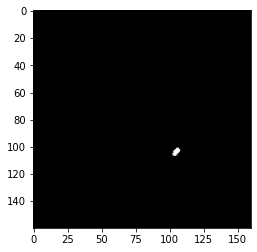

Epoch [   12/  100] | Batch [  400] | Loss: 0.4026 | Duration from start 1405.0429 


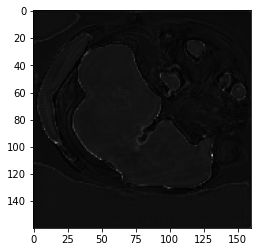

Epoch [   12/  100] | Batch [  500] | Loss: 0.4042 | Duration from start 1754.9102 


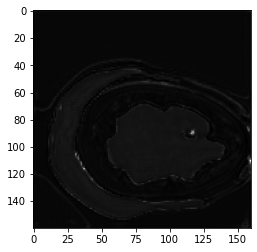

Epoch [   12/  100] | Batch [  600] | Loss: 0.3948 | Duration from start 2104.6282 


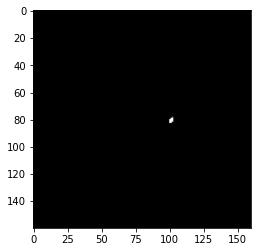

Epoch [   12/  100] | Batch [  700] | Loss: 0.3886 | Duration from start 2454.4341 


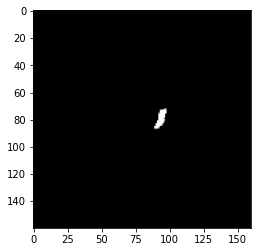

Epoch [   12/  100] | Batch [  800] | Loss: 0.3826 | Duration from start 2804.1574 


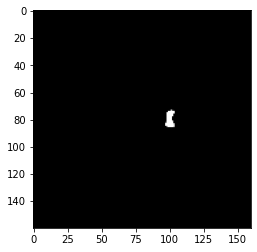

Epoch [   12/  100] | Batch [  900] | Loss: 0.3805 | Duration from start 3153.8025 


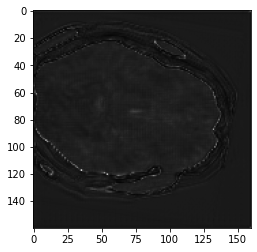

 12%|█▏        | 12/100 [11:08:56<81:44:00, 3343.64s/it]

END OF EPOCH: 12 	Validation Loss per image: 0.435652
Epoch [   13/  100] | Batch [  100] | Loss: 0.5028 | Duration from start 357.5733 


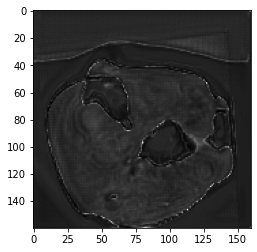

Epoch [   13/  100] | Batch [  200] | Loss: 0.3570 | Duration from start 707.3282 


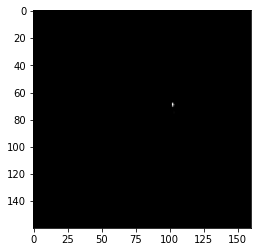

Epoch [   13/  100] | Batch [  300] | Loss: 0.3494 | Duration from start 1057.0856 


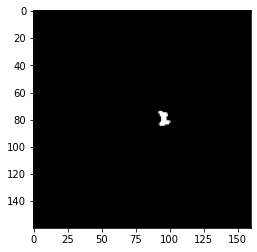

Epoch [   13/  100] | Batch [  400] | Loss: 0.3441 | Duration from start 1406.8828 


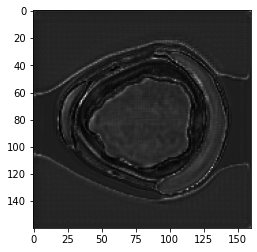

Epoch [   13/  100] | Batch [  500] | Loss: 0.3407 | Duration from start 1756.6962 


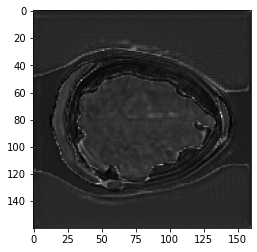

Epoch [   13/  100] | Batch [  600] | Loss: 0.3434 | Duration from start 2106.4623 


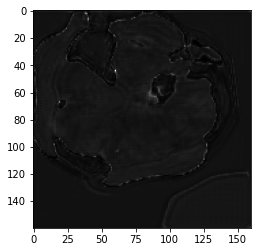

Epoch [   13/  100] | Batch [  700] | Loss: 0.3416 | Duration from start 2456.2528 


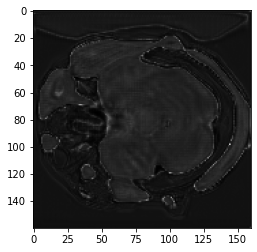

Epoch [   13/  100] | Batch [  800] | Loss: 0.3327 | Duration from start 2806.0328 


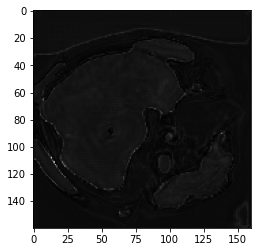

Epoch [   13/  100] | Batch [  900] | Loss: 0.3492 | Duration from start 3155.7399 


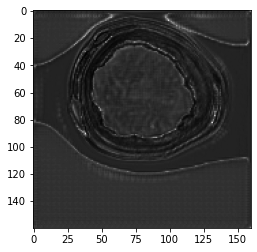

 13%|█▎        | 13/100 [12:04:41<80:48:57, 3344.11s/it]

END OF EPOCH: 13 	Validation Loss per image: 0.385538
Epoch [   14/  100] | Batch [  100] | Loss: 0.4277 | Duration from start 354.3633 


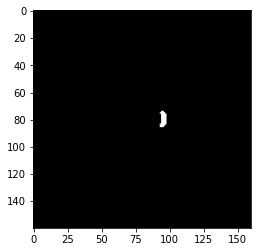

Epoch [   14/  100] | Batch [  200] | Loss: 0.3192 | Duration from start 704.0842 


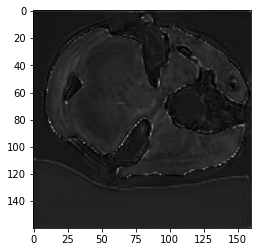

Epoch [   14/  100] | Batch [  300] | Loss: 0.3074 | Duration from start 1053.7538 


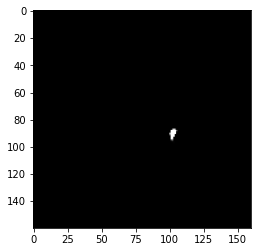

Epoch [   14/  100] | Batch [  400] | Loss: 0.3030 | Duration from start 1403.5070 


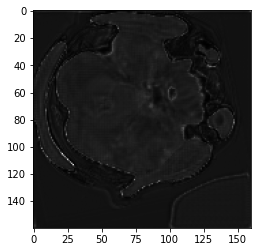

Epoch [   14/  100] | Batch [  500] | Loss: 0.3344 | Duration from start 1753.2584 


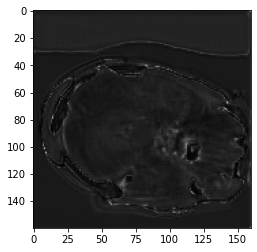

Epoch [   14/  100] | Batch [  600] | Loss: 0.3135 | Duration from start 2102.9920 


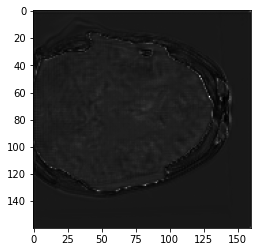

Epoch [   14/  100] | Batch [  700] | Loss: 0.3174 | Duration from start 2452.6456 


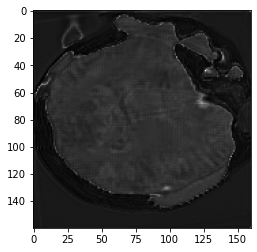

Epoch [   14/  100] | Batch [  800] | Loss: 0.2997 | Duration from start 2802.4326 


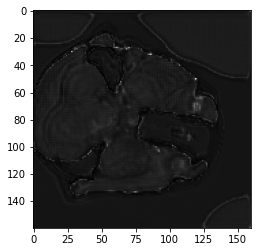

Epoch [   14/  100] | Batch [  900] | Loss: 0.3134 | Duration from start 3152.1562 


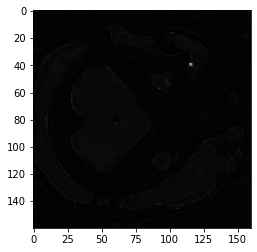

 14%|█▍        | 14/100 [13:00:23<79:52:04, 3343.30s/it]

END OF EPOCH: 14 	Validation Loss per image: 0.505455
Epoch [   15/  100] | Batch [  100] | Loss: 0.4131 | Duration from start 356.5130 


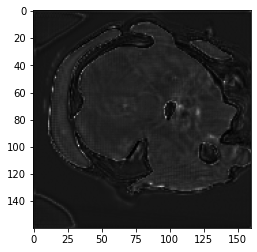

Epoch [   15/  100] | Batch [  200] | Loss: 0.3045 | Duration from start 706.1748 


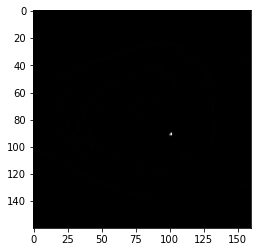

Epoch [   15/  100] | Batch [  300] | Loss: 0.3039 | Duration from start 1055.8615 


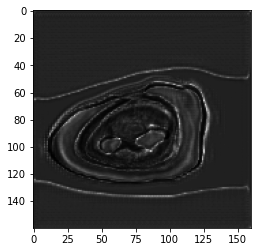

Epoch [   15/  100] | Batch [  400] | Loss: 0.2943 | Duration from start 1405.5659 


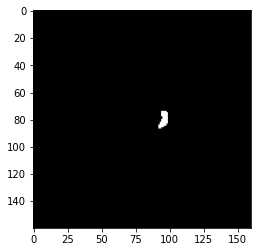

Epoch [   15/  100] | Batch [  500] | Loss: 0.2866 | Duration from start 1755.3274 


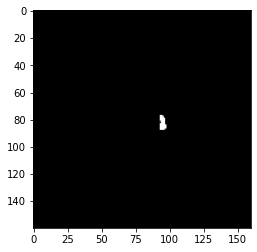

Epoch [   15/  100] | Batch [  600] | Loss: 0.2800 | Duration from start 2105.0824 


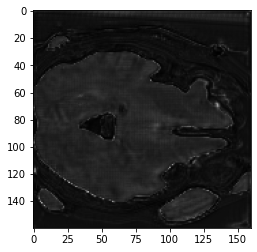

Epoch [   15/  100] | Batch [  700] | Loss: 0.2844 | Duration from start 2454.8077 


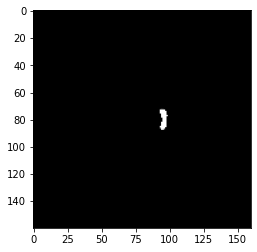

Epoch [   15/  100] | Batch [  800] | Loss: 0.3017 | Duration from start 2804.5884 


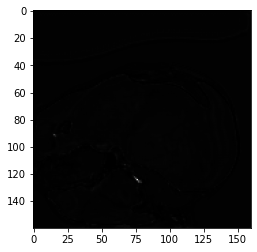

Epoch [   15/  100] | Batch [  900] | Loss: 0.2848 | Duration from start 3154.3604 


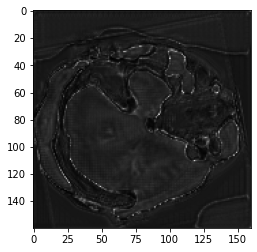

 15%|█▌        | 15/100 [13:56:05<78:55:46, 3342.90s/it]

END OF EPOCH: 15 	Validation Loss per image: 0.356248
Epoch [   16/  100] | Batch [  100] | Loss: 0.3772 | Duration from start 356.2298 


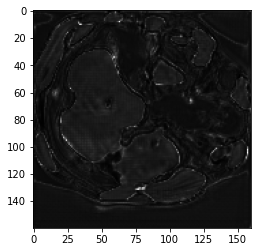

Epoch [   16/  100] | Batch [  200] | Loss: 0.2712 | Duration from start 706.0305 


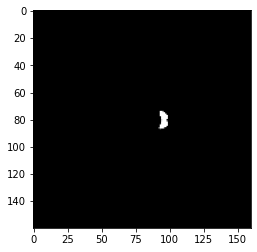

Epoch [   16/  100] | Batch [  300] | Loss: 0.2723 | Duration from start 1055.7606 


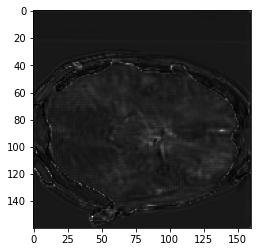

Epoch [   16/  100] | Batch [  400] | Loss: 0.2907 | Duration from start 1405.5249 


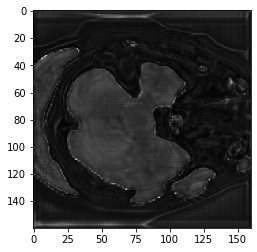

Epoch [   16/  100] | Batch [  500] | Loss: 0.3017 | Duration from start 1755.2980 


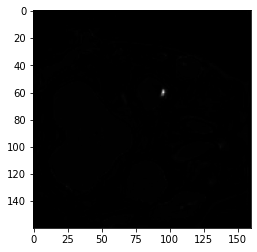

Epoch [   16/  100] | Batch [  600] | Loss: 0.2867 | Duration from start 2105.0074 


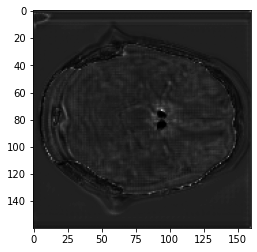

Epoch [   16/  100] | Batch [  700] | Loss: 0.2836 | Duration from start 2454.6731 


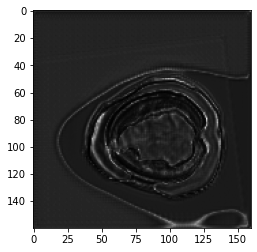

Epoch [   16/  100] | Batch [  800] | Loss: 0.2703 | Duration from start 2804.4686 


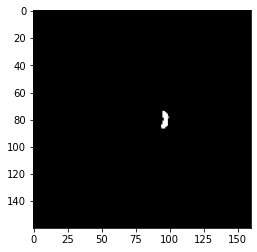

Epoch [   16/  100] | Batch [  900] | Loss: 0.2883 | Duration from start 3160.2437 


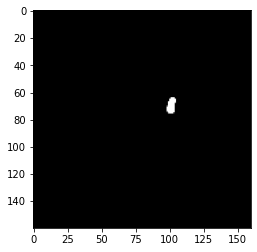

 16%|█▌        | 16/100 [14:51:54<78:02:46, 3344.84s/it]

END OF EPOCH: 16 	Validation Loss per image: 0.401830
Epoch [   17/  100] | Batch [  100] | Loss: 0.3688 | Duration from start 356.1906 


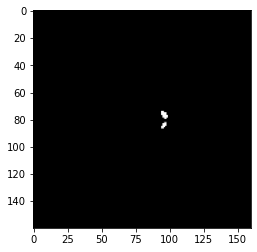

Epoch [   17/  100] | Batch [  200] | Loss: 0.2716 | Duration from start 705.9403 


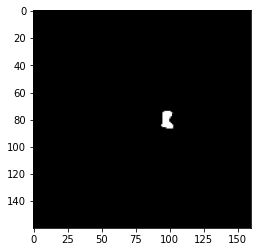

Epoch [   17/  100] | Batch [  300] | Loss: 0.2783 | Duration from start 1055.5998 


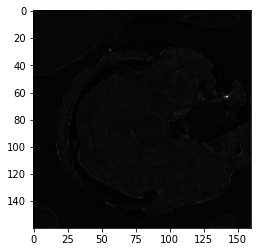

Epoch [   17/  100] | Batch [  400] | Loss: 0.2821 | Duration from start 1405.2594 


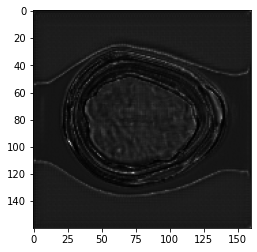

Epoch [   17/  100] | Batch [  500] | Loss: 0.2661 | Duration from start 1755.0453 


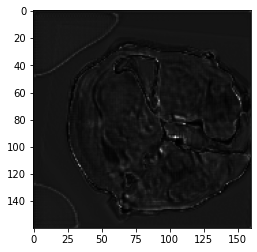

Epoch [   17/  100] | Batch [  600] | Loss: 0.2903 | Duration from start 2104.7834 


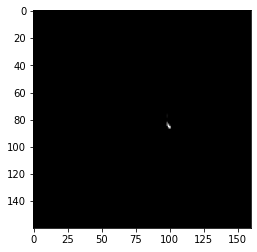

Epoch [   17/  100] | Batch [  700] | Loss: 0.2719 | Duration from start 2454.6972 


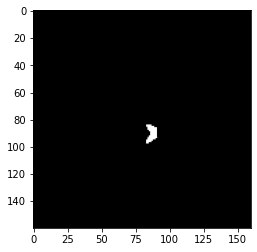

Epoch [   17/  100] | Batch [  800] | Loss: 0.2763 | Duration from start 2804.4428 


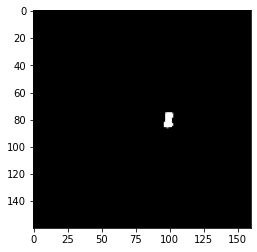

Epoch [   17/  100] | Batch [  900] | Loss: 0.2759 | Duration from start 3154.2077 


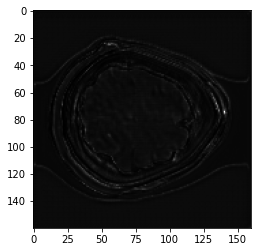

 17%|█▋        | 17/100 [15:47:36<77:05:46, 3343.93s/it]

END OF EPOCH: 17 	Validation Loss per image: 0.429005
Epoch [   18/  100] | Batch [  100] | Loss: 0.3587 | Duration from start 357.3870 


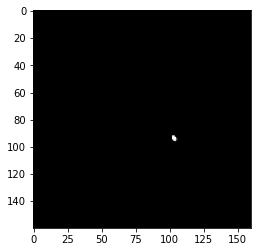

Epoch [   18/  100] | Batch [  200] | Loss: 0.2597 | Duration from start 707.1344 


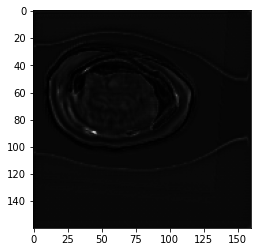

Epoch [   18/  100] | Batch [  300] | Loss: 0.2643 | Duration from start 1056.8375 


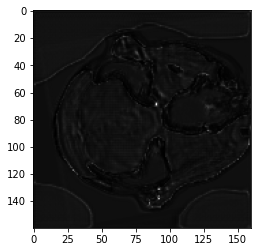

Epoch [   18/  100] | Batch [  400] | Loss: 0.2596 | Duration from start 1406.5737 


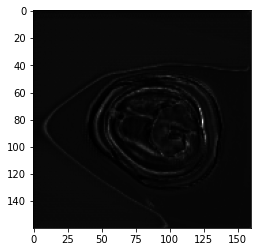

Epoch [   18/  100] | Batch [  500] | Loss: 0.2824 | Duration from start 1756.3256 


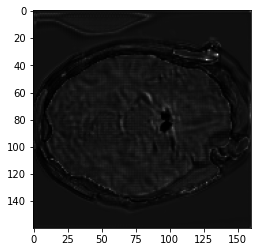

Epoch [   18/  100] | Batch [  600] | Loss: 0.2613 | Duration from start 2105.9639 


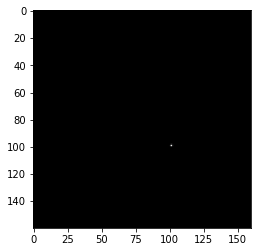

Epoch [   18/  100] | Batch [  700] | Loss: 0.2758 | Duration from start 2455.7349 


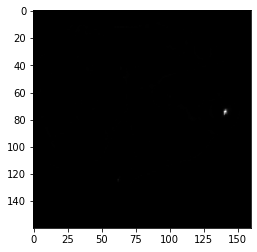

Epoch [   18/  100] | Batch [  800] | Loss: 0.2802 | Duration from start 2805.3841 


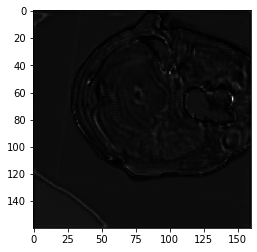

Epoch [   18/  100] | Batch [  900] | Loss: 0.2781 | Duration from start 3155.1438 


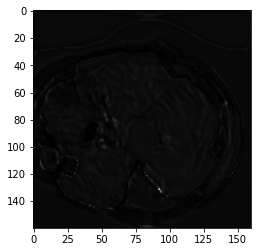

 18%|█▊        | 18/100 [16:43:20<76:10:15, 3344.10s/it]

END OF EPOCH: 18 	Validation Loss per image: 0.480971
Epoch [   19/  100] | Batch [  100] | Loss: 0.3326 | Duration from start 356.7414 


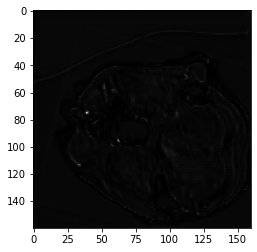

Epoch [   19/  100] | Batch [  200] | Loss: 0.2552 | Duration from start 706.5278 


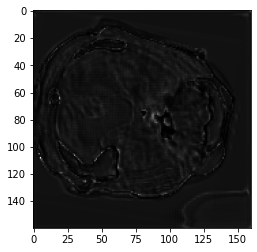

Epoch [   19/  100] | Batch [  300] | Loss: 0.2700 | Duration from start 1056.2603 


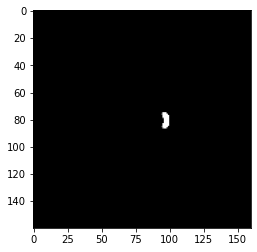

Epoch [   19/  100] | Batch [  400] | Loss: 0.2588 | Duration from start 1406.0660 


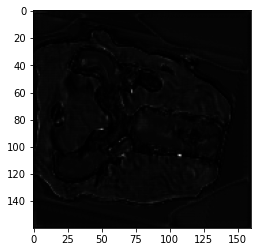

Epoch [   19/  100] | Batch [  500] | Loss: 0.2755 | Duration from start 1755.7821 


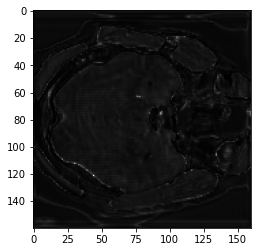

Epoch [   19/  100] | Batch [  600] | Loss: 0.2683 | Duration from start 2105.4950 


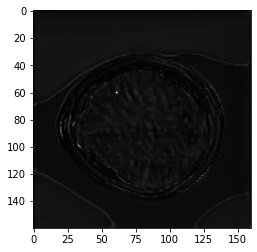

Epoch [   19/  100] | Batch [  700] | Loss: 0.2644 | Duration from start 2455.2835 


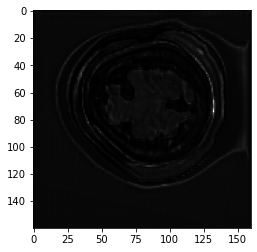

Epoch [   19/  100] | Batch [  800] | Loss: 0.2505 | Duration from start 2805.0447 


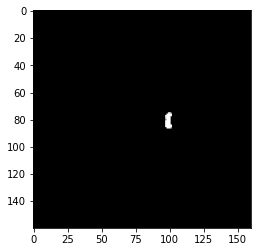

Epoch [   19/  100] | Batch [  900] | Loss: 0.2744 | Duration from start 3154.7077 


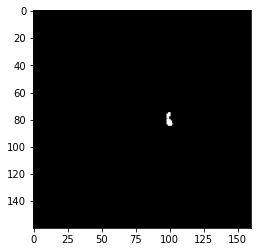

 19%|█▉        | 19/100 [17:39:04<75:14:16, 3343.91s/it]

END OF EPOCH: 19 	Validation Loss per image: 0.335338
Epoch [   20/  100] | Batch [  100] | Loss: 0.3537 | Duration from start 354.4688 


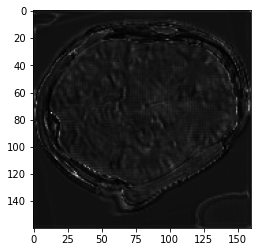

Epoch [   20/  100] | Batch [  200] | Loss: 0.2677 | Duration from start 704.1410 


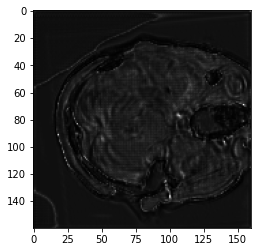

Epoch [   20/  100] | Batch [  300] | Loss: 0.2648 | Duration from start 1053.8492 


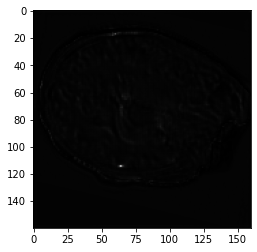

Epoch [   20/  100] | Batch [  400] | Loss: 0.2595 | Duration from start 1403.7359 


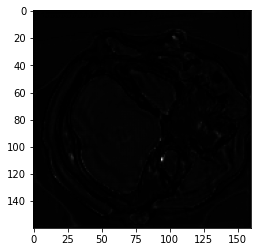

Epoch [   20/  100] | Batch [  500] | Loss: 0.2528 | Duration from start 1753.6882 


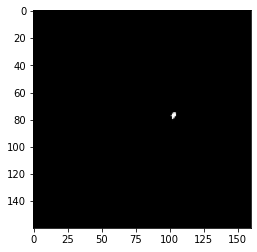

Epoch [   20/  100] | Batch [  600] | Loss: 0.2661 | Duration from start 2103.5592 


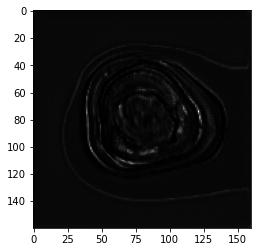

Epoch [   20/  100] | Batch [  700] | Loss: 0.2527 | Duration from start 2453.4931 


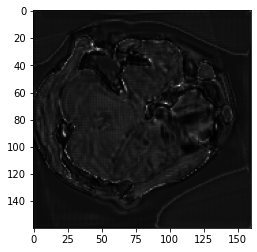

Epoch [   20/  100] | Batch [  800] | Loss: 0.2667 | Duration from start 2803.3218 


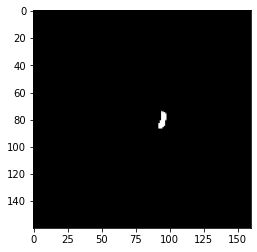

Epoch [   20/  100] | Batch [  900] | Loss: 0.2570 | Duration from start 3153.2206 


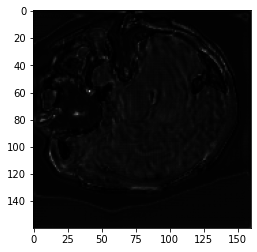

 20%|██        | 20/100 [18:34:46<74:17:40, 3343.26s/it]

END OF EPOCH: 20 	Validation Loss per image: 0.340039
Epoch [   21/  100] | Batch [  100] | Loss: 0.3415 | Duration from start 356.9529 


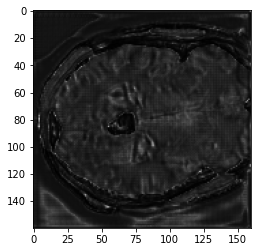

Epoch [   21/  100] | Batch [  200] | Loss: 0.2769 | Duration from start 706.7103 


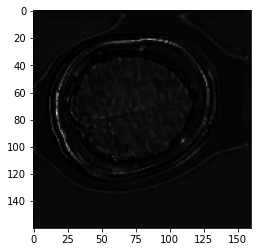

Epoch [   21/  100] | Batch [  300] | Loss: 0.2618 | Duration from start 1056.4228 


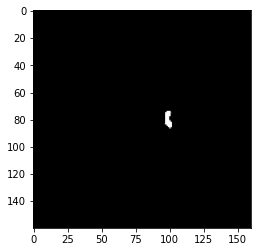

Epoch [   21/  100] | Batch [  400] | Loss: 0.2528 | Duration from start 1406.1234 


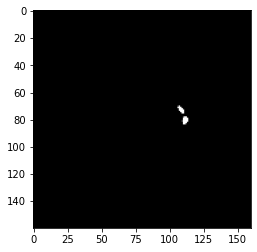

Epoch [   21/  100] | Batch [  500] | Loss: 0.2575 | Duration from start 1755.8581 


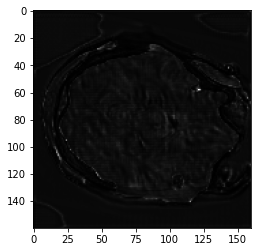

Epoch [   21/  100] | Batch [  600] | Loss: 0.2547 | Duration from start 2105.6333 


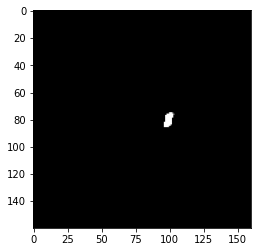

Epoch [   21/  100] | Batch [  700] | Loss: 0.2594 | Duration from start 2455.3055 


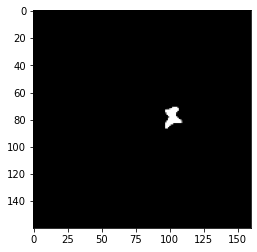

Epoch [   21/  100] | Batch [  800] | Loss: 0.2520 | Duration from start 2805.0438 


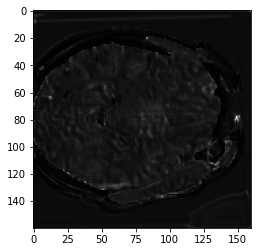

Epoch [   21/  100] | Batch [  900] | Loss: 0.2526 | Duration from start 3154.7372 


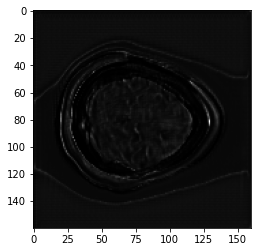

 21%|██        | 21/100 [19:30:31<73:22:40, 3343.81s/it]

END OF EPOCH: 21 	Validation Loss per image: 0.351914
Epoch [   22/  100] | Batch [  100] | Loss: 0.3242 | Duration from start 355.8592 


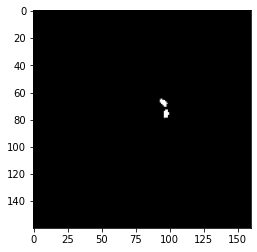

Epoch [   22/  100] | Batch [  200] | Loss: 0.2617 | Duration from start 705.6159 


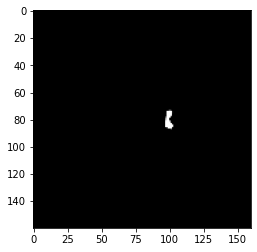

Epoch [   22/  100] | Batch [  300] | Loss: 0.2598 | Duration from start 1055.3731 


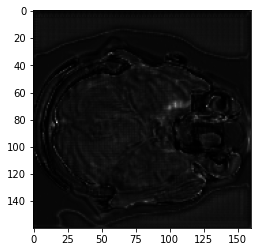

Epoch [   22/  100] | Batch [  400] | Loss: 0.2618 | Duration from start 1405.2046 


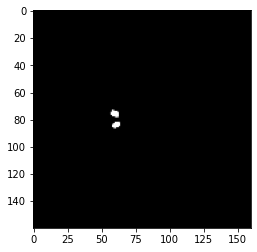

Epoch [   22/  100] | Batch [  500] | Loss: 0.2562 | Duration from start 1754.9834 


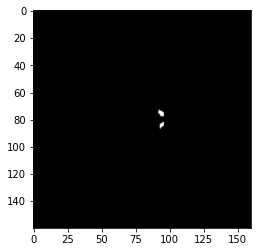

Epoch [   22/  100] | Batch [  600] | Loss: 0.2451 | Duration from start 2104.9725 


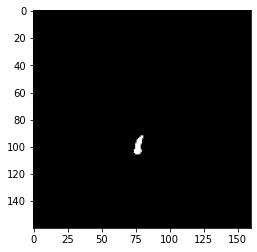

Epoch [   22/  100] | Batch [  700] | Loss: 0.2568 | Duration from start 2454.7124 


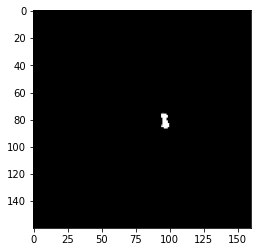

Epoch [   22/  100] | Batch [  800] | Loss: 0.2622 | Duration from start 2804.3797 


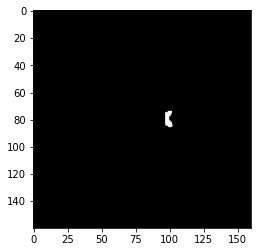

Epoch [   22/  100] | Batch [  900] | Loss: 0.2590 | Duration from start 3154.0886 


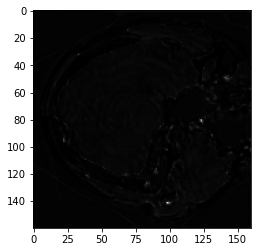

 22%|██▏       | 22/100 [20:26:14<72:26:51, 3343.73s/it]

END OF EPOCH: 22 	Validation Loss per image: 0.355628
Epoch [   23/  100] | Batch [  100] | Loss: 0.3307 | Duration from start 356.0344 


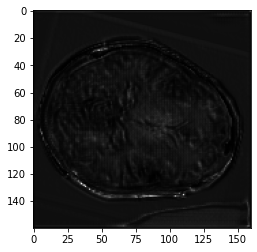

Epoch [   23/  100] | Batch [  200] | Loss: 0.2677 | Duration from start 705.7650 


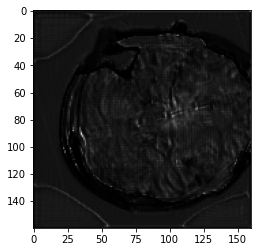

Epoch [   23/  100] | Batch [  300] | Loss: 0.2377 | Duration from start 1055.5263 


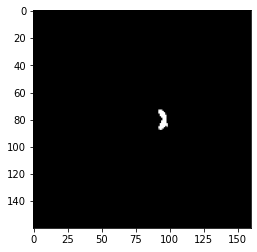

Epoch [   23/  100] | Batch [  400] | Loss: 0.2654 | Duration from start 1405.2371 


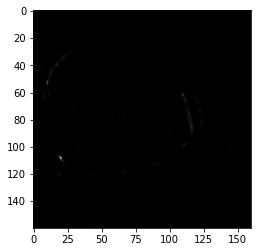

Epoch [   23/  100] | Batch [  500] | Loss: 0.2583 | Duration from start 1754.9694 


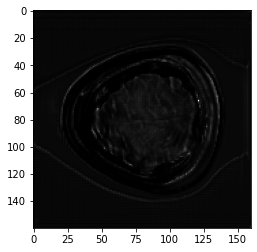

Epoch [   23/  100] | Batch [  600] | Loss: 0.2703 | Duration from start 2104.7326 


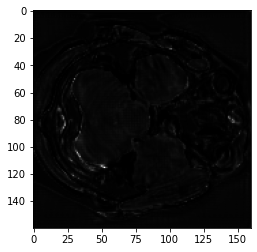

Epoch [   23/  100] | Batch [  700] | Loss: 0.2651 | Duration from start 2454.4513 


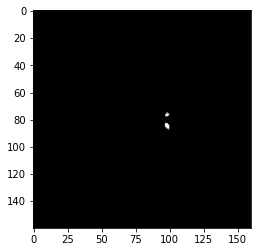

Epoch [   23/  100] | Batch [  800] | Loss: 0.2511 | Duration from start 2804.2199 


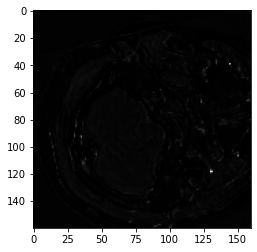

Epoch [   23/  100] | Batch [  900] | Loss: 0.2560 | Duration from start 3153.9926 


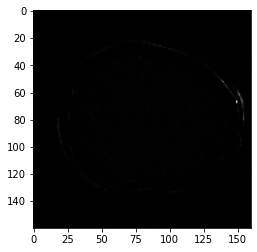

 23%|██▎       | 23/100 [21:21:58<71:31:04, 3343.69s/it]

END OF EPOCH: 23 	Validation Loss per image: 0.328876
Epoch [   24/  100] | Batch [  100] | Loss: 0.3200 | Duration from start 354.3712 


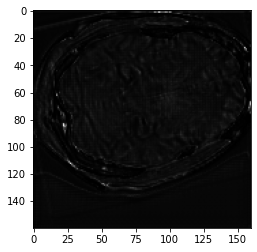

Epoch [   24/  100] | Batch [  200] | Loss: 0.2518 | Duration from start 704.0974 


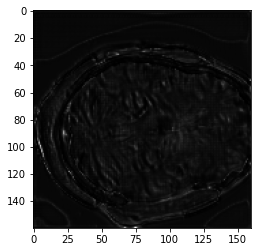

Epoch [   24/  100] | Batch [  300] | Loss: 0.2548 | Duration from start 1053.7933 


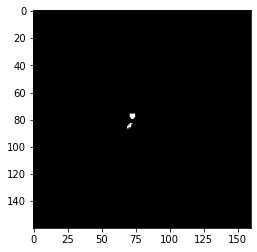

Epoch [   24/  100] | Batch [  400] | Loss: 0.2592 | Duration from start 1403.5788 


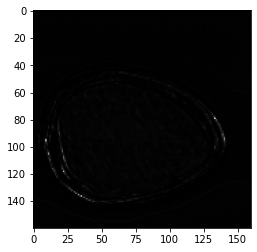

Epoch [   24/  100] | Batch [  500] | Loss: 0.2481 | Duration from start 1753.3577 


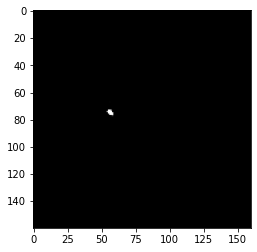

Epoch [   24/  100] | Batch [  600] | Loss: 0.2549 | Duration from start 2103.0169 


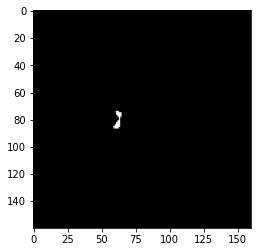

Epoch [   24/  100] | Batch [  700] | Loss: 0.2633 | Duration from start 2452.7467 


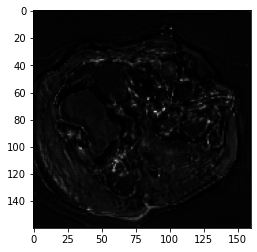

Epoch [   24/  100] | Batch [  800] | Loss: 0.2603 | Duration from start 2802.5083 


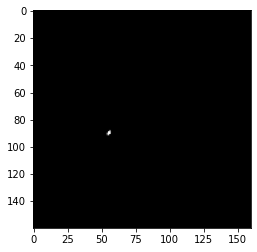

Epoch [   24/  100] | Batch [  900] | Loss: 0.2641 | Duration from start 3152.2953 


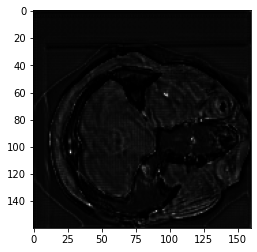

 24%|██▍       | 24/100 [22:17:39<70:34:10, 3342.77s/it]

END OF EPOCH: 24 	Validation Loss per image: 0.313148
Epoch [   25/  100] | Batch [  100] | Loss: 0.3301 | Duration from start 354.5641 


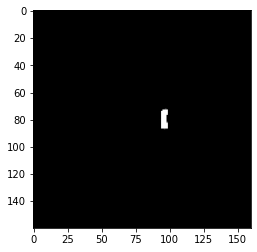

Epoch [   25/  100] | Batch [  200] | Loss: 0.2498 | Duration from start 704.4417 


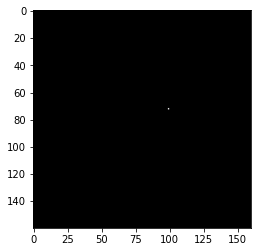

Epoch [   25/  100] | Batch [  300] | Loss: 0.2601 | Duration from start 1054.2976 


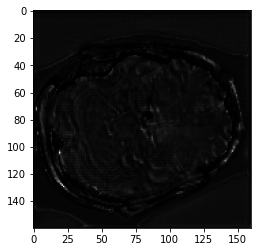

Epoch [   25/  100] | Batch [  400] | Loss: 0.2489 | Duration from start 1404.0305 


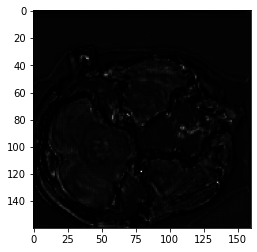

Epoch [   25/  100] | Batch [  500] | Loss: 0.2513 | Duration from start 1753.8329 


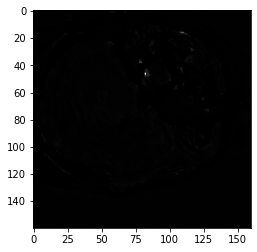

Epoch [   25/  100] | Batch [  600] | Loss: 0.2457 | Duration from start 2103.5994 


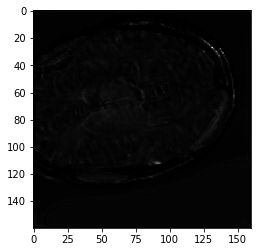

Epoch [   25/  100] | Batch [  700] | Loss: 0.2478 | Duration from start 2453.3472 


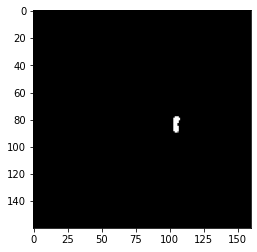

Epoch [   25/  100] | Batch [  800] | Loss: 0.2415 | Duration from start 2803.1120 


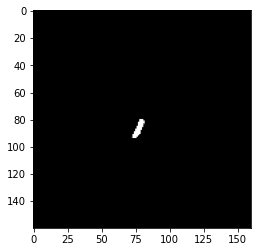

Epoch [   25/  100] | Batch [  900] | Loss: 0.2412 | Duration from start 3153.0409 


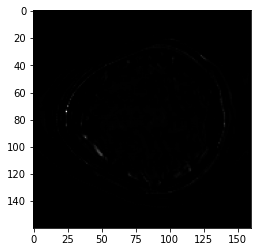

 25%|██▌       | 25/100 [23:13:20<69:38:00, 3342.40s/it]

END OF EPOCH: 25 	Validation Loss per image: 0.417880
Epoch [   26/  100] | Batch [  100] | Loss: 0.3396 | Duration from start 359.0937 


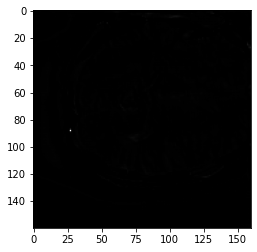

Epoch [   26/  100] | Batch [  200] | Loss: 0.2643 | Duration from start 708.8147 


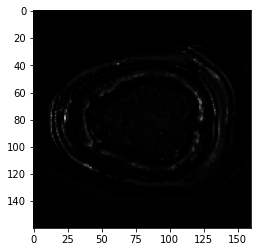

Epoch [   26/  100] | Batch [  300] | Loss: 0.2555 | Duration from start 1058.6566 


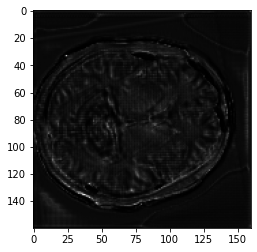

Epoch [   26/  100] | Batch [  400] | Loss: 0.2506 | Duration from start 1408.6454 


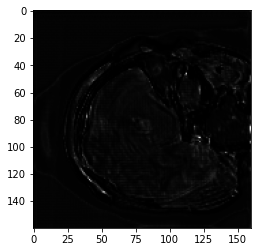

Epoch [   26/  100] | Batch [  500] | Loss: 0.2500 | Duration from start 1758.4648 


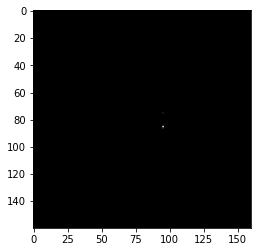

Epoch [   26/  100] | Batch [  600] | Loss: 0.2491 | Duration from start 2108.3487 


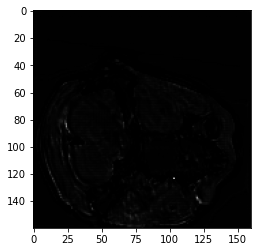

Epoch [   26/  100] | Batch [  700] | Loss: 0.2511 | Duration from start 2458.3182 


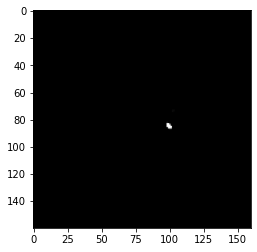

Epoch [   26/  100] | Batch [  800] | Loss: 0.2420 | Duration from start 2808.1895 


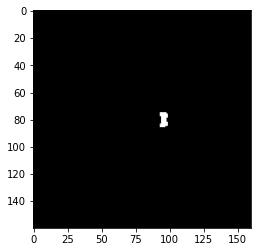

Epoch [   26/  100] | Batch [  900] | Loss: 0.2459 | Duration from start 3158.3122 


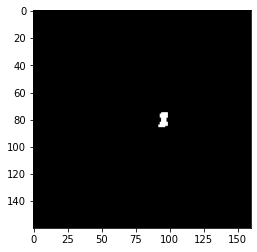

 26%|██▌       | 26/100 [24:09:07<68:44:01, 3343.80s/it]

END OF EPOCH: 26 	Validation Loss per image: 0.311137
Epoch [   27/  100] | Batch [  100] | Loss: 0.3359 | Duration from start 356.0887 


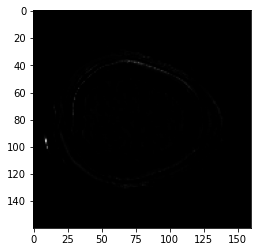

Epoch [   27/  100] | Batch [  200] | Loss: 0.2554 | Duration from start 706.0667 


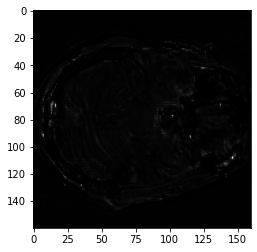

Epoch [   27/  100] | Batch [  300] | Loss: 0.2481 | Duration from start 1055.9262 


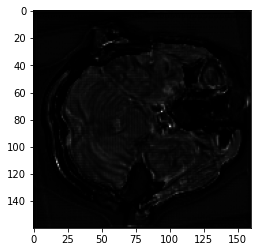

Epoch [   27/  100] | Batch [  400] | Loss: 0.2380 | Duration from start 1405.7569 


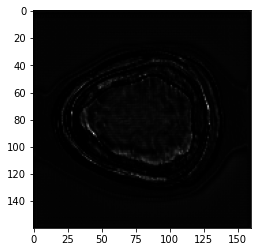

Epoch [   27/  100] | Batch [  500] | Loss: 0.2547 | Duration from start 1755.6541 


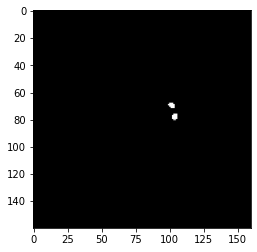

Epoch [   27/  100] | Batch [  600] | Loss: 0.2558 | Duration from start 2105.6192 


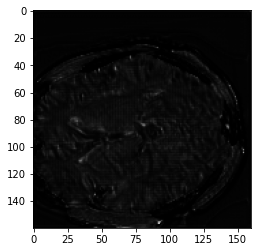

Epoch [   27/  100] | Batch [  700] | Loss: 0.2469 | Duration from start 2455.6458 


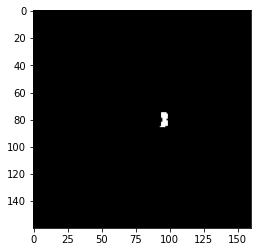

Epoch [   27/  100] | Batch [  800] | Loss: 0.2455 | Duration from start 2805.6483 


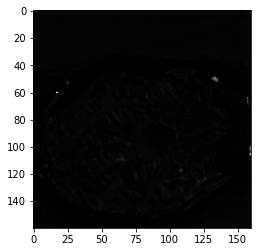

Epoch [   27/  100] | Batch [  900] | Loss: 0.2425 | Duration from start 3155.4395 


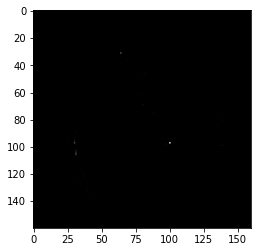

 27%|██▋       | 27/100 [25:04:51<67:48:27, 3343.93s/it]

END OF EPOCH: 27 	Validation Loss per image: 0.298887
Epoch [   28/  100] | Batch [  100] | Loss: 0.3292 | Duration from start 355.6913 


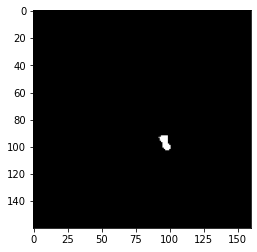

Epoch [   28/  100] | Batch [  200] | Loss: 0.2439 | Duration from start 705.6094 


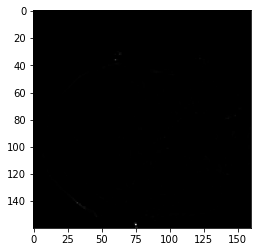

Epoch [   28/  100] | Batch [  300] | Loss: 0.2653 | Duration from start 1055.5224 


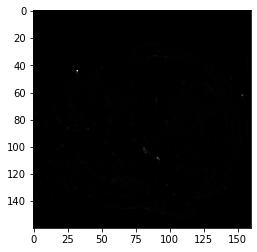

Epoch [   28/  100] | Batch [  400] | Loss: 0.2448 | Duration from start 1405.2986 


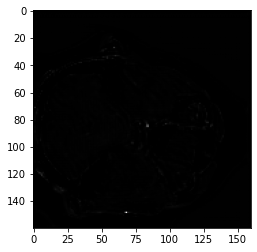

Epoch [   28/  100] | Batch [  500] | Loss: 0.2498 | Duration from start 1755.1975 


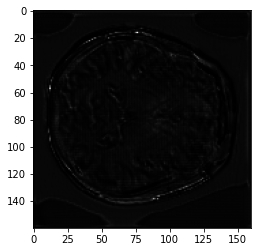

Epoch [   28/  100] | Batch [  600] | Loss: 0.2474 | Duration from start 2104.9671 


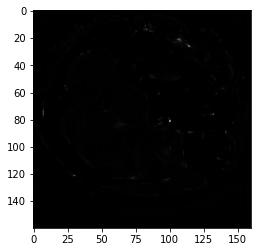

Epoch [   28/  100] | Batch [  700] | Loss: 0.2670 | Duration from start 2454.7597 


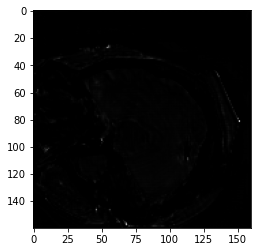

Epoch [   28/  100] | Batch [  800] | Loss: 0.2350 | Duration from start 2804.5556 


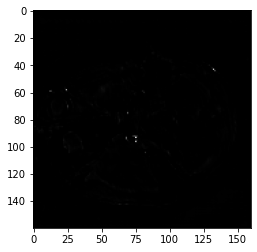

Epoch [   28/  100] | Batch [  900] | Loss: 0.2446 | Duration from start 3154.3413 


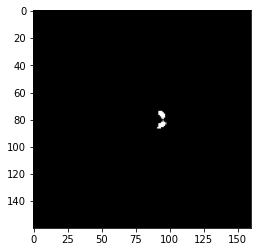

 28%|██▊       | 28/100 [26:00:35<66:52:41, 3343.91s/it]

END OF EPOCH: 28 	Validation Loss per image: 0.329894
Epoch [   29/  100] | Batch [  100] | Loss: 0.3088 | Duration from start 354.5771 


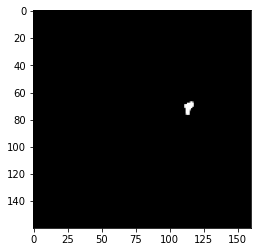

Epoch [   29/  100] | Batch [  200] | Loss: 0.2448 | Duration from start 704.2721 


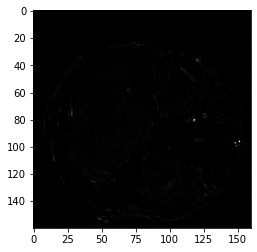

Epoch [   29/  100] | Batch [  300] | Loss: 0.2365 | Duration from start 1054.0774 


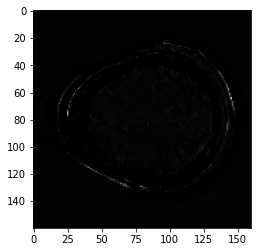

Epoch [   29/  100] | Batch [  400] | Loss: 0.2392 | Duration from start 1404.0599 


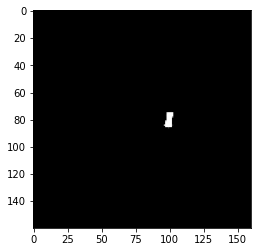

Epoch [   29/  100] | Batch [  500] | Loss: 0.2757 | Duration from start 1754.0039 


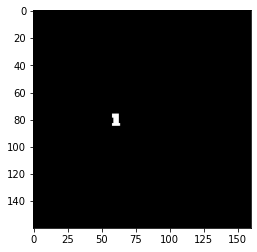

Epoch [   29/  100] | Batch [  600] | Loss: 0.2359 | Duration from start 2103.9825 


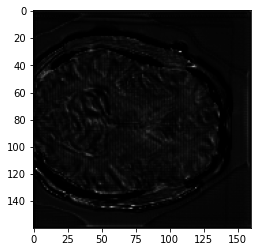

Epoch [   29/  100] | Batch [  700] | Loss: 0.2496 | Duration from start 2453.8605 


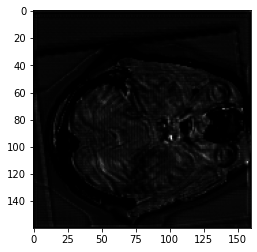

Epoch [   29/  100] | Batch [  800] | Loss: 0.2506 | Duration from start 2803.7861 


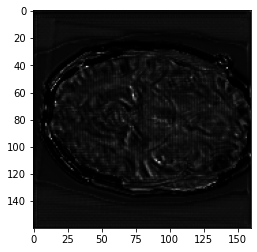

Epoch [   29/  100] | Batch [  900] | Loss: 0.2472 | Duration from start 3153.8766 


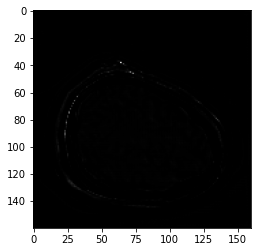

 29%|██▉       | 29/100 [26:56:18<65:56:33, 3343.57s/it]

END OF EPOCH: 29 	Validation Loss per image: 0.307229
Epoch [   30/  100] | Batch [  100] | Loss: 0.3237 | Duration from start 356.3572 


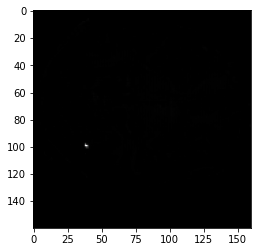

Epoch [   30/  100] | Batch [  200] | Loss: 0.2506 | Duration from start 706.3791 


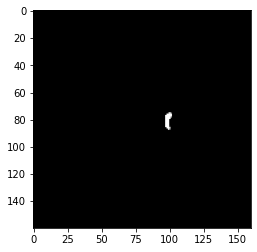

Epoch [   30/  100] | Batch [  300] | Loss: 0.2364 | Duration from start 1056.3449 


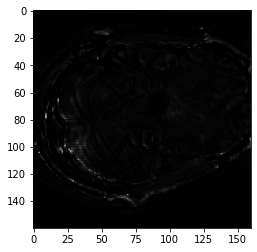

Epoch [   30/  100] | Batch [  400] | Loss: 0.2579 | Duration from start 1406.3824 


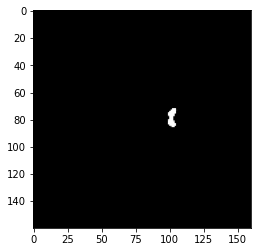

Epoch [   30/  100] | Batch [  500] | Loss: 0.2383 | Duration from start 1756.3520 


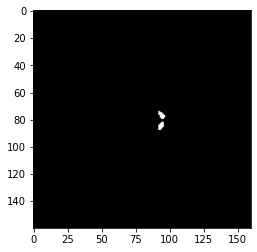

Epoch [   30/  100] | Batch [  600] | Loss: 0.2528 | Duration from start 2106.2422 


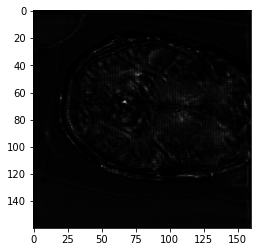

Epoch [   30/  100] | Batch [  700] | Loss: 0.2359 | Duration from start 2456.2638 


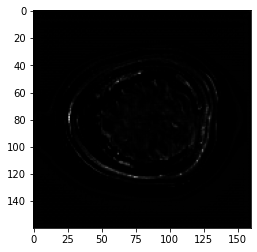

Epoch [   30/  100] | Batch [  800] | Loss: 0.2515 | Duration from start 2806.3407 


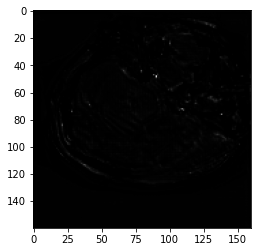

Epoch [   30/  100] | Batch [  900] | Loss: 0.2516 | Duration from start 3156.3120 


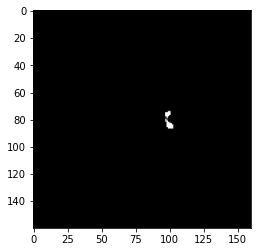

 30%|███       | 30/100 [27:52:03<65:01:17, 3343.97s/it]

END OF EPOCH: 30 	Validation Loss per image: 0.313802
Epoch [   31/  100] | Batch [  100] | Loss: 0.3192 | Duration from start 356.1890 


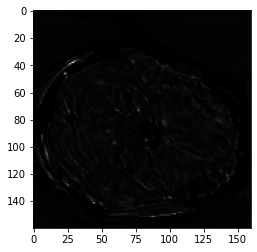

Epoch [   31/  100] | Batch [  200] | Loss: 0.2456 | Duration from start 705.9637 


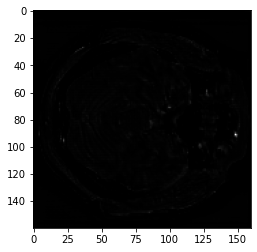

Epoch [   31/  100] | Batch [  300] | Loss: 0.2466 | Duration from start 1055.7307 


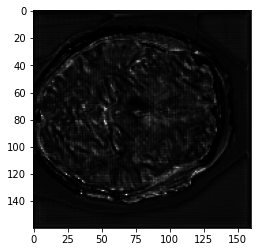

Epoch [   31/  100] | Batch [  400] | Loss: 0.2413 | Duration from start 1405.5218 


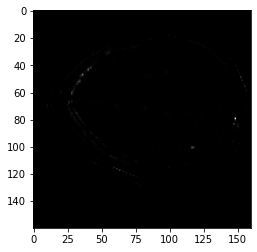

Epoch [   31/  100] | Batch [  500] | Loss: 0.2346 | Duration from start 1755.3424 


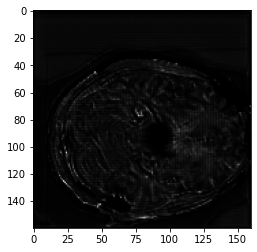

Epoch [   31/  100] | Batch [  600] | Loss: 0.2523 | Duration from start 2105.1497 


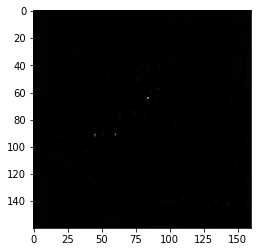

Epoch [   31/  100] | Batch [  700] | Loss: 0.2505 | Duration from start 2454.9018 


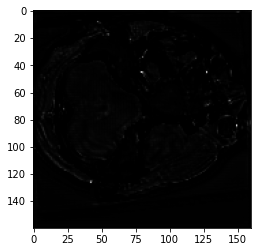

Epoch [   31/  100] | Batch [  800] | Loss: 0.2403 | Duration from start 2804.6981 


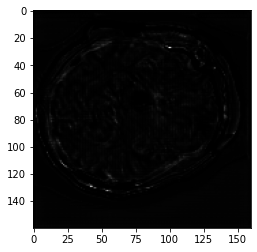

Epoch [   31/  100] | Batch [  900] | Loss: 0.2555 | Duration from start 3154.5201 


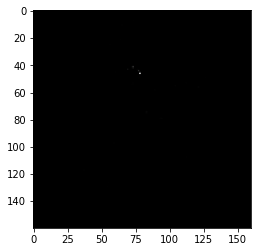

 31%|███       | 31/100 [28:47:46<64:05:11, 3343.64s/it]

END OF EPOCH: 31 	Validation Loss per image: 0.321844
Epoch [   32/  100] | Batch [  100] | Loss: 0.3424 | Duration from start 356.8588 


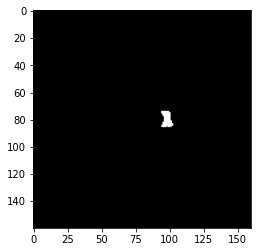

Epoch [   32/  100] | Batch [  200] | Loss: 0.2533 | Duration from start 706.8665 


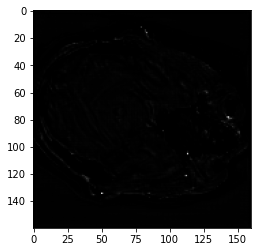

Epoch [   32/  100] | Batch [  300] | Loss: 0.2470 | Duration from start 1056.9066 


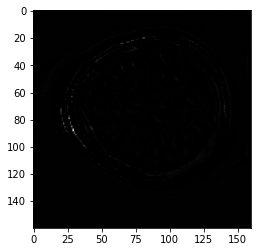

Epoch [   32/  100] | Batch [  400] | Loss: 0.2464 | Duration from start 1406.7261 


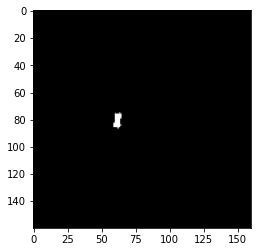

Epoch [   32/  100] | Batch [  500] | Loss: 0.2430 | Duration from start 1756.4789 


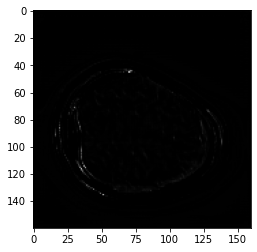

Epoch [   32/  100] | Batch [  600] | Loss: 0.2520 | Duration from start 2106.3070 


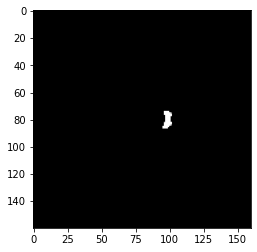

Epoch [   32/  100] | Batch [  700] | Loss: 0.2345 | Duration from start 2456.2450 


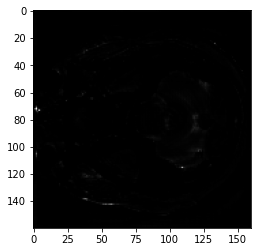

Epoch [   32/  100] | Batch [  800] | Loss: 0.2385 | Duration from start 2806.1077 


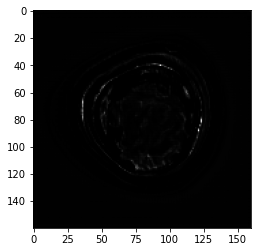

Epoch [   32/  100] | Batch [  900] | Loss: 0.2380 | Duration from start 3155.9626 


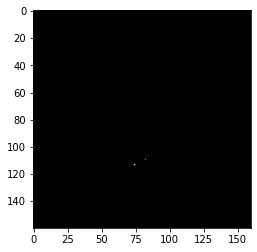

 32%|███▏      | 32/100 [29:43:33<63:10:39, 3344.70s/it]

END OF EPOCH: 32 	Validation Loss per image: 0.312689
Epoch [   33/  100] | Batch [  100] | Loss: 0.3326 | Duration from start 356.7783 


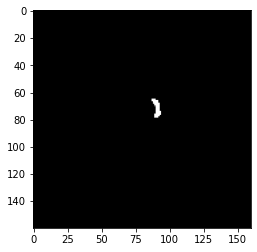

Epoch [   33/  100] | Batch [  200] | Loss: 0.2443 | Duration from start 706.5561 


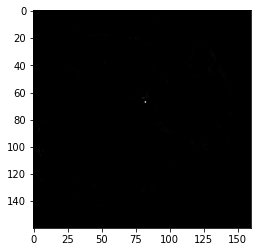

Epoch [   33/  100] | Batch [  300] | Loss: 0.2516 | Duration from start 1056.4125 


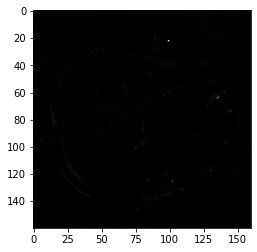

Epoch [   33/  100] | Batch [  400] | Loss: 0.2472 | Duration from start 1406.1219 


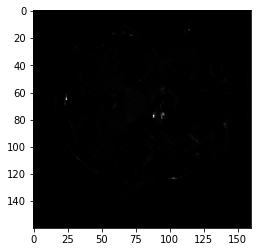

Epoch [   33/  100] | Batch [  500] | Loss: 0.2479 | Duration from start 1755.9743 


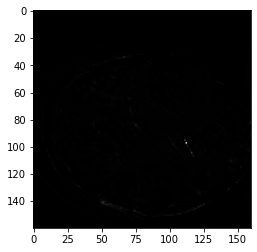

Epoch [   33/  100] | Batch [  600] | Loss: 0.2315 | Duration from start 2105.8573 


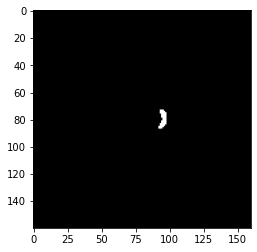

Epoch [   33/  100] | Batch [  700] | Loss: 0.2506 | Duration from start 2455.8768 


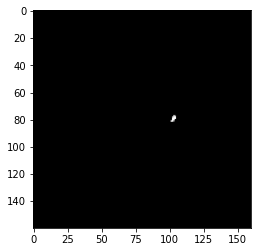

Epoch [   33/  100] | Batch [  800] | Loss: 0.2448 | Duration from start 2805.8486 


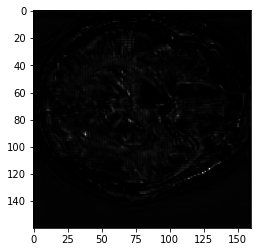

Epoch [   33/  100] | Batch [  900] | Loss: 0.2399 | Duration from start 3155.9036 


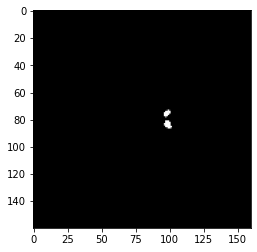

 33%|███▎      | 33/100 [30:39:18<62:15:05, 3344.85s/it]

END OF EPOCH: 33 	Validation Loss per image: 0.318198
Epoch [   34/  100] | Batch [  100] | Loss: 0.3234 | Duration from start 356.1754 


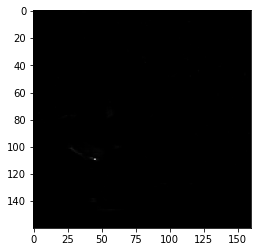

Epoch [   34/  100] | Batch [  200] | Loss: 0.2507 | Duration from start 706.0475 


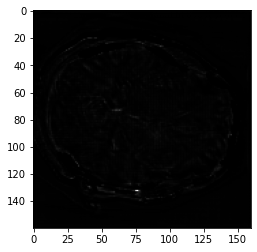

Epoch [   34/  100] | Batch [  300] | Loss: 0.2533 | Duration from start 1055.9197 


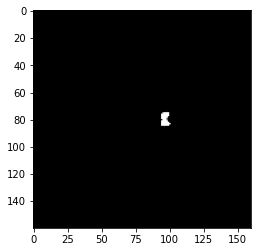

Epoch [   34/  100] | Batch [  400] | Loss: 0.2462 | Duration from start 1405.7354 


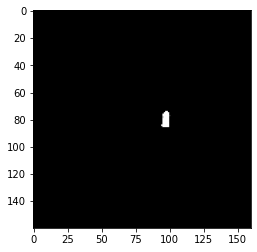

Epoch [   34/  100] | Batch [  500] | Loss: 0.2298 | Duration from start 1755.5272 


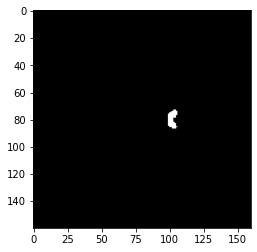

Epoch [   34/  100] | Batch [  600] | Loss: 0.2483 | Duration from start 2105.3633 


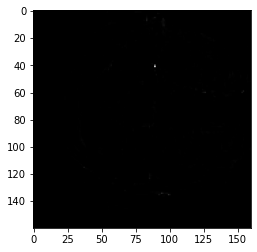

Epoch [   34/  100] | Batch [  700] | Loss: 0.2359 | Duration from start 2455.1375 


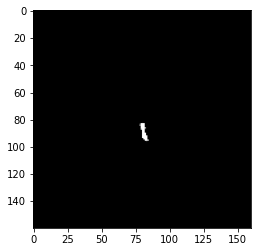

Epoch [   34/  100] | Batch [  800] | Loss: 0.2470 | Duration from start 2804.8939 


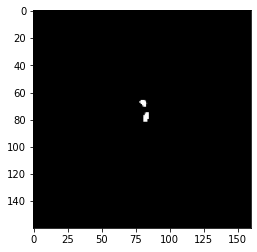

Epoch [   34/  100] | Batch [  900] | Loss: 0.2321 | Duration from start 3154.6665 


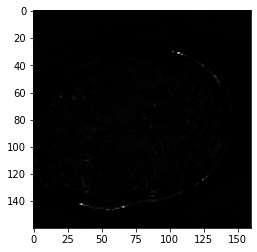

 34%|███▍      | 34/100 [31:35:01<61:18:42, 3344.28s/it]

END OF EPOCH: 34 	Validation Loss per image: 0.317447
Epoch [   35/  100] | Batch [  100] | Loss: 0.3266 | Duration from start 357.6392 


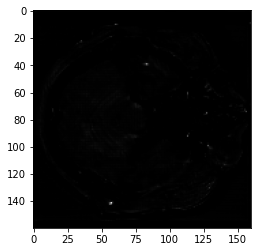

Epoch [   35/  100] | Batch [  200] | Loss: 0.2454 | Duration from start 707.4421 


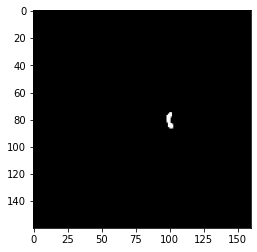

Epoch [   35/  100] | Batch [  300] | Loss: 0.2490 | Duration from start 1057.2307 


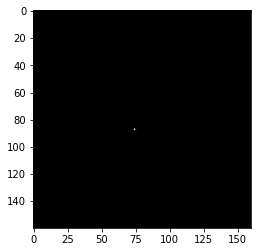

Epoch [   35/  100] | Batch [  400] | Loss: 0.2336 | Duration from start 1407.0092 


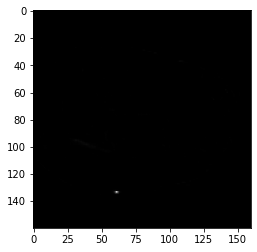

Epoch [   35/  100] | Batch [  500] | Loss: 0.2399 | Duration from start 1756.7807 


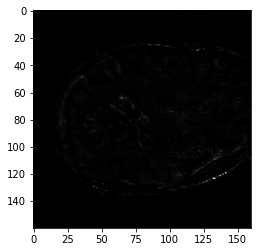

Epoch [   35/  100] | Batch [  600] | Loss: 0.2468 | Duration from start 2106.5373 


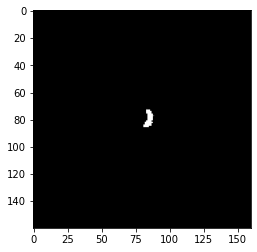

Epoch [   35/  100] | Batch [  700] | Loss: 0.2401 | Duration from start 2456.4182 


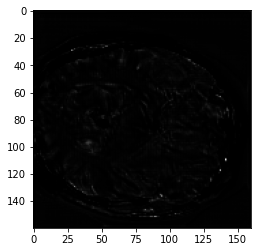

Epoch [   35/  100] | Batch [  800] | Loss: 0.2464 | Duration from start 2806.1846 


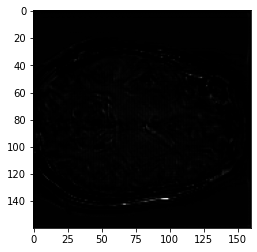

Epoch [   35/  100] | Batch [  900] | Loss: 0.2410 | Duration from start 3155.8764 


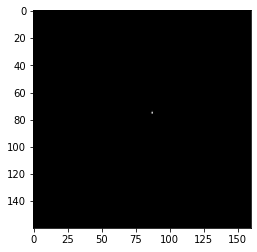

 35%|███▌      | 35/100 [32:30:47<60:23:34, 3344.85s/it]

END OF EPOCH: 35 	Validation Loss per image: 0.365191
Epoch [   36/  100] | Batch [  100] | Loss: 0.3026 | Duration from start 355.0171 


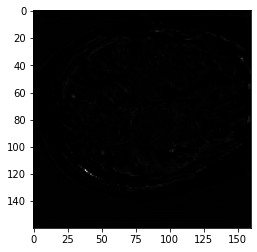

Epoch [   36/  100] | Batch [  200] | Loss: 0.2406 | Duration from start 704.8616 


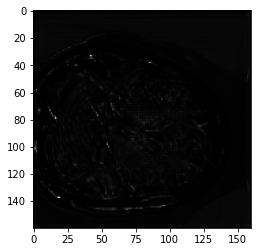

Epoch [   36/  100] | Batch [  300] | Loss: 0.2522 | Duration from start 1054.6684 


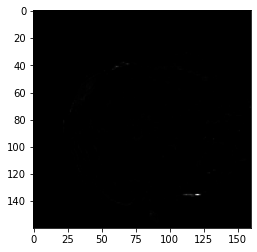

Epoch [   36/  100] | Batch [  400] | Loss: 0.2397 | Duration from start 1404.4877 


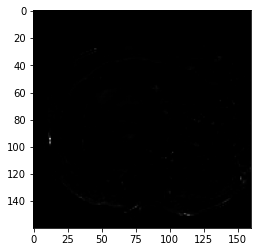

Epoch [   36/  100] | Batch [  500] | Loss: 0.2450 | Duration from start 1754.2632 


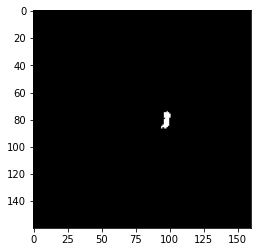

Epoch [   36/  100] | Batch [  600] | Loss: 0.2419 | Duration from start 2104.0736 


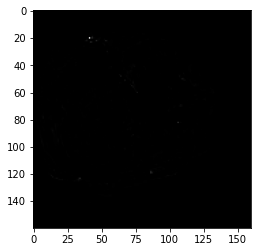

Epoch [   36/  100] | Batch [  700] | Loss: 0.2357 | Duration from start 2453.8263 


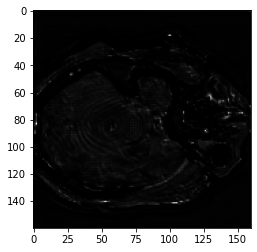

Epoch [   36/  100] | Batch [  800] | Loss: 0.2546 | Duration from start 2803.6635 


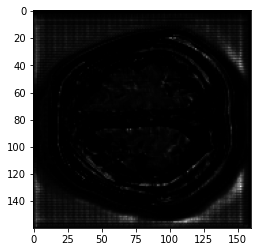

Epoch [   36/  100] | Batch [  900] | Loss: 0.2325 | Duration from start 3153.4926 


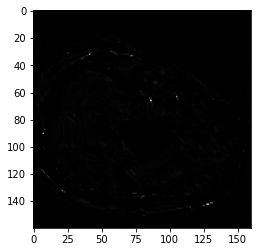

 36%|███▌      | 36/100 [33:26:33<59:28:00, 3345.01s/it]

END OF EPOCH: 36 	Validation Loss per image: 0.339279
Epoch [   37/  100] | Batch [  100] | Loss: 0.3123 | Duration from start 354.3626 


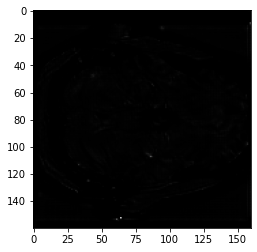

Epoch [   37/  100] | Batch [  200] | Loss: 0.2556 | Duration from start 704.0611 


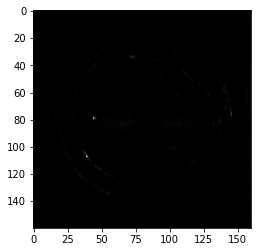

Epoch [   37/  100] | Batch [  300] | Loss: 0.2473 | Duration from start 1053.9081 


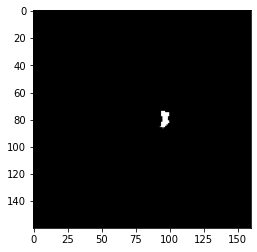

Epoch [   37/  100] | Batch [  400] | Loss: 0.2388 | Duration from start 1403.7678 


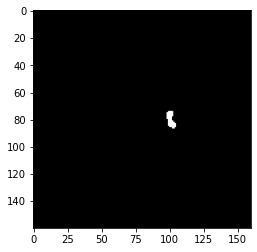

Epoch [   37/  100] | Batch [  500] | Loss: 0.2423 | Duration from start 1753.5981 


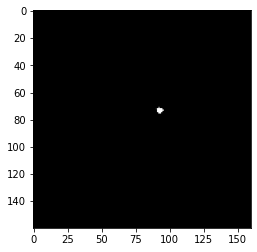

Epoch [   37/  100] | Batch [  600] | Loss: 0.2538 | Duration from start 2103.3433 


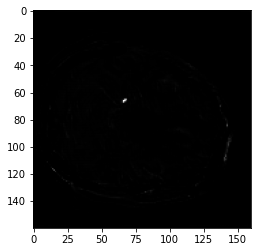

Epoch [   37/  100] | Batch [  700] | Loss: 0.2402 | Duration from start 2453.1807 


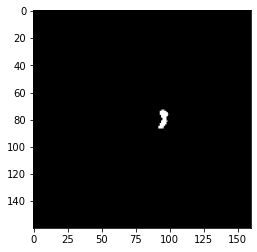

Epoch [   37/  100] | Batch [  800] | Loss: 0.2367 | Duration from start 2802.9876 


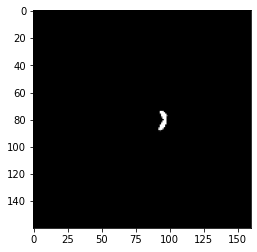

Epoch [   37/  100] | Batch [  900] | Loss: 0.2350 | Duration from start 3152.7515 


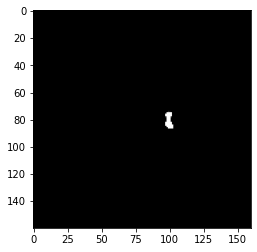

 37%|███▋      | 37/100 [34:22:15<58:31:14, 3344.05s/it]

END OF EPOCH: 37 	Validation Loss per image: 0.330949
Epoch [   38/  100] | Batch [  100] | Loss: 0.3128 | Duration from start 358.4424 


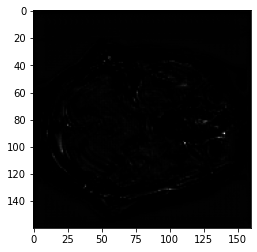

Epoch [   38/  100] | Batch [  200] | Loss: 0.2410 | Duration from start 708.1305 


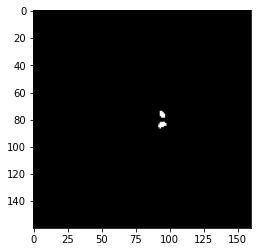

Epoch [   38/  100] | Batch [  300] | Loss: 0.2584 | Duration from start 1057.8692 


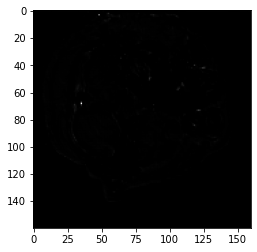

Epoch [   38/  100] | Batch [  400] | Loss: 0.2498 | Duration from start 1407.6604 


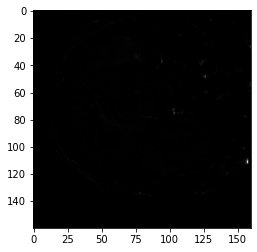

Epoch [   38/  100] | Batch [  500] | Loss: 0.2499 | Duration from start 1757.4313 


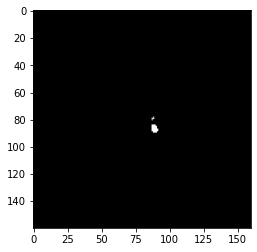

Epoch [   38/  100] | Batch [  600] | Loss: 0.2499 | Duration from start 2107.1243 


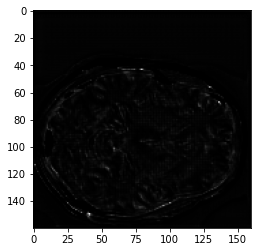

Epoch [   38/  100] | Batch [  700] | Loss: 0.2326 | Duration from start 2456.8949 


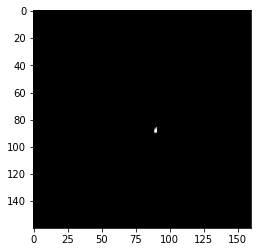

Epoch [   38/  100] | Batch [  800] | Loss: 0.2350 | Duration from start 2806.6891 


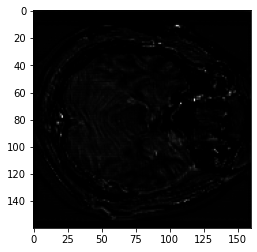

Epoch [   38/  100] | Batch [  900] | Loss: 0.2481 | Duration from start 3156.5037 


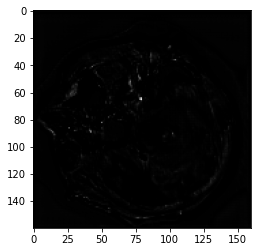

 38%|███▊      | 38/100 [35:18:00<57:35:52, 3344.40s/it]

END OF EPOCH: 38 	Validation Loss per image: 0.339658
Epoch [   39/  100] | Batch [  100] | Loss: 0.3214 | Duration from start 356.1412 


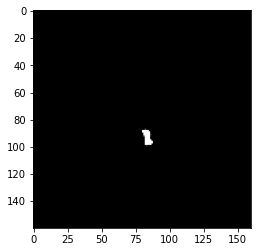

Epoch [   39/  100] | Batch [  200] | Loss: 0.2390 | Duration from start 705.9526 


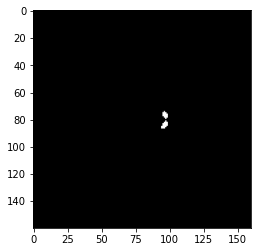

Epoch [   39/  100] | Batch [  300] | Loss: 0.2342 | Duration from start 1055.8371 


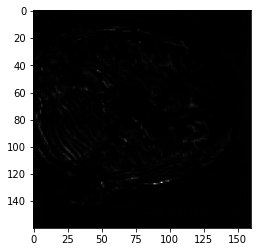

Epoch [   39/  100] | Batch [  400] | Loss: 0.2286 | Duration from start 1405.7034 


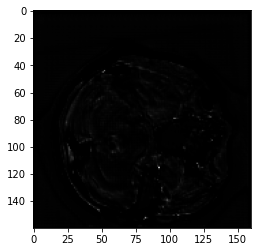

Epoch [   39/  100] | Batch [  500] | Loss: 0.2557 | Duration from start 1755.4761 


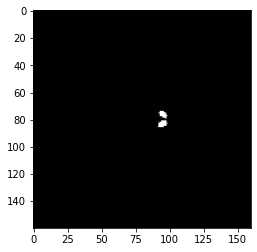

Epoch [   39/  100] | Batch [  600] | Loss: 0.2376 | Duration from start 2105.2210 


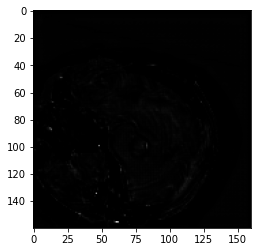

Epoch [   39/  100] | Batch [  700] | Loss: 0.2396 | Duration from start 2454.9351 


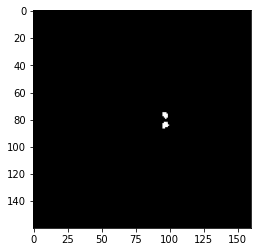

Epoch [   39/  100] | Batch [  800] | Loss: 0.2378 | Duration from start 2804.7411 


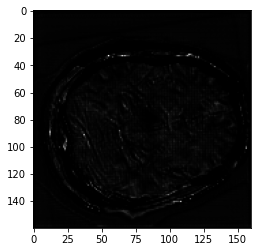

Epoch [   39/  100] | Batch [  900] | Loss: 0.2432 | Duration from start 3154.5061 


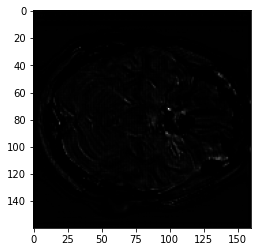

 39%|███▉      | 39/100 [36:13:44<56:39:59, 3344.25s/it]

END OF EPOCH: 39 	Validation Loss per image: 0.313572
Epoch [   40/  100] | Batch [  100] | Loss: 0.3014 | Duration from start 355.7170 


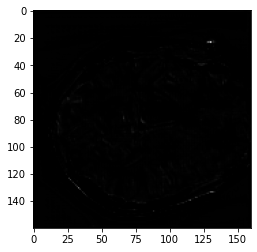

Epoch [   40/  100] | Batch [  200] | Loss: 0.2512 | Duration from start 705.6112 


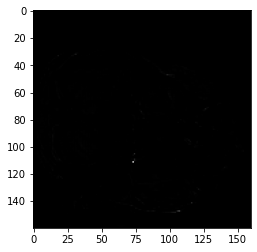

Epoch [   40/  100] | Batch [  300] | Loss: 0.2267 | Duration from start 1055.4043 


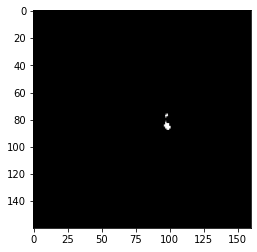

Epoch [   40/  100] | Batch [  400] | Loss: 0.2427 | Duration from start 1405.1449 


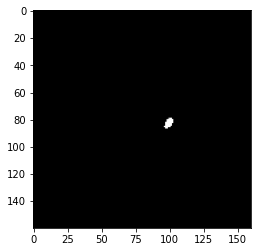

Epoch [   40/  100] | Batch [  500] | Loss: 0.2255 | Duration from start 1754.9584 


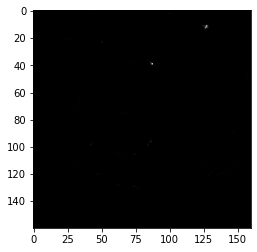

Epoch [   40/  100] | Batch [  600] | Loss: 0.2434 | Duration from start 2104.7384 


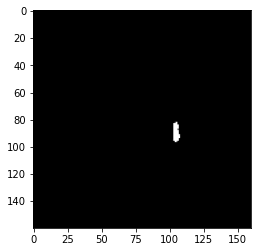

Epoch [   40/  100] | Batch [  700] | Loss: 0.2434 | Duration from start 2454.5069 


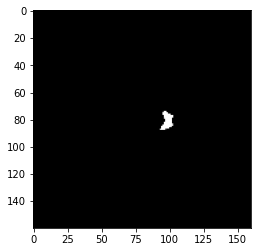

Epoch [   40/  100] | Batch [  800] | Loss: 0.2526 | Duration from start 2804.2946 


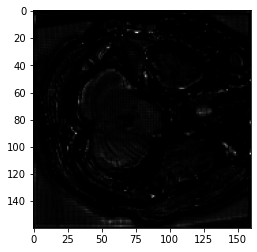

Epoch [   40/  100] | Batch [  900] | Loss: 0.2336 | Duration from start 3154.1153 


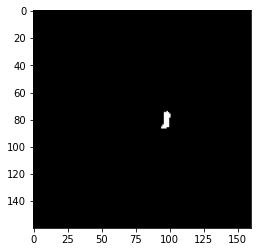

 40%|████      | 40/100 [37:09:26<55:43:47, 3343.80s/it]

END OF EPOCH: 40 	Validation Loss per image: 0.315831
Epoch [   41/  100] | Batch [  100] | Loss: 0.3119 | Duration from start 355.9191 


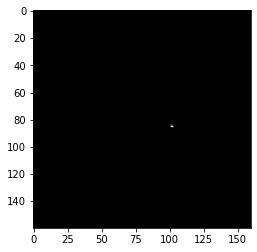

Epoch [   41/  100] | Batch [  200] | Loss: 0.2281 | Duration from start 705.7428 


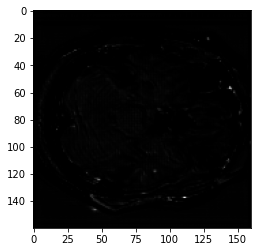

Epoch [   41/  100] | Batch [  300] | Loss: 0.2305 | Duration from start 1055.5318 


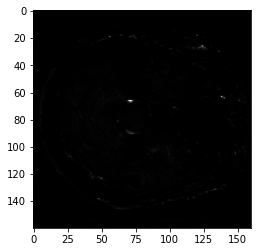

Epoch [   41/  100] | Batch [  400] | Loss: 0.2450 | Duration from start 1405.2670 


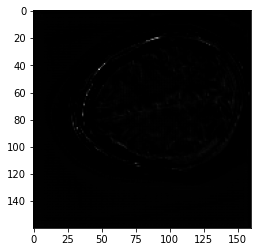

Epoch [   41/  100] | Batch [  500] | Loss: 0.2434 | Duration from start 1754.9999 


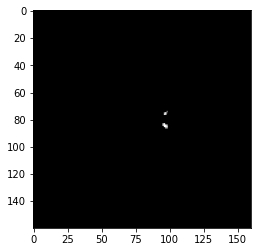

Epoch [   41/  100] | Batch [  600] | Loss: 0.2273 | Duration from start 2104.7926 


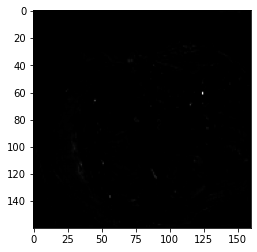

Epoch [   41/  100] | Batch [  700] | Loss: 0.2533 | Duration from start 2454.5819 


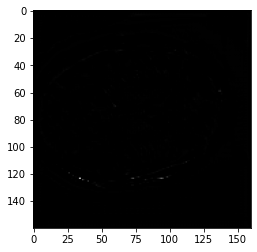

Epoch [   41/  100] | Batch [  800] | Loss: 0.2590 | Duration from start 2804.3986 


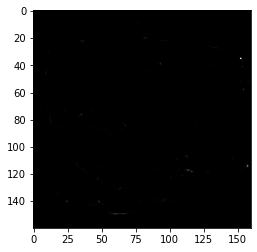

Epoch [   41/  100] | Batch [  900] | Loss: 0.2238 | Duration from start 3154.1931 


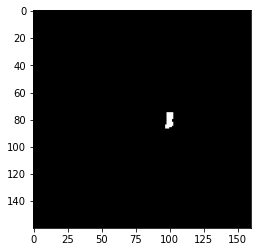

 41%|████      | 41/100 [38:05:12<54:48:35, 3344.33s/it]

END OF EPOCH: 41 	Validation Loss per image: 0.336886
Epoch [   42/  100] | Batch [  100] | Loss: 0.3247 | Duration from start 356.6093 


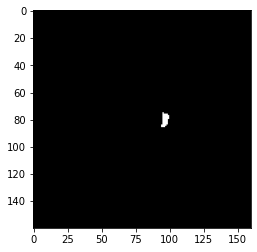

Epoch [   42/  100] | Batch [  200] | Loss: 0.2385 | Duration from start 706.3972 


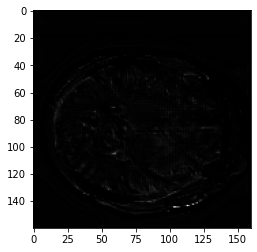

Epoch [   42/  100] | Batch [  300] | Loss: 0.2441 | Duration from start 1056.1356 


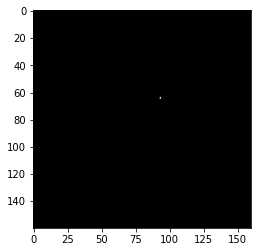

Epoch [   42/  100] | Batch [  400] | Loss: 0.2400 | Duration from start 1405.8589 


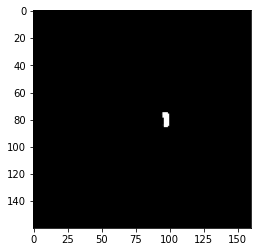

Epoch [   42/  100] | Batch [  500] | Loss: 0.2396 | Duration from start 1755.6810 


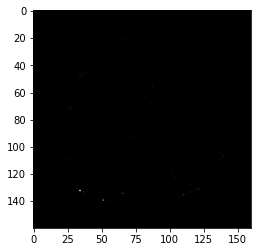

Epoch [   42/  100] | Batch [  600] | Loss: 0.2430 | Duration from start 2105.4411 


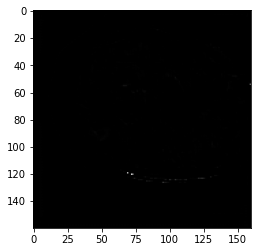

Epoch [   42/  100] | Batch [  700] | Loss: 0.2360 | Duration from start 2455.3376 


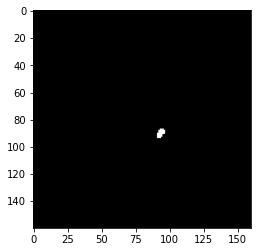

Epoch [   42/  100] | Batch [  800] | Loss: 0.2498 | Duration from start 2805.1440 


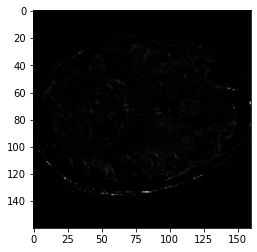

Epoch [   42/  100] | Batch [  900] | Loss: 0.2405 | Duration from start 3154.9042 


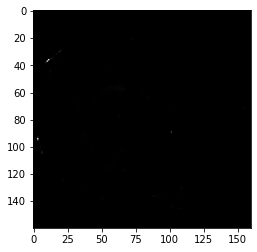

 42%|████▏     | 42/100 [39:00:57<53:52:56, 3344.42s/it]

END OF EPOCH: 42 	Validation Loss per image: 0.343987
Epoch [   43/  100] | Batch [  100] | Loss: 0.3138 | Duration from start 356.1426 


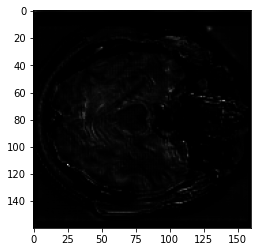

Epoch [   43/  100] | Batch [  200] | Loss: 0.2299 | Duration from start 706.0240 


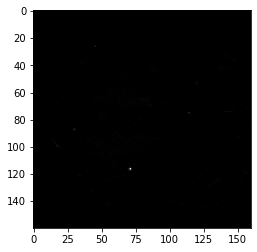

Epoch [   43/  100] | Batch [  300] | Loss: 0.2298 | Duration from start 1055.8595 


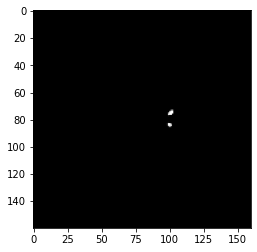

Epoch [   43/  100] | Batch [  400] | Loss: 0.2353 | Duration from start 1405.6739 


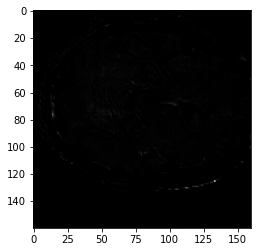

Epoch [   43/  100] | Batch [  500] | Loss: 0.2336 | Duration from start 1755.4923 


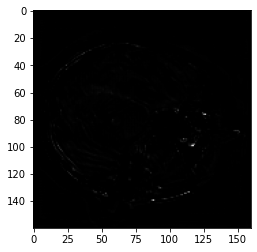

Epoch [   43/  100] | Batch [  600] | Loss: 0.2390 | Duration from start 2105.3694 


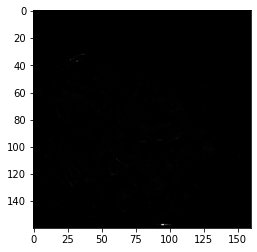

Epoch [   43/  100] | Batch [  700] | Loss: 0.2534 | Duration from start 2455.0964 


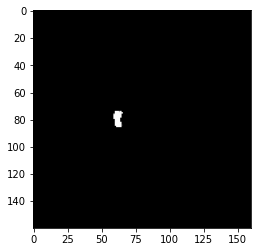

Epoch [   43/  100] | Batch [  800] | Loss: 0.2413 | Duration from start 2804.9065 


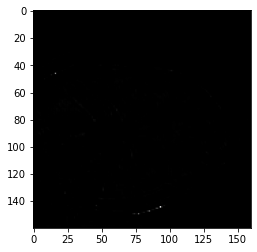

Epoch [   43/  100] | Batch [  900] | Loss: 0.2521 | Duration from start 3154.7002 


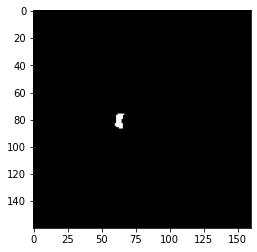

 43%|████▎     | 43/100 [39:56:40<52:57:03, 3344.27s/it]

END OF EPOCH: 43 	Validation Loss per image: 0.310379
Epoch [   44/  100] | Batch [  100] | Loss: 0.3024 | Duration from start 354.4064 


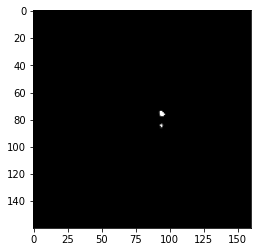

Epoch [   44/  100] | Batch [  200] | Loss: 0.2390 | Duration from start 704.1413 


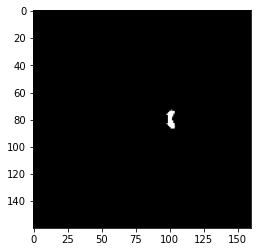

Epoch [   44/  100] | Batch [  300] | Loss: 0.2618 | Duration from start 1053.9966 


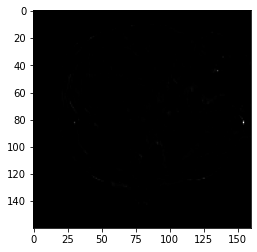

Epoch [   44/  100] | Batch [  400] | Loss: 0.2328 | Duration from start 1403.7793 


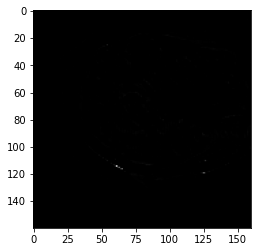

Epoch [   44/  100] | Batch [  500] | Loss: 0.2421 | Duration from start 1753.5530 


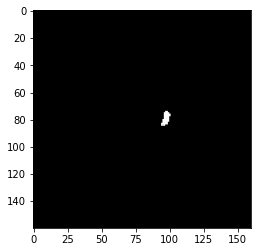

Epoch [   44/  100] | Batch [  600] | Loss: 0.2271 | Duration from start 2103.2738 


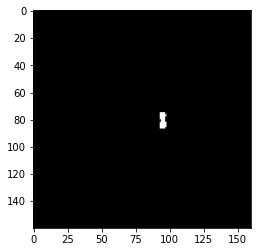

Epoch [   44/  100] | Batch [  700] | Loss: 0.2388 | Duration from start 2453.0582 


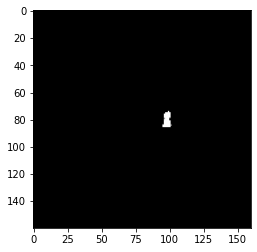

Epoch [   44/  100] | Batch [  800] | Loss: 0.2371 | Duration from start 2802.7988 


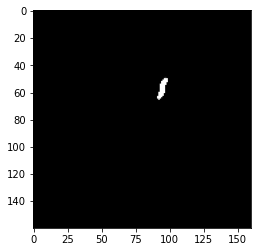

Epoch [   44/  100] | Batch [  900] | Loss: 0.2580 | Duration from start 3152.5281 


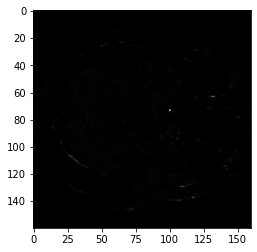

 44%|████▍     | 44/100 [40:52:22<52:00:25, 3343.32s/it]

END OF EPOCH: 44 	Validation Loss per image: 0.446241
Epoch [   45/  100] | Batch [  100] | Loss: 0.3205 | Duration from start 354.4011 


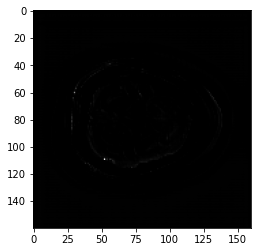

Epoch [   45/  100] | Batch [  200] | Loss: 0.2340 | Duration from start 704.1978 


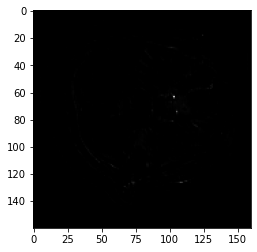

Epoch [   45/  100] | Batch [  300] | Loss: 0.2337 | Duration from start 1053.9174 


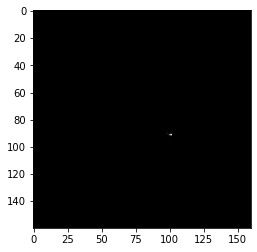

Epoch [   45/  100] | Batch [  400] | Loss: 0.2232 | Duration from start 1403.7317 


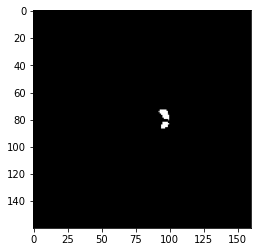

Epoch [   45/  100] | Batch [  500] | Loss: 0.2385 | Duration from start 1753.4804 


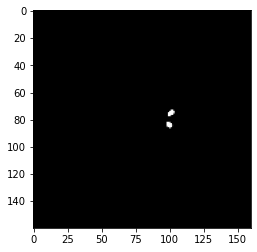

Epoch [   45/  100] | Batch [  600] | Loss: 0.2348 | Duration from start 2103.3118 


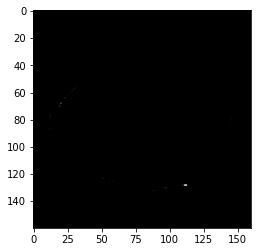

Epoch [   45/  100] | Batch [  700] | Loss: 0.2567 | Duration from start 2453.0754 


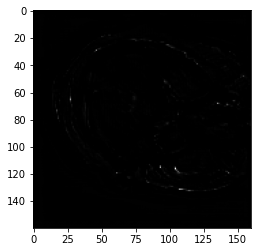

Epoch [   45/  100] | Batch [  800] | Loss: 0.2470 | Duration from start 2802.8390 


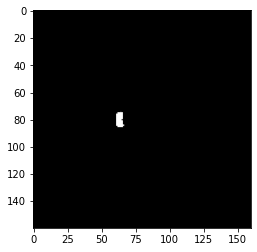

Epoch [   45/  100] | Batch [  900] | Loss: 0.2329 | Duration from start 3152.6147 


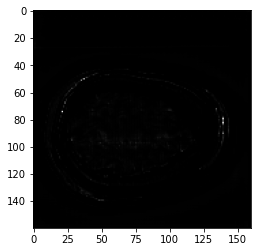

 45%|████▌     | 45/100 [41:48:04<51:04:22, 3342.95s/it]

END OF EPOCH: 45 	Validation Loss per image: 0.307235
Epoch [   46/  100] | Batch [  100] | Loss: 0.3055 | Duration from start 356.0941 


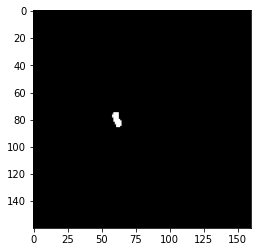

Epoch [   46/  100] | Batch [  200] | Loss: 0.2279 | Duration from start 705.9574 


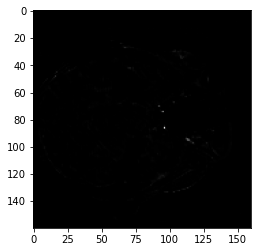

Epoch [   46/  100] | Batch [  300] | Loss: 0.2563 | Duration from start 1055.7600 


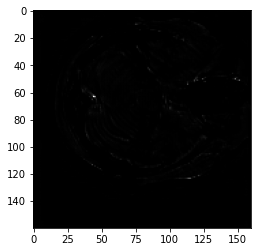

Epoch [   46/  100] | Batch [  400] | Loss: 0.2264 | Duration from start 1405.5890 


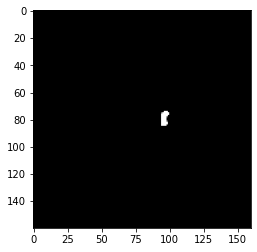

Epoch [   46/  100] | Batch [  500] | Loss: 0.2290 | Duration from start 1755.3976 


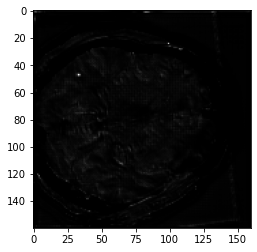

Epoch [   46/  100] | Batch [  600] | Loss: 0.2516 | Duration from start 2105.1592 


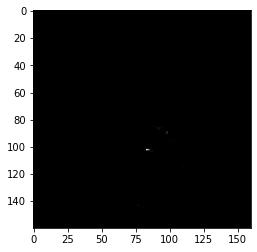

Epoch [   46/  100] | Batch [  700] | Loss: 0.2238 | Duration from start 2454.9050 


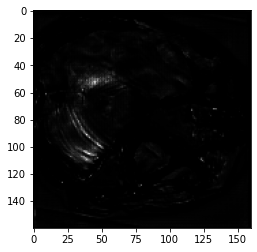

Epoch [   46/  100] | Batch [  800] | Loss: 0.2291 | Duration from start 2804.5958 


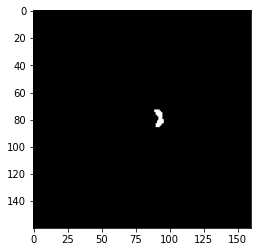

Epoch [   46/  100] | Batch [  900] | Loss: 0.2367 | Duration from start 3154.3060 


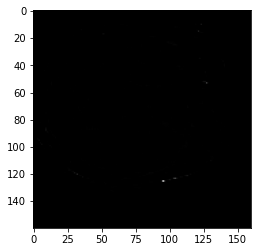

 46%|████▌     | 46/100 [42:43:47<50:08:50, 3343.16s/it]

END OF EPOCH: 46 	Validation Loss per image: 0.320958
Epoch [   47/  100] | Batch [  100] | Loss: 0.3062 | Duration from start 357.5274 


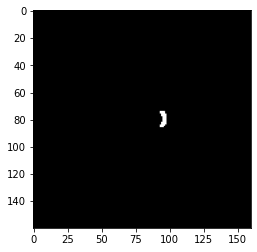

Epoch [   47/  100] | Batch [  200] | Loss: 0.2416 | Duration from start 707.3466 


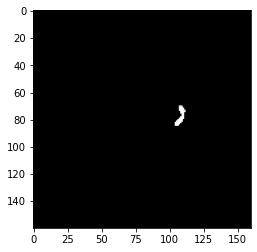

Epoch [   47/  100] | Batch [  300] | Loss: 0.2343 | Duration from start 1057.1332 


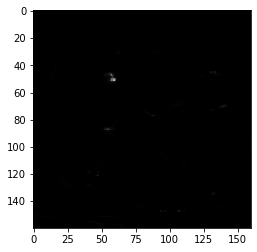

Epoch [   47/  100] | Batch [  400] | Loss: 0.2299 | Duration from start 1406.8932 


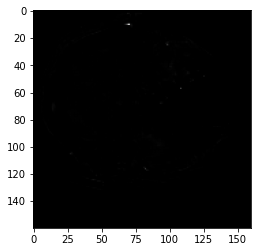

Epoch [   47/  100] | Batch [  500] | Loss: 0.2409 | Duration from start 1756.7196 


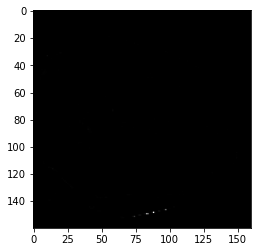

Epoch [   47/  100] | Batch [  600] | Loss: 0.2246 | Duration from start 2106.5410 


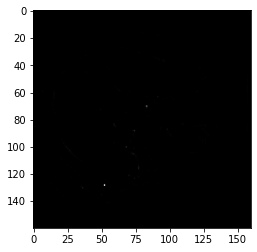

Epoch [   47/  100] | Batch [  700] | Loss: 0.2381 | Duration from start 2456.3378 


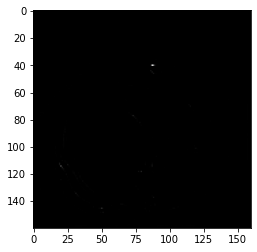

Epoch [   47/  100] | Batch [  800] | Loss: 0.2495 | Duration from start 2806.1139 


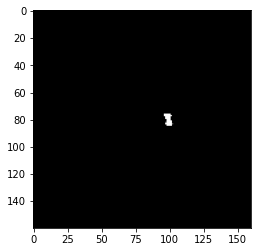

Epoch [   47/  100] | Batch [  900] | Loss: 0.2323 | Duration from start 3155.8452 


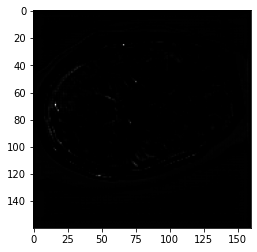

 47%|████▋     | 47/100 [43:39:32<49:13:32, 3343.62s/it]

END OF EPOCH: 47 	Validation Loss per image: 0.297486
Epoch [   48/  100] | Batch [  100] | Loss: 0.3052 | Duration from start 358.1993 


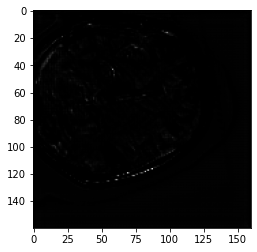

Epoch [   48/  100] | Batch [  200] | Loss: 0.2295 | Duration from start 707.9105 


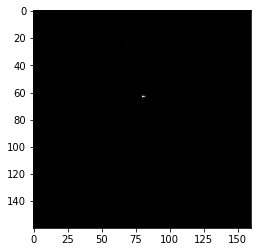

Epoch [   48/  100] | Batch [  300] | Loss: 0.2403 | Duration from start 1057.7413 


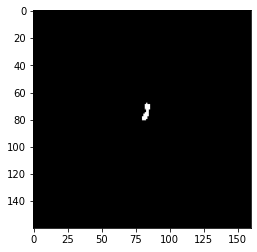

Epoch [   48/  100] | Batch [  400] | Loss: 0.2426 | Duration from start 1407.5290 


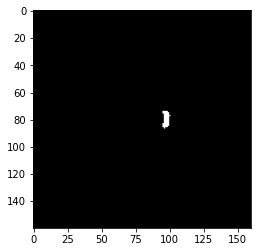

Epoch [   48/  100] | Batch [  500] | Loss: 0.2338 | Duration from start 1757.4121 


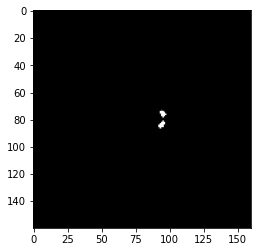

Epoch [   48/  100] | Batch [  600] | Loss: 0.2320 | Duration from start 2107.1773 


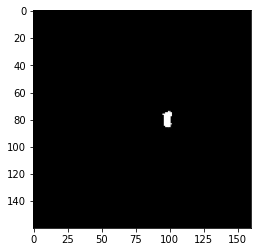

Epoch [   48/  100] | Batch [  700] | Loss: 0.2294 | Duration from start 2457.0858 


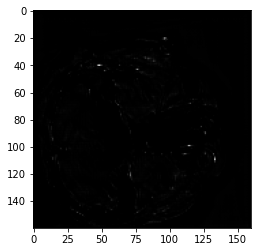

Epoch [   48/  100] | Batch [  800] | Loss: 0.2527 | Duration from start 2806.9525 


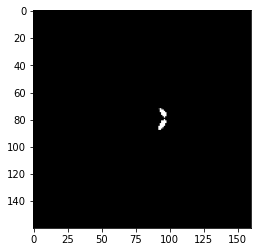

Epoch [   48/  100] | Batch [  900] | Loss: 0.2247 | Duration from start 3156.7678 


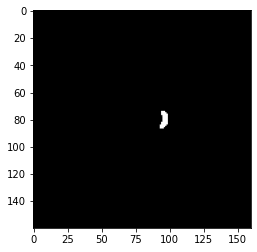

 48%|████▊     | 48/100 [44:35:18<48:18:27, 3344.38s/it]

END OF EPOCH: 48 	Validation Loss per image: 0.299402
Epoch [   49/  100] | Batch [  100] | Loss: 0.3053 | Duration from start 356.5294 


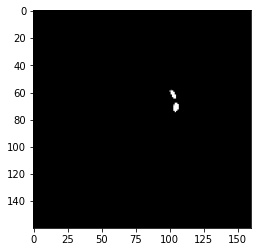

Epoch [   49/  100] | Batch [  200] | Loss: 0.2530 | Duration from start 706.3064 


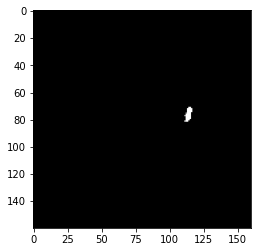

Epoch [   49/  100] | Batch [  300] | Loss: 0.2429 | Duration from start 1056.0515 


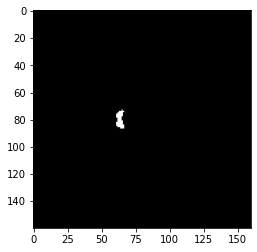

Epoch [   49/  100] | Batch [  400] | Loss: 0.2278 | Duration from start 1405.8187 


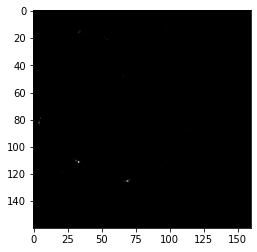

Epoch [   49/  100] | Batch [  500] | Loss: 0.2384 | Duration from start 1755.6248 


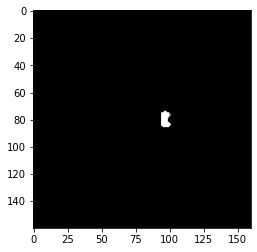

Epoch [   49/  100] | Batch [  600] | Loss: 0.2284 | Duration from start 2105.3483 


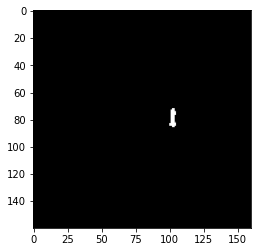

Epoch [   49/  100] | Batch [  700] | Loss: 0.2291 | Duration from start 2455.0932 


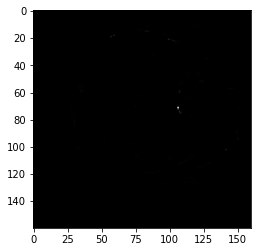

Epoch [   49/  100] | Batch [  800] | Loss: 0.2272 | Duration from start 2804.8547 


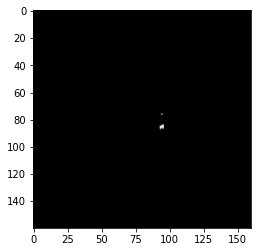

Epoch [   49/  100] | Batch [  900] | Loss: 0.2494 | Duration from start 3154.6391 


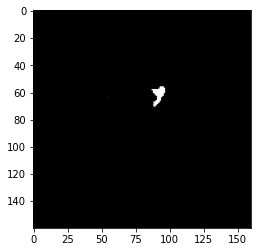

 49%|████▉     | 49/100 [45:31:04<47:23:04, 3344.79s/it]

END OF EPOCH: 49 	Validation Loss per image: 0.331976
Epoch [   50/  100] | Batch [  100] | Loss: 0.2992 | Duration from start 356.1734 


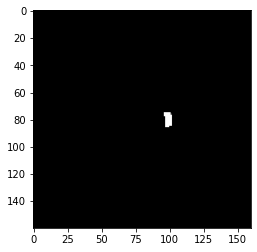

Epoch [   50/  100] | Batch [  200] | Loss: 0.2324 | Duration from start 706.0399 


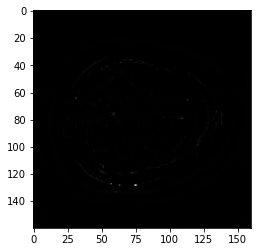

Epoch [   50/  100] | Batch [  300] | Loss: 0.2394 | Duration from start 1055.7815 


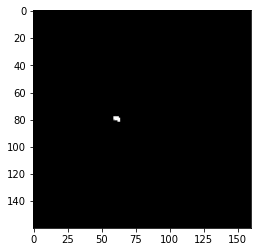

Epoch [   50/  100] | Batch [  400] | Loss: 0.2363 | Duration from start 1405.5532 


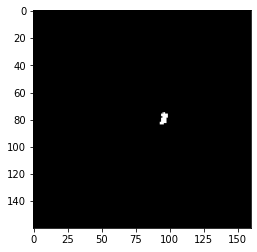

Epoch [   50/  100] | Batch [  500] | Loss: 0.2506 | Duration from start 1755.2847 


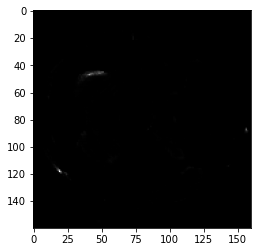

Epoch [   50/  100] | Batch [  600] | Loss: 0.2294 | Duration from start 2105.1230 


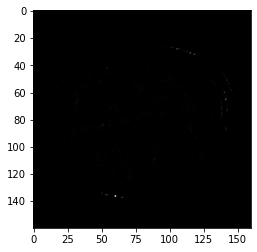

Epoch [   50/  100] | Batch [  700] | Loss: 0.2430 | Duration from start 2454.8651 


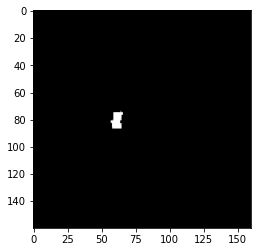

Epoch [   50/  100] | Batch [  800] | Loss: 0.2244 | Duration from start 2804.6519 


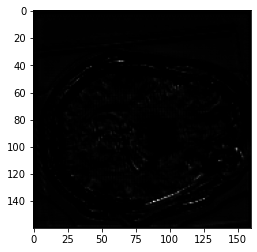

Epoch [   50/  100] | Batch [  900] | Loss: 0.2294 | Duration from start 3154.4434 


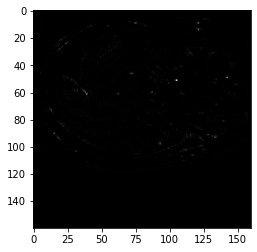

 50%|█████     | 50/100 [46:26:48<46:27:07, 3344.55s/it]

END OF EPOCH: 50 	Validation Loss per image: 0.309107
Epoch [   51/  100] | Batch [  100] | Loss: 0.3156 | Duration from start 355.8135 


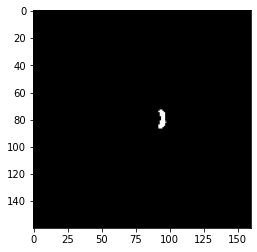

Epoch [   51/  100] | Batch [  200] | Loss: 0.2286 | Duration from start 705.6369 


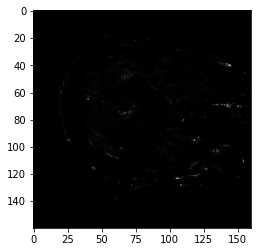

Epoch [   51/  100] | Batch [  300] | Loss: 0.2433 | Duration from start 1055.4051 


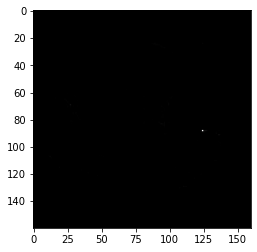

Epoch [   51/  100] | Batch [  400] | Loss: 0.2362 | Duration from start 1405.1581 


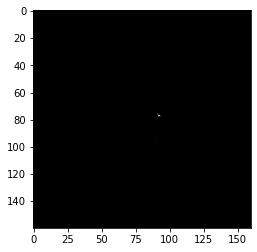

Epoch [   51/  100] | Batch [  500] | Loss: 0.2344 | Duration from start 1754.8710 


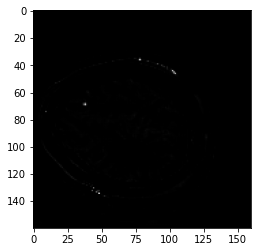

Epoch [   51/  100] | Batch [  600] | Loss: 0.2411 | Duration from start 2104.5669 


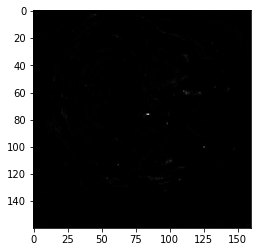

Epoch [   51/  100] | Batch [  700] | Loss: 0.2362 | Duration from start 2454.3381 


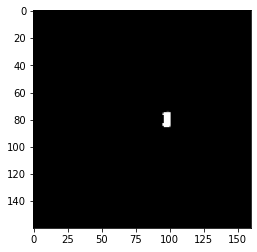

Epoch [   51/  100] | Batch [  800] | Loss: 0.2334 | Duration from start 2804.1044 


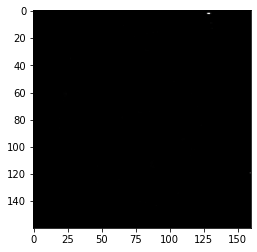

Epoch [   51/  100] | Batch [  900] | Loss: 0.2138 | Duration from start 3153.8476 


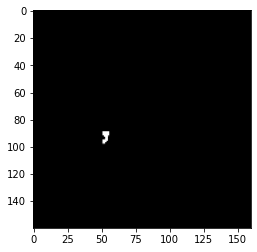

 51%|█████     | 51/100 [47:22:30<45:30:49, 3343.88s/it]

END OF EPOCH: 51 	Validation Loss per image: 0.324373
Epoch [   52/  100] | Batch [  100] | Loss: 0.3241 | Duration from start 357.3662 


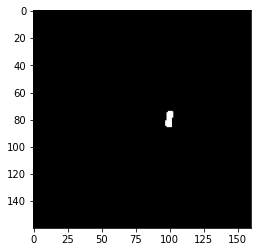

Epoch [   52/  100] | Batch [  200] | Loss: 0.2516 | Duration from start 707.1910 


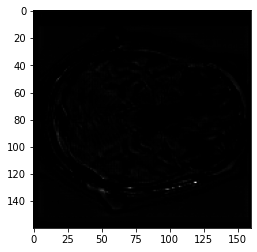

Epoch [   52/  100] | Batch [  300] | Loss: 0.2212 | Duration from start 1057.0500 


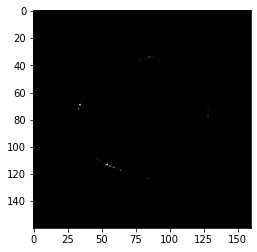

Epoch [   52/  100] | Batch [  400] | Loss: 0.2225 | Duration from start 1406.8785 


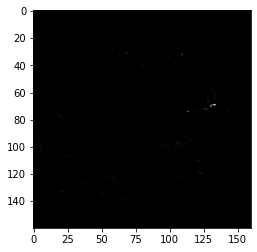

Epoch [   52/  100] | Batch [  500] | Loss: 0.2326 | Duration from start 1756.7903 


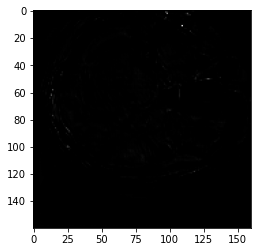

Epoch [   52/  100] | Batch [  600] | Loss: 0.2156 | Duration from start 2106.5964 


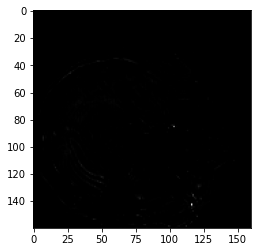

Epoch [   52/  100] | Batch [  700] | Loss: 0.2410 | Duration from start 2456.4195 


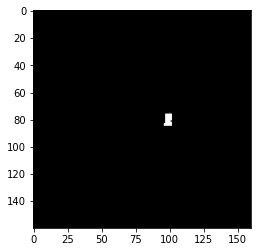

Epoch [   52/  100] | Batch [  800] | Loss: 0.2265 | Duration from start 2806.1818 


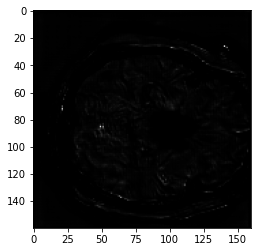

Epoch [   52/  100] | Batch [  900] | Loss: 0.2534 | Duration from start 3156.0645 


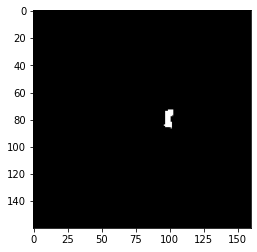

 52%|█████▏    | 52/100 [48:18:16<44:35:33, 3344.44s/it]

END OF EPOCH: 52 	Validation Loss per image: 0.320598
Epoch [   53/  100] | Batch [  100] | Loss: 0.2902 | Duration from start 354.4048 


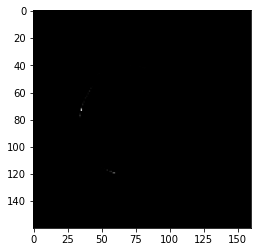

Epoch [   53/  100] | Batch [  200] | Loss: 0.2556 | Duration from start 704.2244 


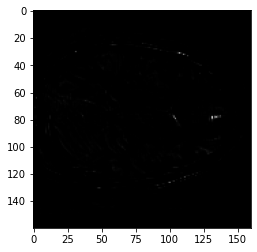

Epoch [   53/  100] | Batch [  300] | Loss: 0.2215 | Duration from start 1054.0764 


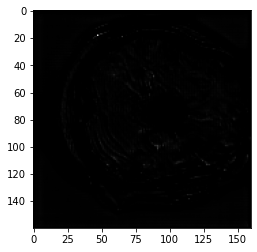

Epoch [   53/  100] | Batch [  400] | Loss: 0.2509 | Duration from start 1403.9285 


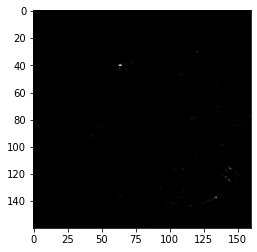

Epoch [   53/  100] | Batch [  500] | Loss: 0.2326 | Duration from start 1753.7789 


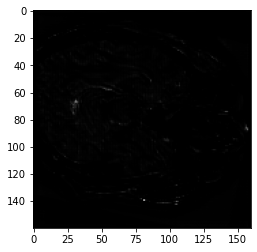

Epoch [   53/  100] | Batch [  600] | Loss: 0.2346 | Duration from start 2103.6225 


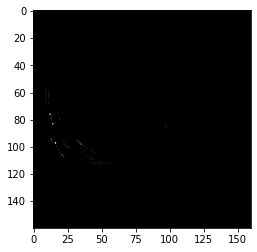

Epoch [   53/  100] | Batch [  700] | Loss: 0.2356 | Duration from start 2453.5121 


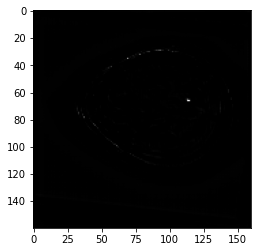

Epoch [   53/  100] | Batch [  800] | Loss: 0.2295 | Duration from start 2803.3690 


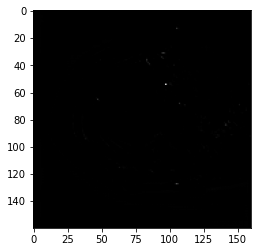

Epoch [   53/  100] | Batch [  900] | Loss: 0.2336 | Duration from start 3153.2091 


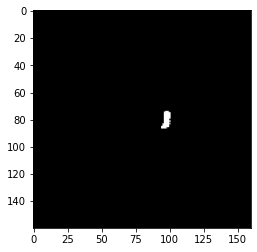

 53%|█████▎    | 53/100 [49:13:57<43:39:07, 3343.56s/it]

END OF EPOCH: 53 	Validation Loss per image: 0.313230
Epoch [   54/  100] | Batch [  100] | Loss: 0.3149 | Duration from start 356.4240 


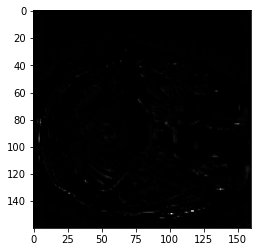

Epoch [   54/  100] | Batch [  200] | Loss: 0.2219 | Duration from start 706.2751 


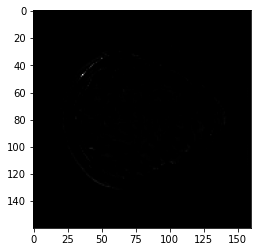

Epoch [   54/  100] | Batch [  300] | Loss: 0.2276 | Duration from start 1056.0014 


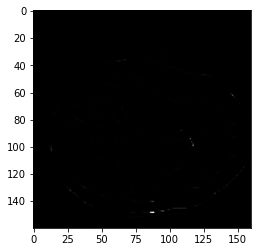

Epoch [   54/  100] | Batch [  400] | Loss: 0.2275 | Duration from start 1405.8728 


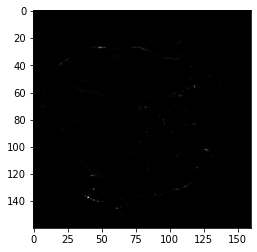

Epoch [   54/  100] | Batch [  500] | Loss: 0.2255 | Duration from start 1755.7326 


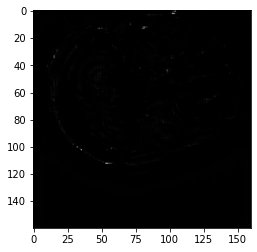

Epoch [   54/  100] | Batch [  600] | Loss: 0.2445 | Duration from start 2105.4555 


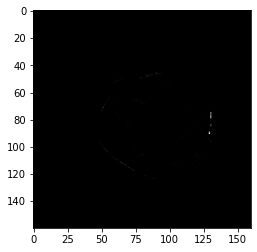

Epoch [   54/  100] | Batch [  700] | Loss: 0.2347 | Duration from start 2455.2994 


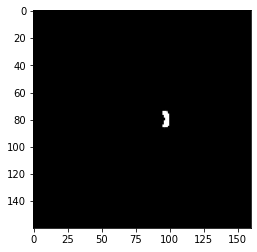

Epoch [   54/  100] | Batch [  800] | Loss: 0.2302 | Duration from start 2805.1576 


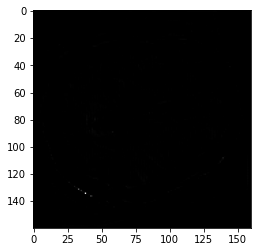

Epoch [   54/  100] | Batch [  900] | Loss: 0.2411 | Duration from start 3154.9807 


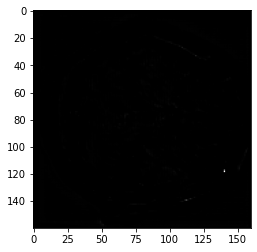

 54%|█████▍    | 54/100 [50:09:40<42:43:11, 3343.29s/it]

END OF EPOCH: 54 	Validation Loss per image: 0.304415
Epoch [   55/  100] | Batch [  100] | Loss: 0.3156 | Duration from start 355.6941 


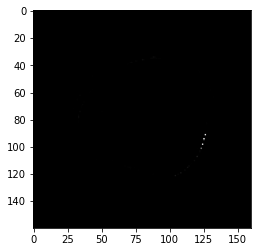

Epoch [   55/  100] | Batch [  200] | Loss: 0.2322 | Duration from start 705.5653 


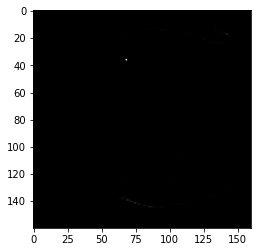

Epoch [   55/  100] | Batch [  300] | Loss: 0.2394 | Duration from start 1055.4099 


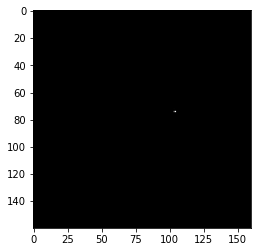

Epoch [   55/  100] | Batch [  400] | Loss: 0.2327 | Duration from start 1405.2873 


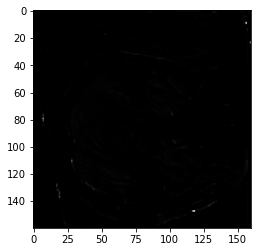

Epoch [   55/  100] | Batch [  500] | Loss: 0.2195 | Duration from start 1755.1314 


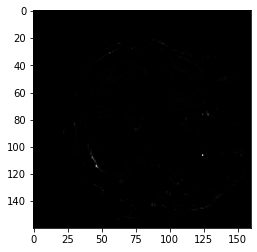

Epoch [   55/  100] | Batch [  600] | Loss: 0.2269 | Duration from start 2104.9585 


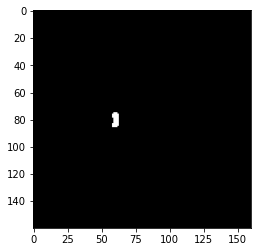

Epoch [   55/  100] | Batch [  700] | Loss: 0.2358 | Duration from start 2454.7008 


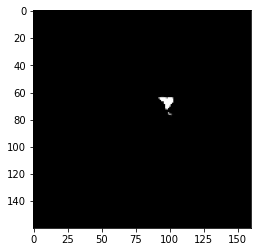

Epoch [   55/  100] | Batch [  800] | Loss: 0.2356 | Duration from start 2804.5246 


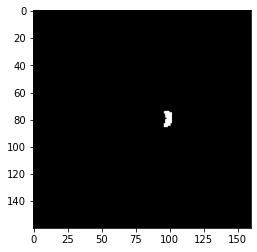

Epoch [   55/  100] | Batch [  900] | Loss: 0.2249 | Duration from start 3154.3743 


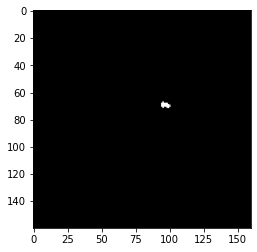

 55%|█████▌    | 55/100 [51:05:22<41:47:08, 3342.85s/it]

END OF EPOCH: 55 	Validation Loss per image: 0.307478
Epoch [   56/  100] | Batch [  100] | Loss: 0.3058 | Duration from start 356.5847 


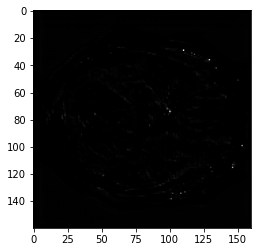

Epoch [   56/  100] | Batch [  200] | Loss: 0.2393 | Duration from start 706.3780 


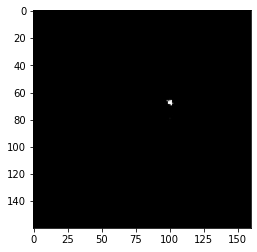

Epoch [   56/  100] | Batch [  300] | Loss: 0.2443 | Duration from start 1056.1957 


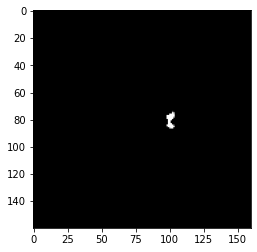

Epoch [   56/  100] | Batch [  400] | Loss: 0.2416 | Duration from start 1405.9908 


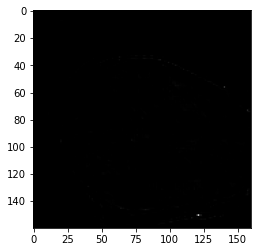

Epoch [   56/  100] | Batch [  500] | Loss: 0.2355 | Duration from start 1755.8179 


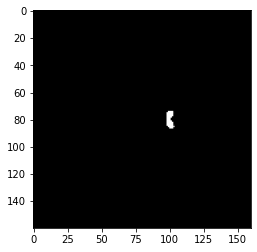

Epoch [   56/  100] | Batch [  600] | Loss: 0.2264 | Duration from start 2105.6117 


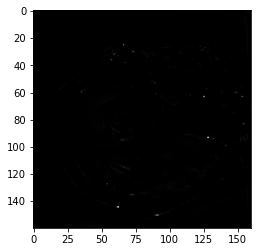

Epoch [   56/  100] | Batch [  700] | Loss: 0.2416 | Duration from start 2455.4268 


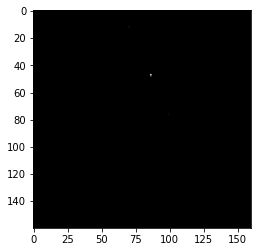

Epoch [   56/  100] | Batch [  800] | Loss: 0.2211 | Duration from start 2805.2235 


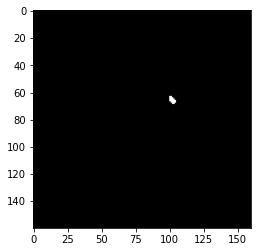

Epoch [   56/  100] | Batch [  900] | Loss: 0.2372 | Duration from start 3155.0401 


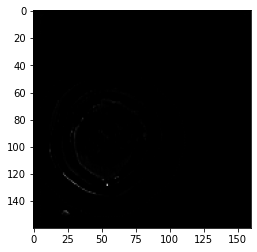

 56%|█████▌    | 56/100 [52:01:06<40:51:45, 3343.32s/it]

END OF EPOCH: 56 	Validation Loss per image: 0.307263
Epoch [   57/  100] | Batch [  100] | Loss: 0.3181 | Duration from start 355.9522 


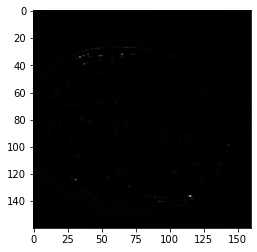

Epoch [   57/  100] | Batch [  200] | Loss: 0.2422 | Duration from start 705.7153 


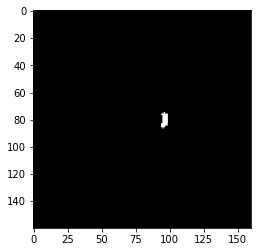

Epoch [   57/  100] | Batch [  300] | Loss: 0.2198 | Duration from start 1055.5375 


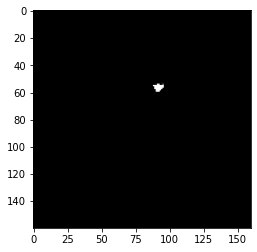

Epoch [   57/  100] | Batch [  400] | Loss: 0.2199 | Duration from start 1405.3741 


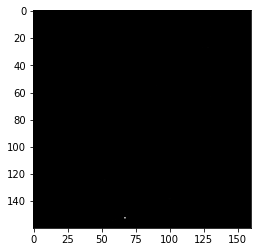

Epoch [   57/  100] | Batch [  500] | Loss: 0.2293 | Duration from start 1755.1639 


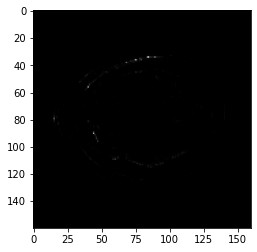

Epoch [   57/  100] | Batch [  600] | Loss: 0.2213 | Duration from start 2104.9583 


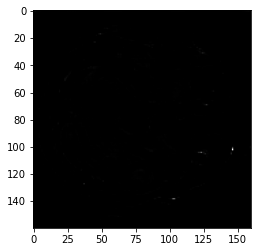

Epoch [   57/  100] | Batch [  700] | Loss: 0.2490 | Duration from start 2454.7663 


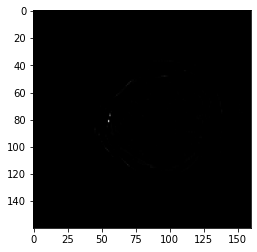

Epoch [   57/  100] | Batch [  800] | Loss: 0.2351 | Duration from start 2804.6361 


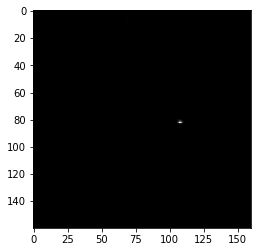

Epoch [   57/  100] | Batch [  900] | Loss: 0.2440 | Duration from start 3154.4165 


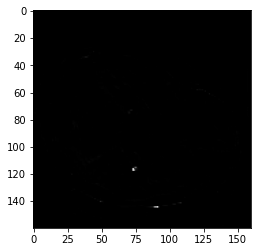

 57%|█████▋    | 57/100 [52:56:49<39:55:58, 3343.21s/it]

END OF EPOCH: 57 	Validation Loss per image: 0.295246
Epoch [   58/  100] | Batch [  100] | Loss: 0.3243 | Duration from start 355.8904 


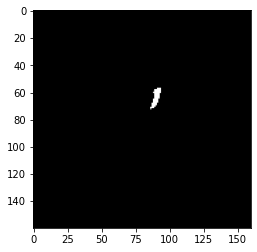

Epoch [   58/  100] | Batch [  200] | Loss: 0.2323 | Duration from start 705.7407 


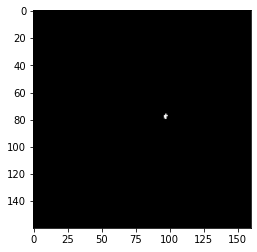

Epoch [   58/  100] | Batch [  300] | Loss: 0.2217 | Duration from start 1055.5133 


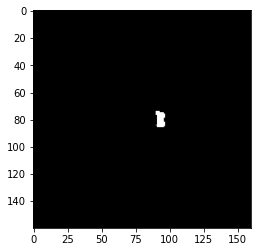

Epoch [   58/  100] | Batch [  400] | Loss: 0.2156 | Duration from start 1405.3253 


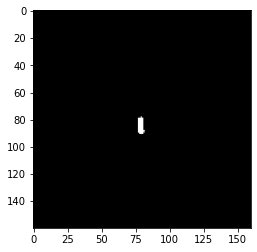

Epoch [   58/  100] | Batch [  500] | Loss: 0.2263 | Duration from start 1755.1870 


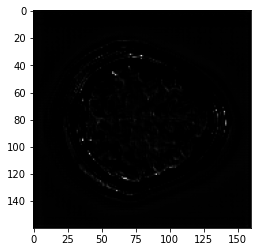

Epoch [   58/  100] | Batch [  600] | Loss: 0.2274 | Duration from start 2105.0353 


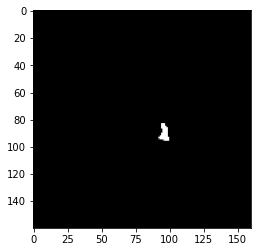

Epoch [   58/  100] | Batch [  700] | Loss: 0.2421 | Duration from start 2454.8402 


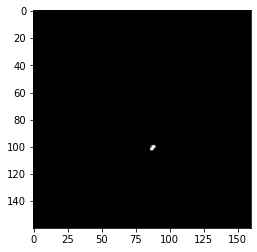

Epoch [   58/  100] | Batch [  800] | Loss: 0.2448 | Duration from start 2804.6098 


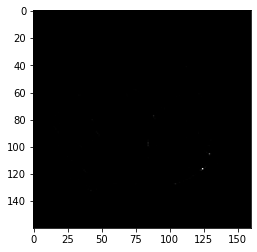

Epoch [   58/  100] | Batch [  900] | Loss: 0.2336 | Duration from start 3154.4837 


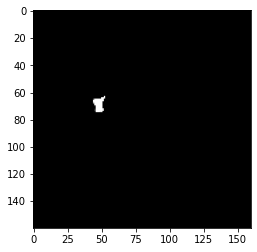

 58%|█████▊    | 58/100 [53:52:33<39:00:26, 3343.49s/it]

END OF EPOCH: 58 	Validation Loss per image: 0.301501
Epoch [   59/  100] | Batch [  100] | Loss: 0.3185 | Duration from start 355.4257 


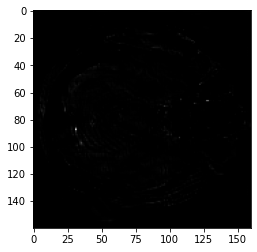

Epoch [   59/  100] | Batch [  200] | Loss: 0.2212 | Duration from start 705.1554 


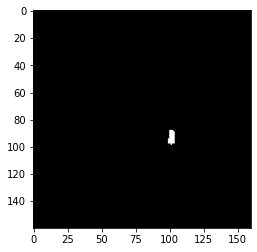

Epoch [   59/  100] | Batch [  300] | Loss: 0.2271 | Duration from start 1054.9737 


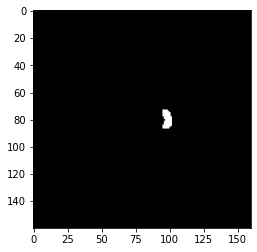

Epoch [   59/  100] | Batch [  400] | Loss: 0.2514 | Duration from start 1404.7960 


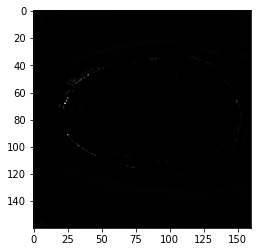

Epoch [   59/  100] | Batch [  500] | Loss: 0.2300 | Duration from start 1754.5236 


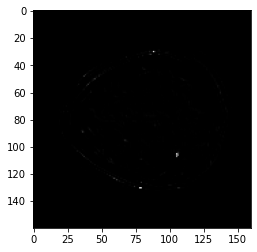

Epoch [   59/  100] | Batch [  600] | Loss: 0.2227 | Duration from start 2104.3388 


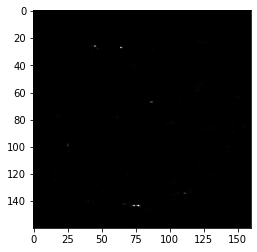

Epoch [   59/  100] | Batch [  700] | Loss: 0.2543 | Duration from start 2454.0984 


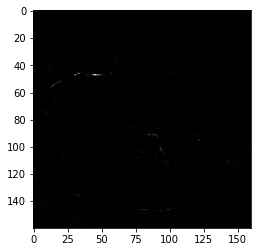

Epoch [   59/  100] | Batch [  800] | Loss: 0.2264 | Duration from start 2803.8594 


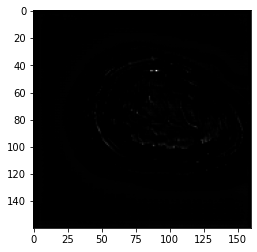

Epoch [   59/  100] | Batch [  900] | Loss: 0.2179 | Duration from start 3153.6365 


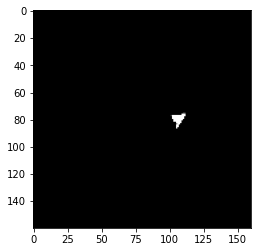

 59%|█████▉    | 59/100 [54:48:17<38:04:47, 3343.59s/it]

END OF EPOCH: 59 	Validation Loss per image: 0.300672
Epoch [   60/  100] | Batch [  100] | Loss: 0.3129 | Duration from start 355.5456 


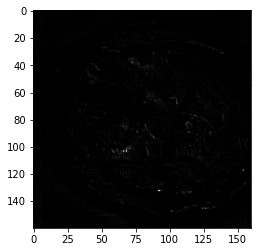

Epoch [   60/  100] | Batch [  200] | Loss: 0.2251 | Duration from start 705.2923 


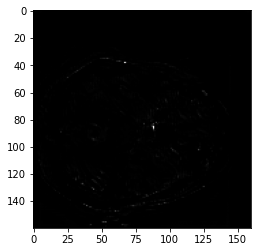

Epoch [   60/  100] | Batch [  300] | Loss: 0.2486 | Duration from start 1055.0499 


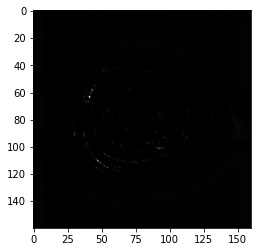

Epoch [   60/  100] | Batch [  400] | Loss: 0.2338 | Duration from start 1404.8652 


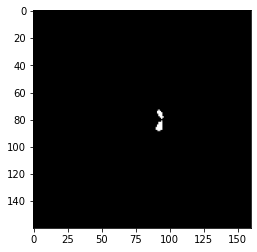

Epoch [   60/  100] | Batch [  500] | Loss: 0.2408 | Duration from start 1754.6054 


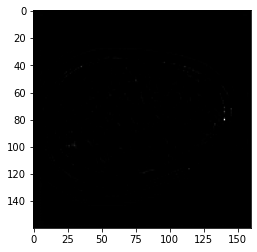

Epoch [   60/  100] | Batch [  600] | Loss: 0.2317 | Duration from start 2104.3998 


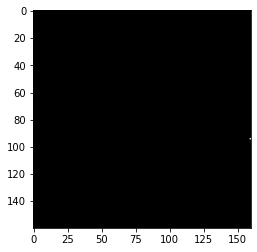

Epoch [   60/  100] | Batch [  700] | Loss: 0.2428 | Duration from start 2454.1829 


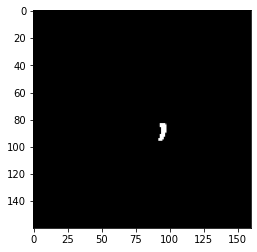

Epoch [   60/  100] | Batch [  800] | Loss: 0.2375 | Duration from start 2804.0752 


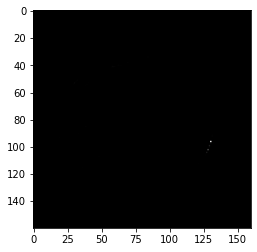

Epoch [   60/  100] | Batch [  900] | Loss: 0.2241 | Duration from start 3153.9090 


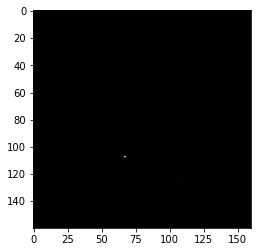

 60%|██████    | 60/100 [55:43:59<37:08:41, 3343.03s/it]

END OF EPOCH: 60 	Validation Loss per image: 0.366126
Epoch [   61/  100] | Batch [  100] | Loss: 0.2921 | Duration from start 357.7622 


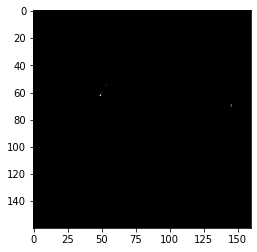

Epoch [   61/  100] | Batch [  200] | Loss: 0.2305 | Duration from start 707.6070 


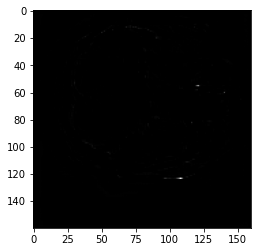

Epoch [   61/  100] | Batch [  300] | Loss: 0.2366 | Duration from start 1057.4307 


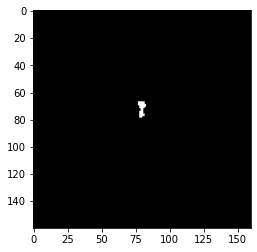

Epoch [   61/  100] | Batch [  400] | Loss: 0.2414 | Duration from start 1407.2241 


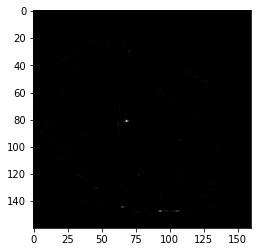

Epoch [   61/  100] | Batch [  500] | Loss: 0.2406 | Duration from start 1756.9263 


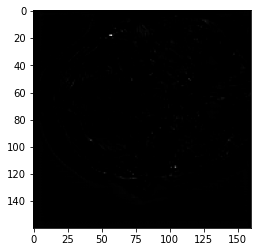

Epoch [   61/  100] | Batch [  600] | Loss: 0.2377 | Duration from start 2106.6428 


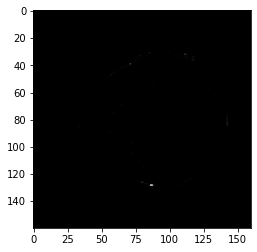

Epoch [   61/  100] | Batch [  700] | Loss: 0.2394 | Duration from start 2456.4118 


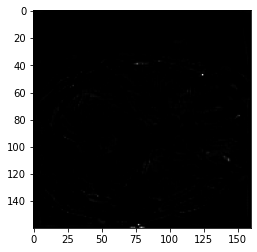

Epoch [   61/  100] | Batch [  800] | Loss: 0.2191 | Duration from start 2806.2739 


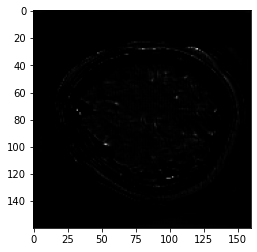

Epoch [   61/  100] | Batch [  900] | Loss: 0.2347 | Duration from start 3156.1409 


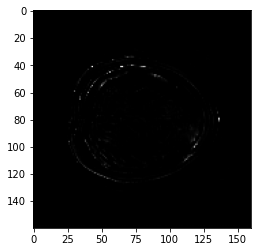

 61%|██████    | 61/100 [56:39:44<36:13:18, 3343.55s/it]

END OF EPOCH: 61 	Validation Loss per image: 0.290705
Epoch [   62/  100] | Batch [  100] | Loss: 0.2975 | Duration from start 355.8806 


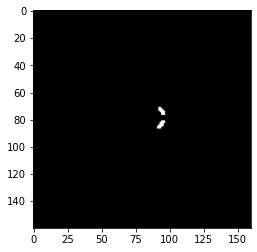

Epoch [   62/  100] | Batch [  200] | Loss: 0.2398 | Duration from start 705.7633 


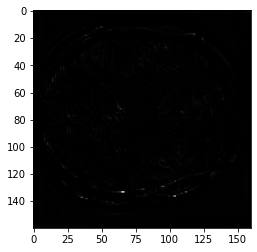

Epoch [   62/  100] | Batch [  300] | Loss: 0.2234 | Duration from start 1055.6253 


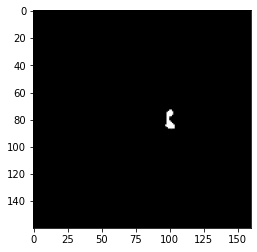

Epoch [   62/  100] | Batch [  400] | Loss: 0.2247 | Duration from start 1405.4258 


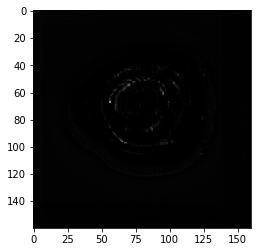

Epoch [   62/  100] | Batch [  500] | Loss: 0.2191 | Duration from start 1755.2278 


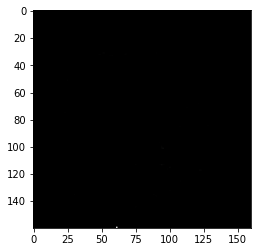

Epoch [   62/  100] | Batch [  600] | Loss: 0.2261 | Duration from start 2105.0117 


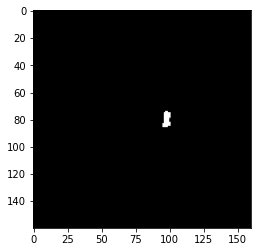

Epoch [   62/  100] | Batch [  700] | Loss: 0.2385 | Duration from start 2454.8556 


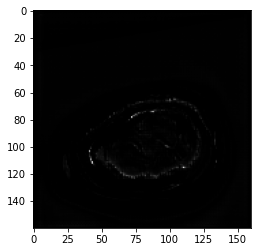

Epoch [   62/  100] | Batch [  800] | Loss: 0.2373 | Duration from start 2804.6464 


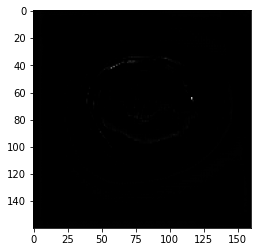

Epoch [   62/  100] | Batch [  900] | Loss: 0.2271 | Duration from start 3154.3889 


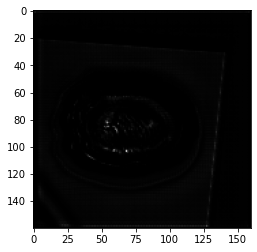

 62%|██████▏   | 62/100 [57:35:28<35:17:41, 3343.72s/it]

END OF EPOCH: 62 	Validation Loss per image: 0.283583
Epoch [   63/  100] | Batch [  100] | Loss: 0.2849 | Duration from start 355.6016 


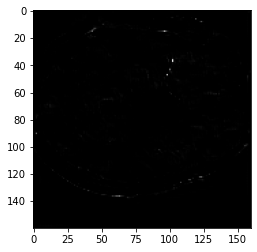

Epoch [   63/  100] | Batch [  200] | Loss: 0.2106 | Duration from start 705.4622 


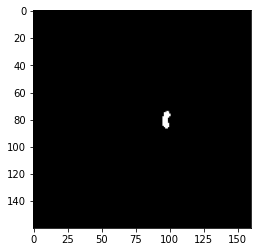

Epoch [   63/  100] | Batch [  300] | Loss: 0.2218 | Duration from start 1055.3250 


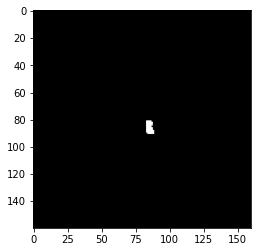

Epoch [   63/  100] | Batch [  400] | Loss: 0.2453 | Duration from start 1405.1100 


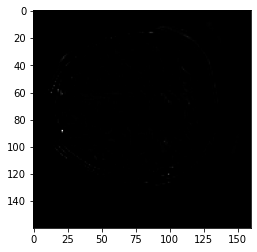

Epoch [   63/  100] | Batch [  500] | Loss: 0.2448 | Duration from start 1754.9044 


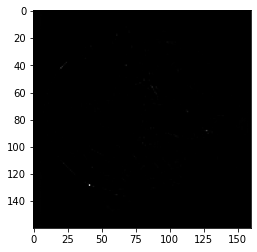

Epoch [   63/  100] | Batch [  600] | Loss: 0.2261 | Duration from start 2104.7452 


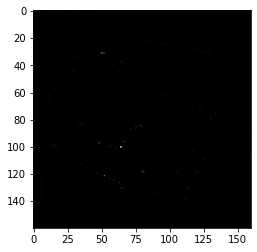

Epoch [   63/  100] | Batch [  700] | Loss: 0.2366 | Duration from start 2454.5268 


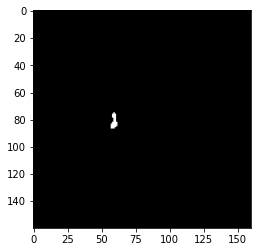

Epoch [   63/  100] | Batch [  800] | Loss: 0.2372 | Duration from start 2804.3290 


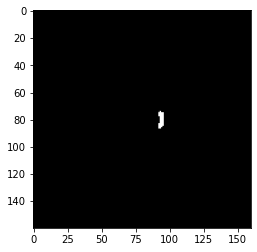

Epoch [   63/  100] | Batch [  900] | Loss: 0.2286 | Duration from start 3154.1483 


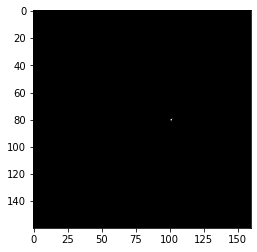

 63%|██████▎   | 63/100 [58:31:10<34:21:43, 3343.33s/it]

END OF EPOCH: 63 	Validation Loss per image: 0.318180
Epoch [   64/  100] | Batch [  100] | Loss: 0.2926 | Duration from start 356.4739 


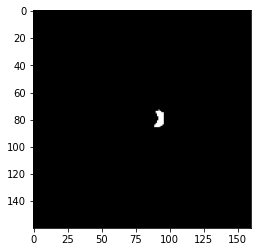

Epoch [   64/  100] | Batch [  200] | Loss: 0.2419 | Duration from start 706.2368 


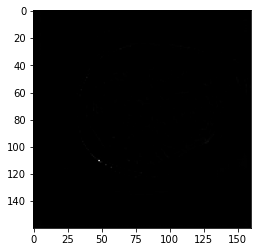

Epoch [   64/  100] | Batch [  300] | Loss: 0.2244 | Duration from start 1056.0941 


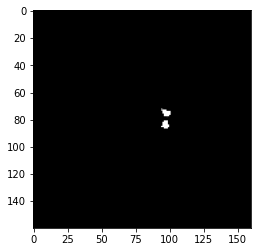

Epoch [   64/  100] | Batch [  400] | Loss: 0.2386 | Duration from start 1406.0040 


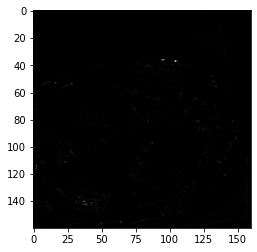

Epoch [   64/  100] | Batch [  500] | Loss: 0.2336 | Duration from start 1755.8826 


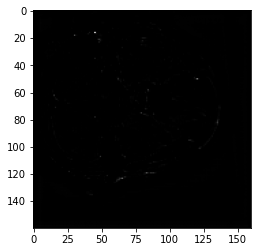

Epoch [   64/  100] | Batch [  600] | Loss: 0.2257 | Duration from start 2105.7052 


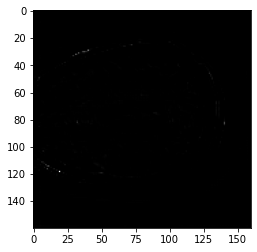

Epoch [   64/  100] | Batch [  700] | Loss: 0.2373 | Duration from start 2455.4770 


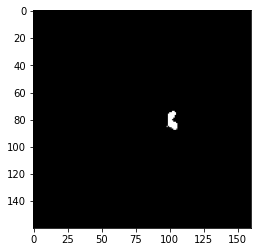

Epoch [   64/  100] | Batch [  800] | Loss: 0.2196 | Duration from start 2805.2622 


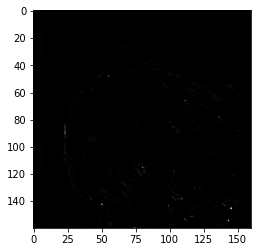

Epoch [   64/  100] | Batch [  900] | Loss: 0.2341 | Duration from start 3155.0845 


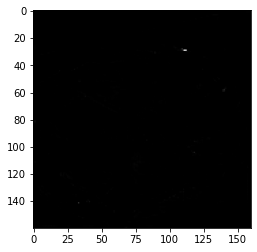

 64%|██████▍   | 64/100 [59:26:55<33:26:10, 3343.63s/it]

END OF EPOCH: 64 	Validation Loss per image: 0.289422
Epoch [   65/  100] | Batch [  100] | Loss: 0.3014 | Duration from start 354.5442 


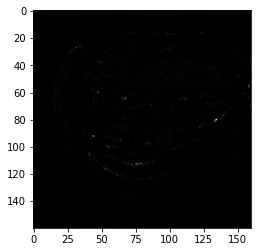

Epoch [   65/  100] | Batch [  200] | Loss: 0.2354 | Duration from start 704.3901 


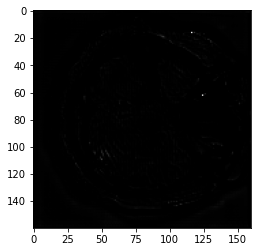

Epoch [   65/  100] | Batch [  300] | Loss: 0.2280 | Duration from start 1054.1672 


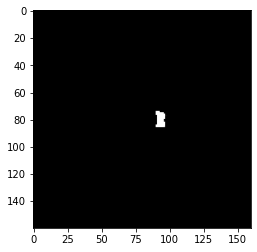

Epoch [   65/  100] | Batch [  400] | Loss: 0.2219 | Duration from start 1403.9564 


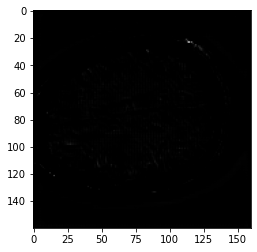

Epoch [   65/  100] | Batch [  500] | Loss: 0.2360 | Duration from start 1753.8349 


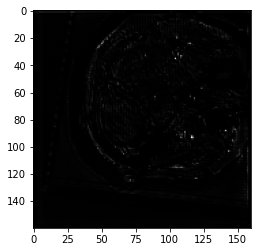

Epoch [   65/  100] | Batch [  600] | Loss: 0.2190 | Duration from start 2103.7099 


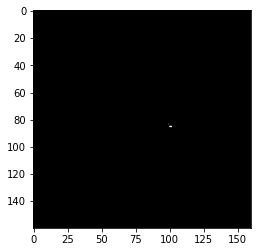

Epoch [   65/  100] | Batch [  700] | Loss: 0.2355 | Duration from start 2453.5499 


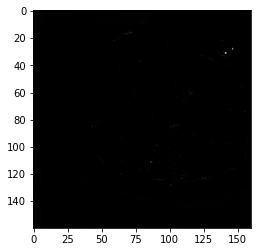

Epoch [   65/  100] | Batch [  800] | Loss: 0.2386 | Duration from start 2803.4659 


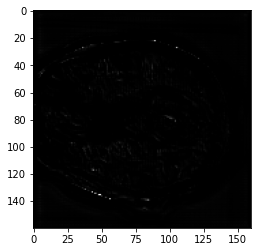

Epoch [   65/  100] | Batch [  900] | Loss: 0.2147 | Duration from start 3153.2031 


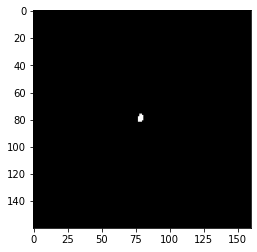

 65%|██████▌   | 65/100 [60:22:37<32:30:14, 3343.27s/it]

END OF EPOCH: 65 	Validation Loss per image: 0.284235
Epoch [   66/  100] | Batch [  100] | Loss: 0.2868 | Duration from start 355.6235 


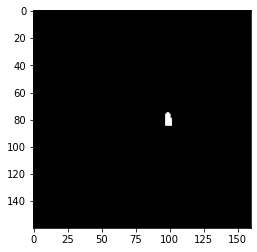

Epoch [   66/  100] | Batch [  200] | Loss: 0.2176 | Duration from start 705.4171 


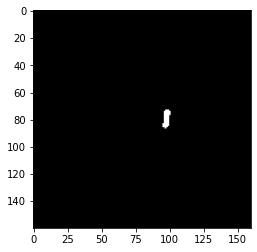

Epoch [   66/  100] | Batch [  300] | Loss: 0.2220 | Duration from start 1055.2510 


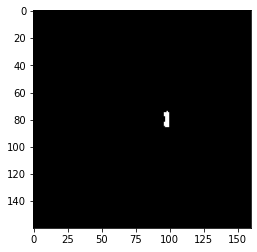

Epoch [   66/  100] | Batch [  400] | Loss: 0.2243 | Duration from start 1405.0666 


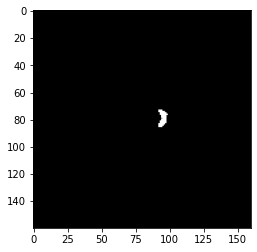

Epoch [   66/  100] | Batch [  500] | Loss: 0.2516 | Duration from start 1754.8887 


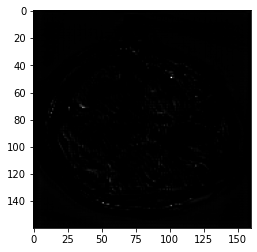

Epoch [   66/  100] | Batch [  600] | Loss: 0.2150 | Duration from start 2104.7448 


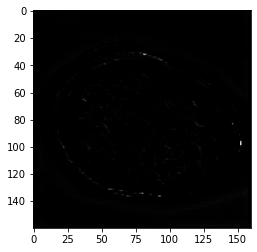

Epoch [   66/  100] | Batch [  700] | Loss: 0.2555 | Duration from start 2454.5153 


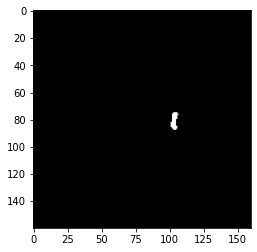

Epoch [   66/  100] | Batch [  800] | Loss: 0.2349 | Duration from start 2804.3276 


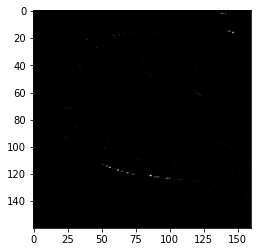

Epoch [   66/  100] | Batch [  900] | Loss: 0.2341 | Duration from start 3154.1690 


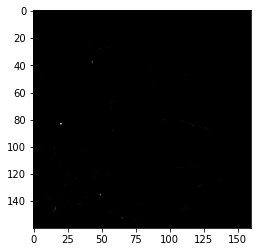

 66%|██████▌   | 66/100 [61:18:19<31:34:19, 3342.93s/it]

END OF EPOCH: 66 	Validation Loss per image: 0.334606
Epoch [   67/  100] | Batch [  100] | Loss: 0.3369 | Duration from start 356.4386 


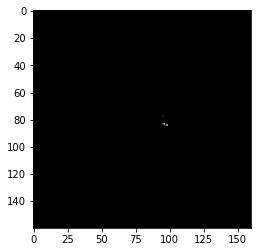

Epoch [   67/  100] | Batch [  200] | Loss: 0.2284 | Duration from start 706.1554 


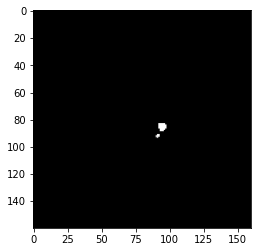

Epoch [   67/  100] | Batch [  300] | Loss: 0.2341 | Duration from start 1055.9121 


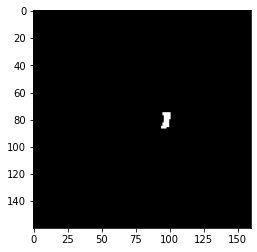

Epoch [   67/  100] | Batch [  400] | Loss: 0.2292 | Duration from start 1405.7434 


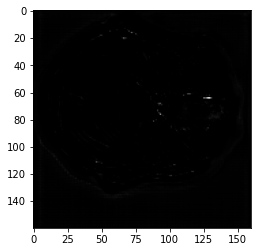

Epoch [   67/  100] | Batch [  500] | Loss: 0.2330 | Duration from start 1755.6176 


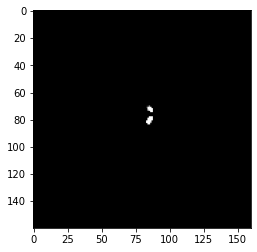

Epoch [   67/  100] | Batch [  600] | Loss: 0.2091 | Duration from start 2105.3392 


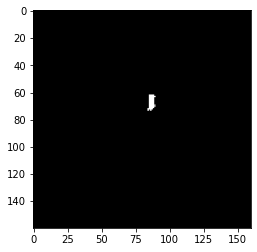

Epoch [   67/  100] | Batch [  700] | Loss: 0.2262 | Duration from start 2455.0898 


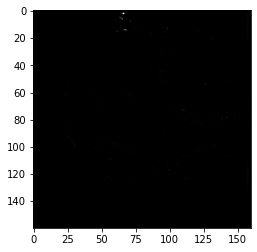

Epoch [   67/  100] | Batch [  800] | Loss: 0.2255 | Duration from start 2804.8441 


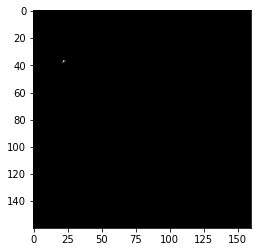

Epoch [   67/  100] | Batch [  900] | Loss: 0.2235 | Duration from start 3154.6751 


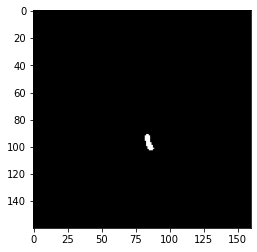

 67%|██████▋   | 67/100 [62:14:04<30:38:55, 3343.49s/it]

END OF EPOCH: 67 	Validation Loss per image: 0.301524
Epoch [   68/  100] | Batch [  100] | Loss: 0.2973 | Duration from start 356.6797 


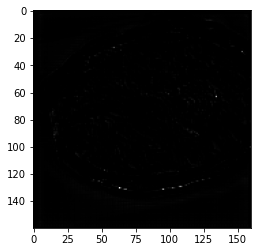

Epoch [   68/  100] | Batch [  200] | Loss: 0.2350 | Duration from start 706.5364 


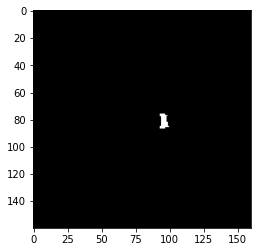

Epoch [   68/  100] | Batch [  300] | Loss: 0.2463 | Duration from start 1056.4305 


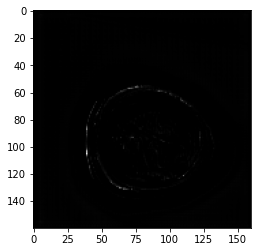

Epoch [   68/  100] | Batch [  400] | Loss: 0.2136 | Duration from start 1406.2621 


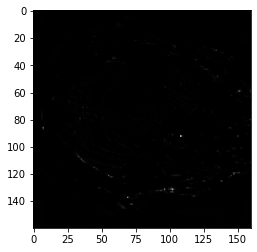

Epoch [   68/  100] | Batch [  500] | Loss: 0.2373 | Duration from start 1756.1006 


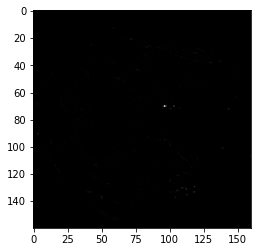

Epoch [   68/  100] | Batch [  600] | Loss: 0.2273 | Duration from start 2105.8930 


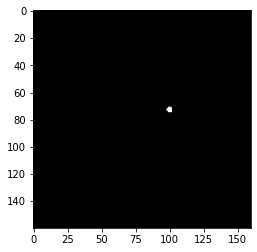

Epoch [   68/  100] | Batch [  700] | Loss: 0.2204 | Duration from start 2455.7482 


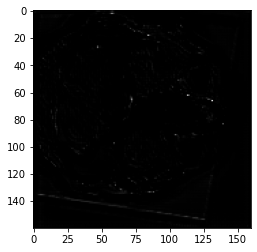

Epoch [   68/  100] | Batch [  800] | Loss: 0.2284 | Duration from start 2805.5888 


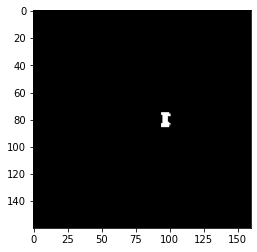

Epoch [   68/  100] | Batch [  900] | Loss: 0.2440 | Duration from start 3155.4378 


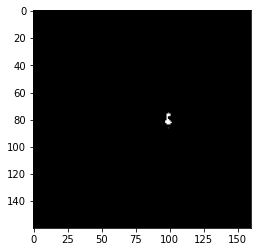

 68%|██████▊   | 68/100 [63:09:48<29:43:19, 3343.72s/it]

END OF EPOCH: 68 	Validation Loss per image: 0.319552
Epoch [   69/  100] | Batch [  100] | Loss: 0.2903 | Duration from start 354.5377 


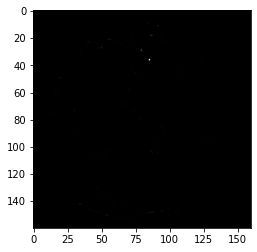

Epoch [   69/  100] | Batch [  200] | Loss: 0.2350 | Duration from start 704.4157 


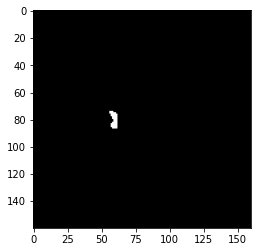

Epoch [   69/  100] | Batch [  300] | Loss: 0.2343 | Duration from start 1054.2934 


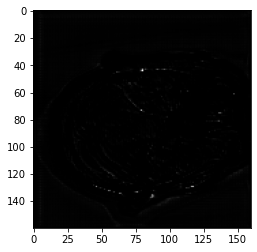

Epoch [   69/  100] | Batch [  400] | Loss: 0.2234 | Duration from start 1404.1842 


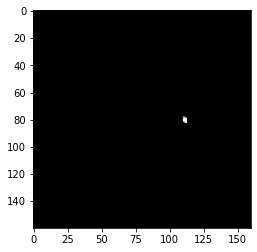

Epoch [   69/  100] | Batch [  500] | Loss: 0.2387 | Duration from start 1754.0493 


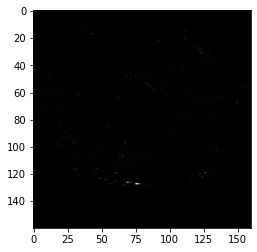

Epoch [   69/  100] | Batch [  600] | Loss: 0.2262 | Duration from start 2103.8991 


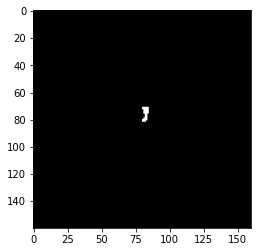

Epoch [   69/  100] | Batch [  700] | Loss: 0.2284 | Duration from start 2453.6598 


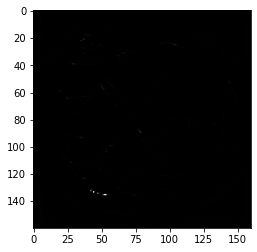

Epoch [   69/  100] | Batch [  800] | Loss: 0.2302 | Duration from start 2803.4313 


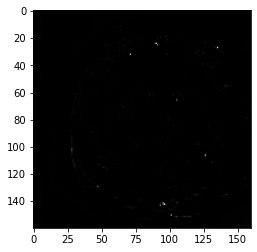

Epoch [   69/  100] | Batch [  900] | Loss: 0.2281 | Duration from start 3153.2744 


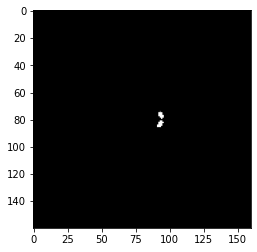

 69%|██████▉   | 69/100 [64:05:31<28:47:22, 3343.30s/it]

END OF EPOCH: 69 	Validation Loss per image: 0.327389
Epoch [   70/  100] | Batch [  100] | Loss: 0.3127 | Duration from start 356.0949 


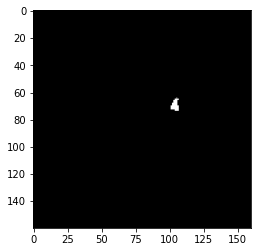

Epoch [   70/  100] | Batch [  200] | Loss: 0.2218 | Duration from start 705.8470 


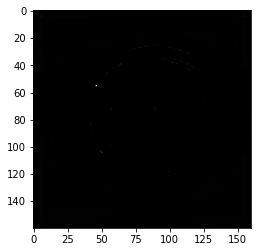

Epoch [   70/  100] | Batch [  300] | Loss: 0.2248 | Duration from start 1055.6352 


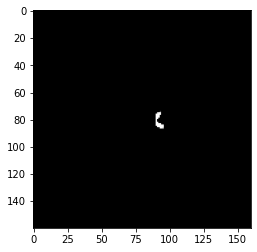

Epoch [   70/  100] | Batch [  400] | Loss: 0.2283 | Duration from start 1405.3977 


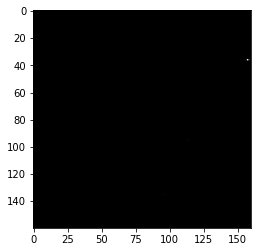

Epoch [   70/  100] | Batch [  500] | Loss: 0.2229 | Duration from start 1755.1536 


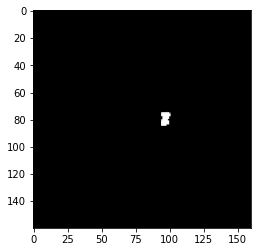

Epoch [   70/  100] | Batch [  600] | Loss: 0.2337 | Duration from start 2104.9514 


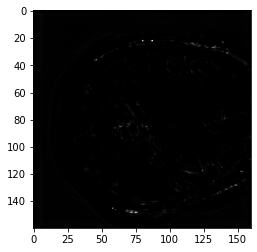

Epoch [   70/  100] | Batch [  700] | Loss: 0.2241 | Duration from start 2454.7253 


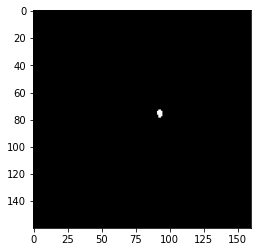

Epoch [   70/  100] | Batch [  800] | Loss: 0.2227 | Duration from start 2804.5694 


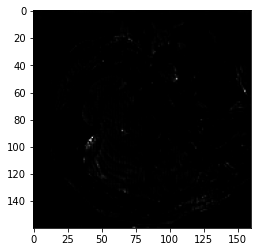

Epoch [   70/  100] | Batch [  900] | Loss: 0.2359 | Duration from start 3154.3450 


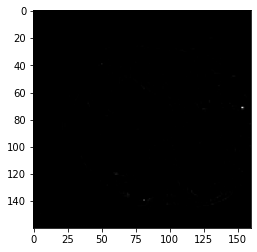

 70%|███████   | 70/100 [65:01:15<27:51:52, 3343.75s/it]

END OF EPOCH: 70 	Validation Loss per image: 0.296715
Epoch [   71/  100] | Batch [  100] | Loss: 0.2971 | Duration from start 354.4631 


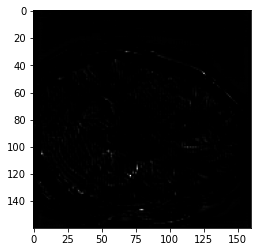

Epoch [   71/  100] | Batch [  200] | Loss: 0.2297 | Duration from start 704.2784 


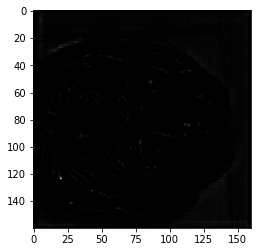

Epoch [   71/  100] | Batch [  300] | Loss: 0.2298 | Duration from start 1054.0168 


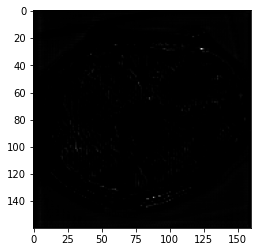

Epoch [   71/  100] | Batch [  400] | Loss: 0.2391 | Duration from start 1403.8352 


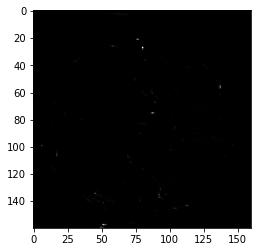

Epoch [   71/  100] | Batch [  500] | Loss: 0.2181 | Duration from start 1753.6418 


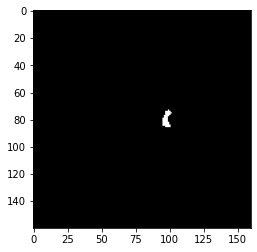

Epoch [   71/  100] | Batch [  600] | Loss: 0.2294 | Duration from start 2103.4598 


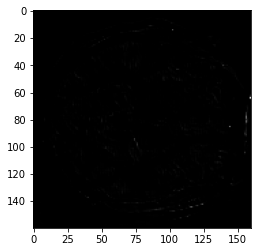

Epoch [   71/  100] | Batch [  700] | Loss: 0.2190 | Duration from start 2453.3065 


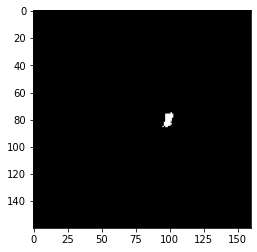

Epoch [   71/  100] | Batch [  800] | Loss: 0.2218 | Duration from start 2803.0405 


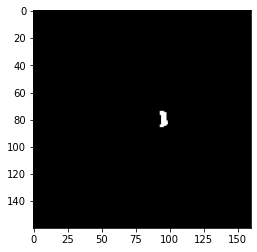

Epoch [   71/  100] | Batch [  900] | Loss: 0.2355 | Duration from start 3152.7860 


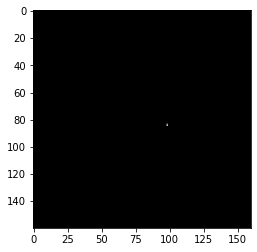

 71%|███████   | 71/100 [65:56:56<26:55:40, 3342.77s/it]

END OF EPOCH: 71 	Validation Loss per image: 0.299574
Epoch [   72/  100] | Batch [  100] | Loss: 0.3043 | Duration from start 355.9493 


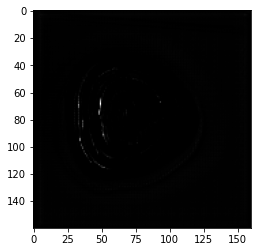

Epoch [   72/  100] | Batch [  200] | Loss: 0.2379 | Duration from start 705.7541 


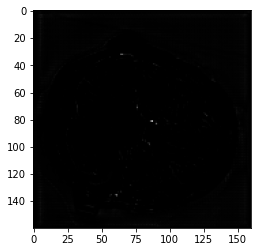

Epoch [   72/  100] | Batch [  300] | Loss: 0.2225 | Duration from start 1055.5081 


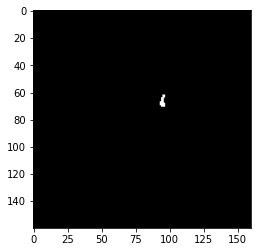

Epoch [   72/  100] | Batch [  400] | Loss: 0.2327 | Duration from start 1405.2871 


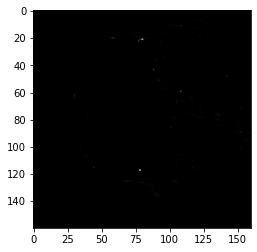

Epoch [   72/  100] | Batch [  500] | Loss: 0.2221 | Duration from start 1755.0788 


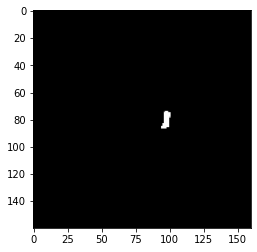

Epoch [   72/  100] | Batch [  600] | Loss: 0.2327 | Duration from start 2104.9396 


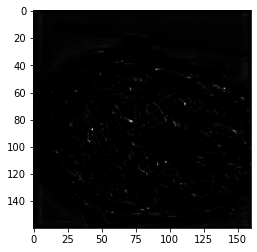

Epoch [   72/  100] | Batch [  700] | Loss: 0.2328 | Duration from start 2454.8344 


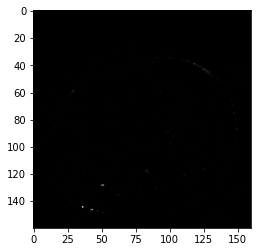

Epoch [   72/  100] | Batch [  800] | Loss: 0.2391 | Duration from start 2804.6759 


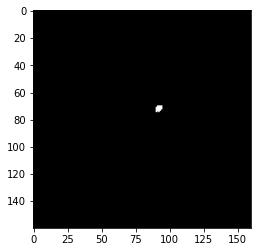

Epoch [   72/  100] | Batch [  900] | Loss: 0.2189 | Duration from start 3154.5018 


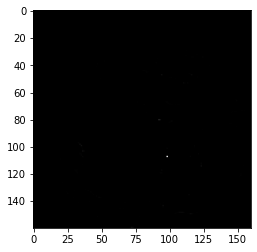

 72%|███████▏  | 72/100 [66:52:39<26:00:04, 3343.01s/it]

END OF EPOCH: 72 	Validation Loss per image: 0.326466
Epoch [   73/  100] | Batch [  100] | Loss: 0.3051 | Duration from start 354.5390 


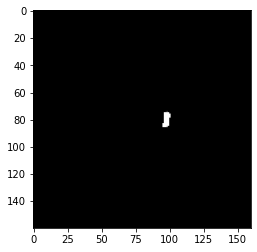

Epoch [   73/  100] | Batch [  200] | Loss: 0.2145 | Duration from start 704.3528 


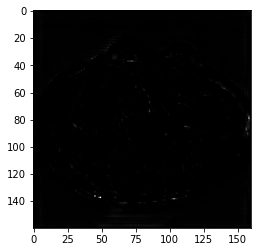

Epoch [   73/  100] | Batch [  300] | Loss: 0.2340 | Duration from start 1054.2090 


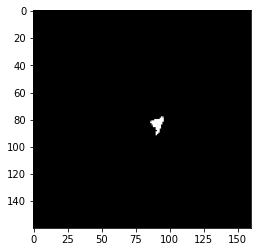

Epoch [   73/  100] | Batch [  400] | Loss: 0.2393 | Duration from start 1404.0387 


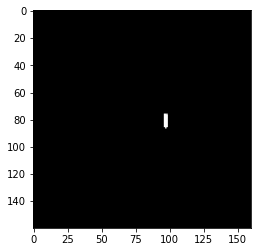

Epoch [   73/  100] | Batch [  500] | Loss: 0.2214 | Duration from start 1753.7763 


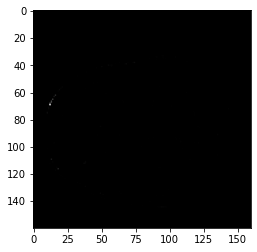

Epoch [   73/  100] | Batch [  600] | Loss: 0.2362 | Duration from start 2103.5436 


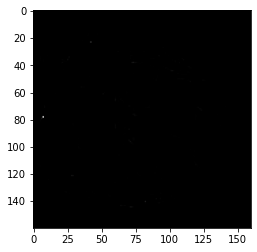

Epoch [   73/  100] | Batch [  700] | Loss: 0.2211 | Duration from start 2453.3645 


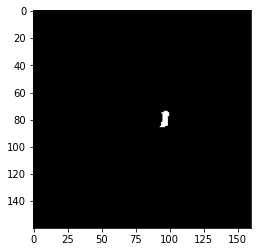

Epoch [   73/  100] | Batch [  800] | Loss: 0.2411 | Duration from start 2803.1670 


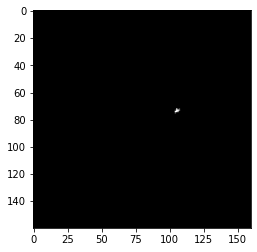

Epoch [   73/  100] | Batch [  900] | Loss: 0.2199 | Duration from start 3153.0080 


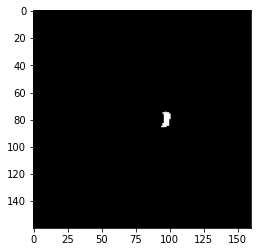

 73%|███████▎  | 73/100 [67:48:22<25:04:16, 3342.82s/it]

END OF EPOCH: 73 	Validation Loss per image: 0.300904
Epoch [   74/  100] | Batch [  100] | Loss: 0.3006 | Duration from start 354.4746 


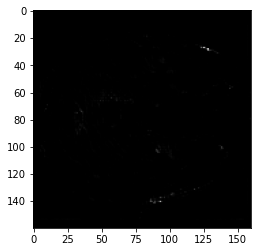

Epoch [   74/  100] | Batch [  200] | Loss: 0.2286 | Duration from start 704.3126 


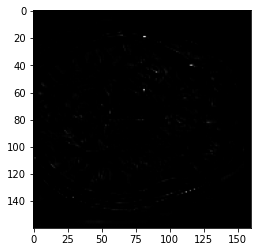

Epoch [   74/  100] | Batch [  300] | Loss: 0.2287 | Duration from start 1054.1352 


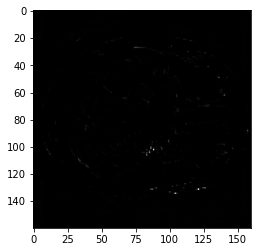

Epoch [   74/  100] | Batch [  400] | Loss: 0.2282 | Duration from start 1403.9783 


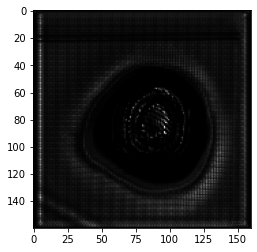

Epoch [   74/  100] | Batch [  500] | Loss: 0.2288 | Duration from start 1753.7377 


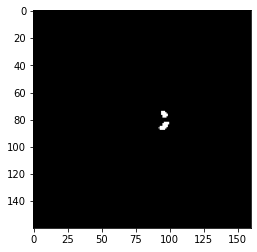

Epoch [   74/  100] | Batch [  600] | Loss: 0.2201 | Duration from start 2103.5263 


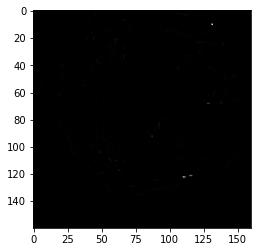

Epoch [   74/  100] | Batch [  700] | Loss: 0.2398 | Duration from start 2453.3606 


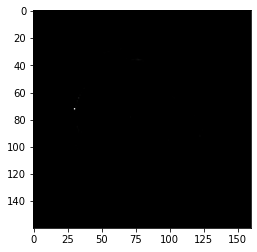

Epoch [   74/  100] | Batch [  800] | Loss: 0.2310 | Duration from start 2803.1502 


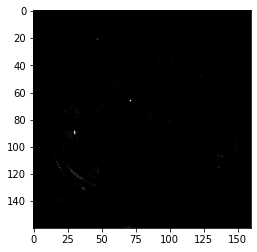

Epoch [   74/  100] | Batch [  900] | Loss: 0.2188 | Duration from start 3152.9197 


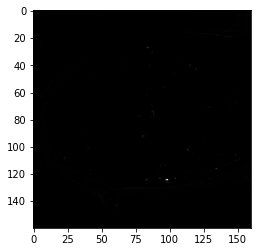

 74%|███████▍  | 74/100 [68:44:04<24:08:31, 3342.73s/it]

END OF EPOCH: 74 	Validation Loss per image: 0.301284
Epoch [   75/  100] | Batch [  100] | Loss: 0.2998 | Duration from start 355.7460 


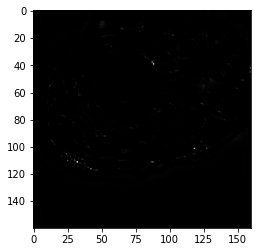

Epoch [   75/  100] | Batch [  200] | Loss: 0.2279 | Duration from start 705.5046 


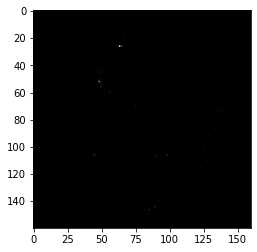

Epoch [   75/  100] | Batch [  300] | Loss: 0.2252 | Duration from start 1055.2617 


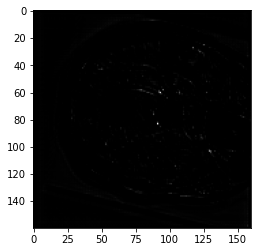

Epoch [   75/  100] | Batch [  400] | Loss: 0.2315 | Duration from start 1405.1323 


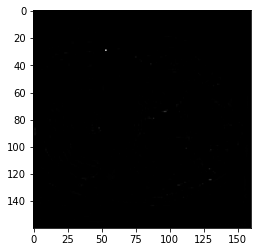

Epoch [   75/  100] | Batch [  500] | Loss: 0.2274 | Duration from start 1754.9475 


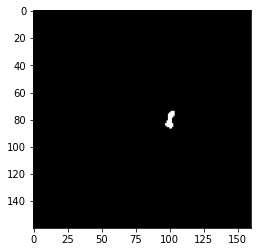

Epoch [   75/  100] | Batch [  600] | Loss: 0.2462 | Duration from start 2104.7432 


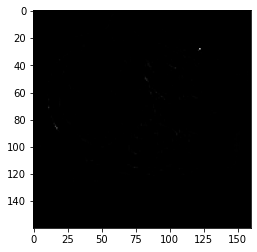

Epoch [   75/  100] | Batch [  700] | Loss: 0.2540 | Duration from start 2454.4922 


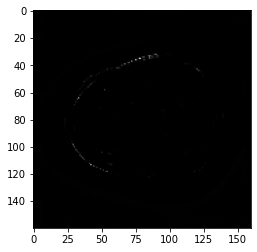

Epoch [   75/  100] | Batch [  800] | Loss: 0.2212 | Duration from start 2804.2006 


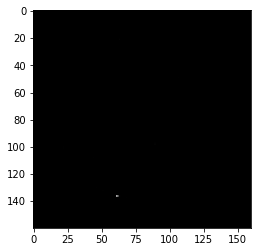

Epoch [   75/  100] | Batch [  900] | Loss: 0.2077 | Duration from start 3153.8900 


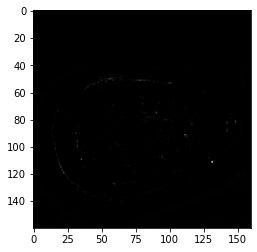

 75%|███████▌  | 75/100 [69:39:48<23:12:52, 3342.92s/it]

END OF EPOCH: 75 	Validation Loss per image: 0.321544
Epoch [   76/  100] | Batch [  100] | Loss: 0.2936 | Duration from start 356.1081 


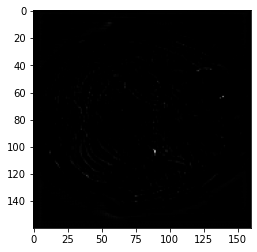

Epoch [   76/  100] | Batch [  200] | Loss: 0.2333 | Duration from start 705.9221 


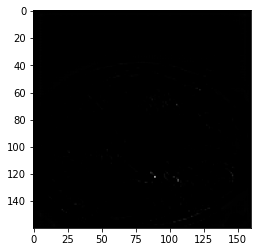

Epoch [   76/  100] | Batch [  300] | Loss: 0.2159 | Duration from start 1055.6720 


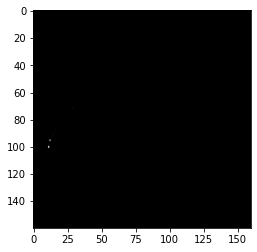

Epoch [   76/  100] | Batch [  400] | Loss: 0.2344 | Duration from start 1405.4718 


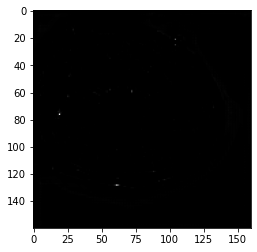

Epoch [   76/  100] | Batch [  500] | Loss: 0.2320 | Duration from start 1755.2484 


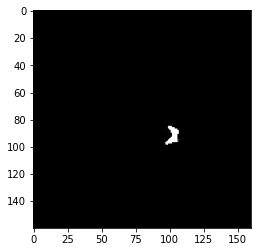

Epoch [   76/  100] | Batch [  600] | Loss: 0.2290 | Duration from start 2105.0726 


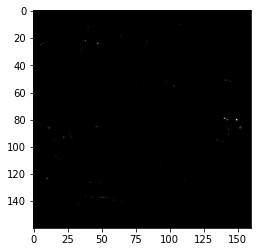

Epoch [   76/  100] | Batch [  700] | Loss: 0.2132 | Duration from start 2454.9074 


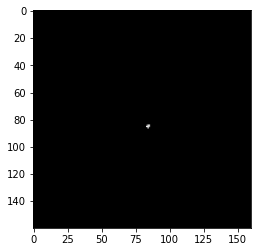

Epoch [   76/  100] | Batch [  800] | Loss: 0.2314 | Duration from start 2804.6467 


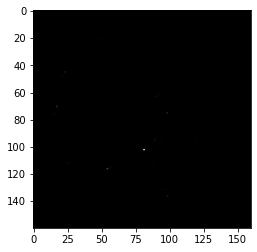

Epoch [   76/  100] | Batch [  900] | Loss: 0.2310 | Duration from start 3154.4626 


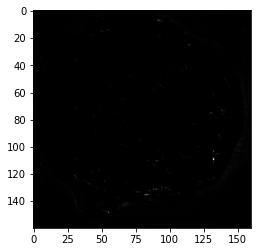

 76%|███████▌  | 76/100 [70:35:31<22:17:10, 3342.93s/it]

END OF EPOCH: 76 	Validation Loss per image: 0.293290
Epoch [   77/  100] | Batch [  100] | Loss: 0.2970 | Duration from start 354.2594 


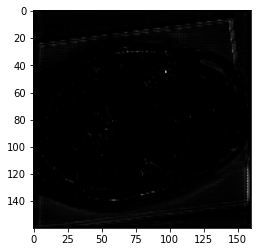

Epoch [   77/  100] | Batch [  200] | Loss: 0.2255 | Duration from start 704.0896 


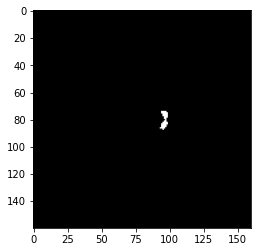

Epoch [   77/  100] | Batch [  300] | Loss: 0.2168 | Duration from start 1053.9780 


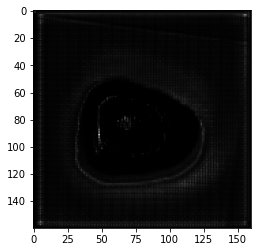

Epoch [   77/  100] | Batch [  400] | Loss: 0.2220 | Duration from start 1403.7388 


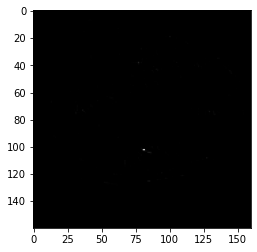

Epoch [   77/  100] | Batch [  500] | Loss: 0.2306 | Duration from start 1753.5060 


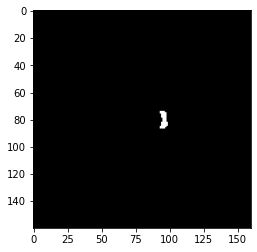

Epoch [   77/  100] | Batch [  600] | Loss: 0.2317 | Duration from start 2103.2126 


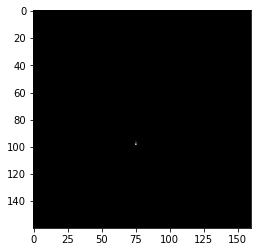

Epoch [   77/  100] | Batch [  700] | Loss: 0.2282 | Duration from start 2453.1361 


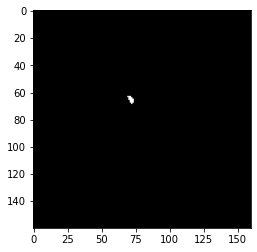

Epoch [   77/  100] | Batch [  800] | Loss: 0.2266 | Duration from start 2802.8905 


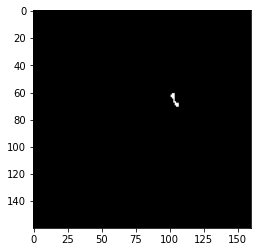

Epoch [   77/  100] | Batch [  900] | Loss: 0.2186 | Duration from start 3152.7021 


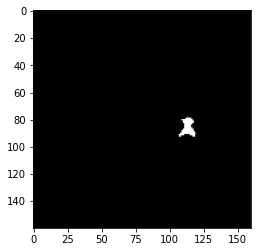

 77%|███████▋  | 77/100 [71:31:12<21:21:15, 3342.43s/it]

END OF EPOCH: 77 	Validation Loss per image: 0.300700
Epoch [   78/  100] | Batch [  100] | Loss: 0.2879 | Duration from start 357.7148 


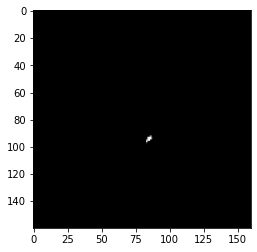

Epoch [   78/  100] | Batch [  200] | Loss: 0.2392 | Duration from start 707.4857 


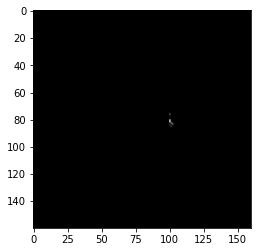

Epoch [   78/  100] | Batch [  300] | Loss: 0.2369 | Duration from start 1057.2633 


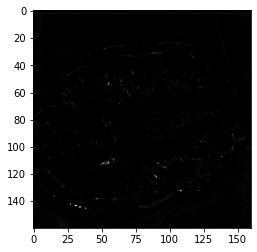

Epoch [   78/  100] | Batch [  400] | Loss: 0.2290 | Duration from start 1407.0818 


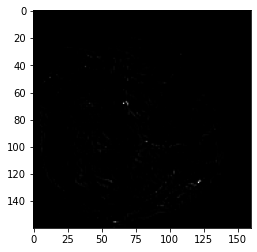

Epoch [   78/  100] | Batch [  500] | Loss: 0.2364 | Duration from start 1756.8787 


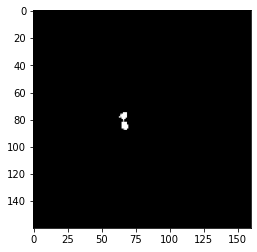

Epoch [   78/  100] | Batch [  600] | Loss: 0.2179 | Duration from start 2106.5879 


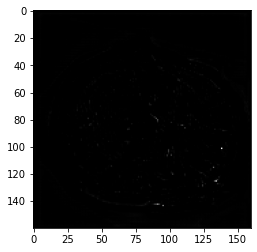

Epoch [   78/  100] | Batch [  700] | Loss: 0.2248 | Duration from start 2456.3167 


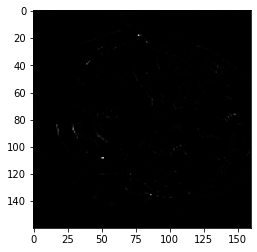

Epoch [   78/  100] | Batch [  800] | Loss: 0.2262 | Duration from start 2806.0621 


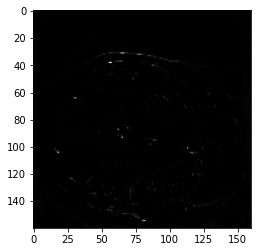

Epoch [   78/  100] | Batch [  900] | Loss: 0.2426 | Duration from start 3155.8893 


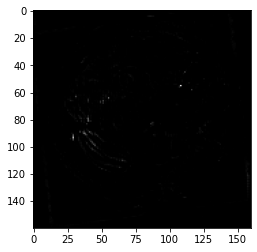

 78%|███████▊  | 78/100 [72:26:57<20:25:52, 3343.31s/it]

END OF EPOCH: 78 	Validation Loss per image: 0.317567
Epoch [   79/  100] | Batch [  100] | Loss: 0.2853 | Duration from start 354.9057 


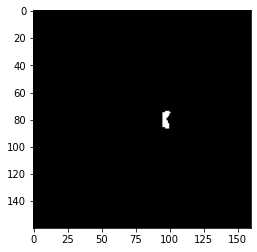

Epoch [   79/  100] | Batch [  200] | Loss: 0.2254 | Duration from start 704.6247 


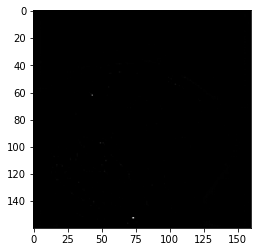

Epoch [   79/  100] | Batch [  300] | Loss: 0.2332 | Duration from start 1054.4262 


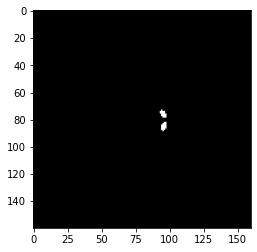

Epoch [   79/  100] | Batch [  400] | Loss: 0.2220 | Duration from start 1404.2866 


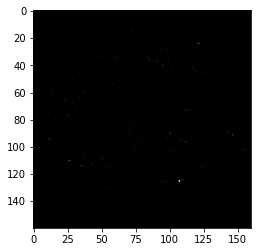

Epoch [   79/  100] | Batch [  500] | Loss: 0.2148 | Duration from start 1753.9908 


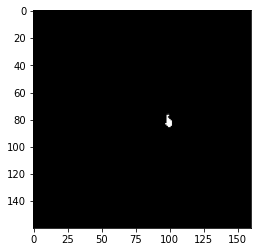

Epoch [   79/  100] | Batch [  600] | Loss: 0.2247 | Duration from start 2103.7931 


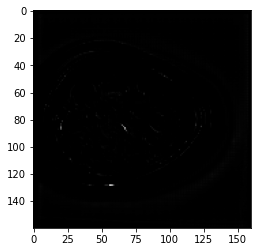

Epoch [   79/  100] | Batch [  700] | Loss: 0.2197 | Duration from start 2453.5419 


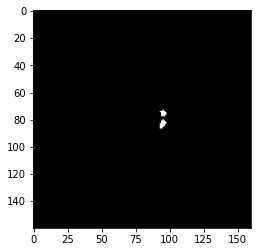

Epoch [   79/  100] | Batch [  800] | Loss: 0.2508 | Duration from start 2803.2675 


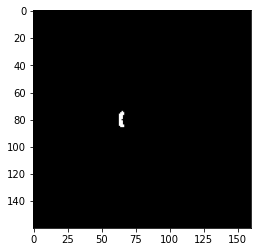

Epoch [   79/  100] | Batch [  900] | Loss: 0.2334 | Duration from start 3153.0318 


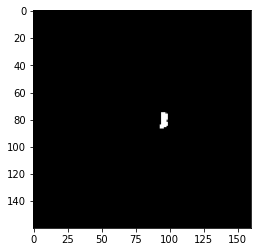

 79%|███████▉  | 79/100 [73:22:39<19:30:00, 3342.89s/it]

END OF EPOCH: 79 	Validation Loss per image: 0.315863
Epoch [   80/  100] | Batch [  100] | Loss: 0.2954 | Duration from start 355.8511 


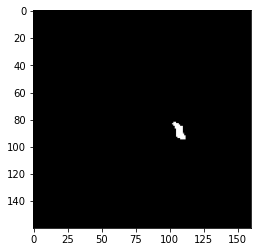

Epoch [   80/  100] | Batch [  200] | Loss: 0.2264 | Duration from start 705.6757 


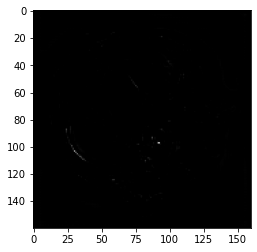

Epoch [   80/  100] | Batch [  300] | Loss: 0.2359 | Duration from start 1055.4355 


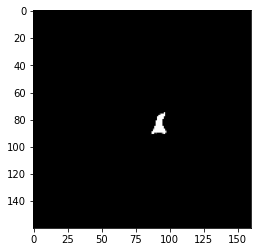

Epoch [   80/  100] | Batch [  400] | Loss: 0.2227 | Duration from start 1405.2365 


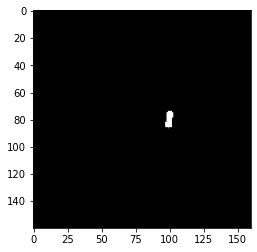

Epoch [   80/  100] | Batch [  500] | Loss: 0.2241 | Duration from start 1755.0467 


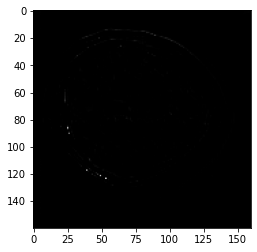

Epoch [   80/  100] | Batch [  600] | Loss: 0.2170 | Duration from start 2104.7914 


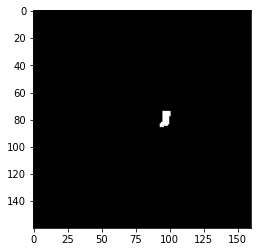

Epoch [   80/  100] | Batch [  700] | Loss: 0.2335 | Duration from start 2454.4993 


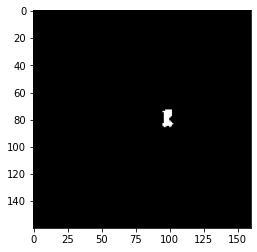

Epoch [   80/  100] | Batch [  800] | Loss: 0.2223 | Duration from start 2804.2744 


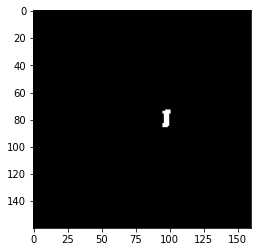

Epoch [   80/  100] | Batch [  900] | Loss: 0.2349 | Duration from start 3154.0609 


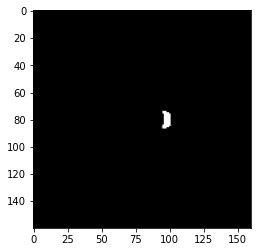

 80%|████████  | 80/100 [74:18:21<18:34:09, 3342.49s/it]

END OF EPOCH: 80 	Validation Loss per image: 0.277455
Epoch [   81/  100] | Batch [  100] | Loss: 0.2932 | Duration from start 356.5640 


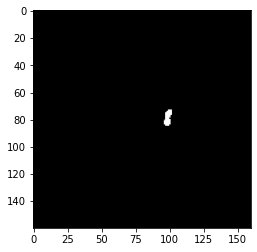

Epoch [   81/  100] | Batch [  200] | Loss: 0.2352 | Duration from start 706.3571 


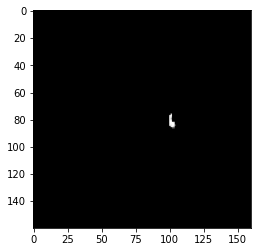

Epoch [   81/  100] | Batch [  300] | Loss: 0.2293 | Duration from start 1056.1177 


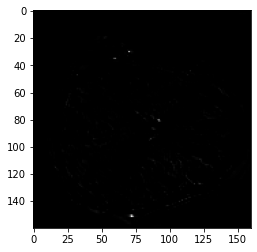

Epoch [   81/  100] | Batch [  400] | Loss: 0.2181 | Duration from start 1405.9154 


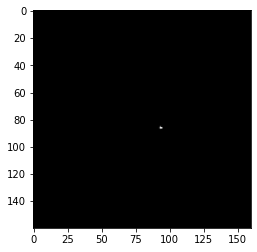

Epoch [   81/  100] | Batch [  500] | Loss: 0.2358 | Duration from start 1755.6635 


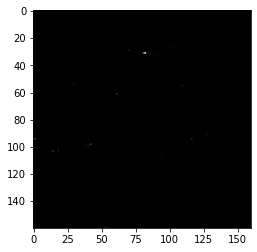

Epoch [   81/  100] | Batch [  600] | Loss: 0.2430 | Duration from start 2105.3999 


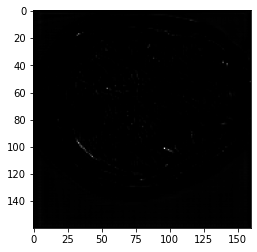

Epoch [   81/  100] | Batch [  700] | Loss: 0.2190 | Duration from start 2455.1985 


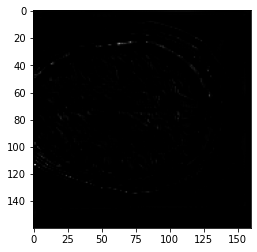

Epoch [   81/  100] | Batch [  800] | Loss: 0.2164 | Duration from start 2804.9471 


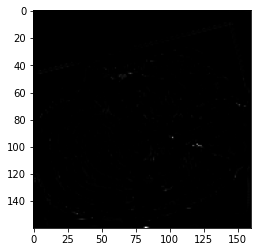

Epoch [   81/  100] | Batch [  900] | Loss: 0.2138 | Duration from start 3154.7006 


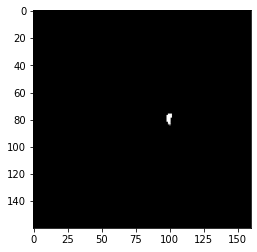

 81%|████████  | 81/100 [75:14:05<17:38:36, 3342.96s/it]

END OF EPOCH: 81 	Validation Loss per image: 0.314882
Epoch [   82/  100] | Batch [  100] | Loss: 0.2785 | Duration from start 356.1308 


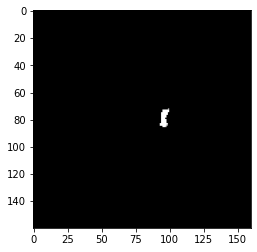

Epoch [   82/  100] | Batch [  200] | Loss: 0.2388 | Duration from start 705.9203 


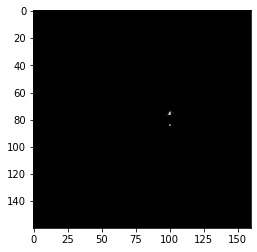

Epoch [   82/  100] | Batch [  300] | Loss: 0.2269 | Duration from start 1055.7205 


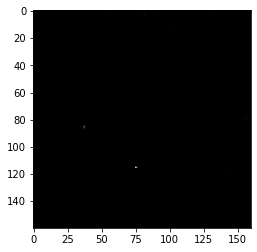

Epoch [   82/  100] | Batch [  400] | Loss: 0.2409 | Duration from start 1405.5325 


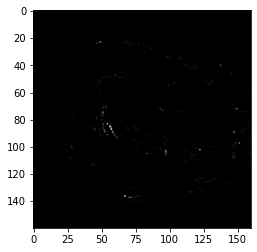

Epoch [   82/  100] | Batch [  500] | Loss: 0.2192 | Duration from start 1755.2848 


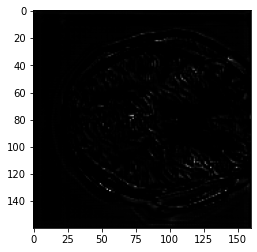

Epoch [   82/  100] | Batch [  600] | Loss: 0.2218 | Duration from start 2105.1304 


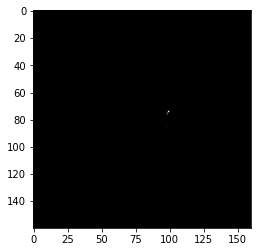

Epoch [   82/  100] | Batch [  700] | Loss: 0.2152 | Duration from start 2455.0804 


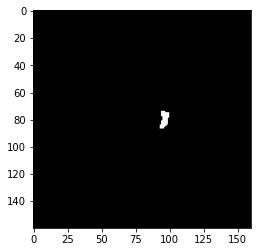

Epoch [   82/  100] | Batch [  800] | Loss: 0.2232 | Duration from start 2804.8979 


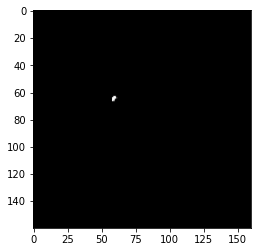

Epoch [   82/  100] | Batch [  900] | Loss: 0.2284 | Duration from start 3154.7164 


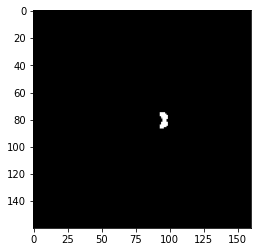

 82%|████████▏ | 82/100 [76:09:50<16:43:04, 3343.59s/it]

END OF EPOCH: 82 	Validation Loss per image: 0.328957
Epoch [   83/  100] | Batch [  100] | Loss: 0.2789 | Duration from start 356.1829 


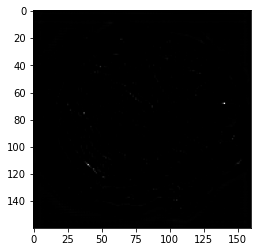

Epoch [   83/  100] | Batch [  200] | Loss: 0.2234 | Duration from start 706.0704 


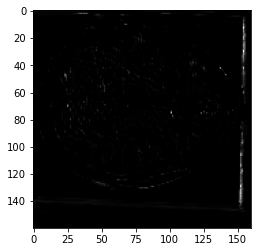

Epoch [   83/  100] | Batch [  300] | Loss: 0.2257 | Duration from start 1055.8156 


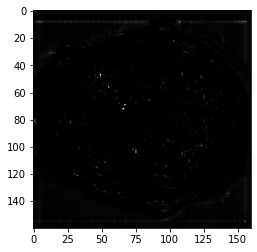

Epoch [   83/  100] | Batch [  400] | Loss: 0.2251 | Duration from start 1405.5992 


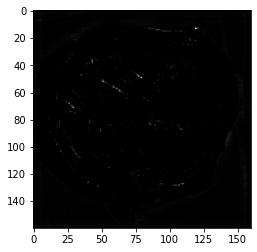

Epoch [   83/  100] | Batch [  500] | Loss: 0.2105 | Duration from start 1755.3658 


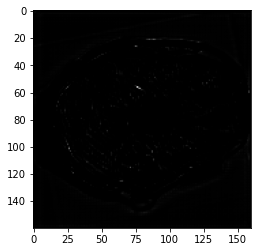

Epoch [   83/  100] | Batch [  600] | Loss: 0.2369 | Duration from start 2105.0787 


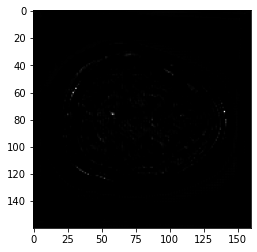

Epoch [   83/  100] | Batch [  700] | Loss: 0.2261 | Duration from start 2454.8884 


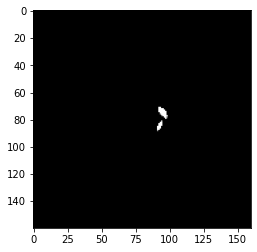

Epoch [   83/  100] | Batch [  800] | Loss: 0.2293 | Duration from start 2804.6931 


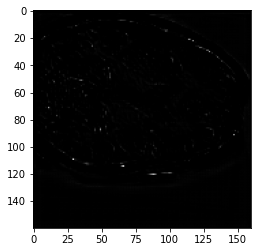

Epoch [   83/  100] | Batch [  900] | Loss: 0.2262 | Duration from start 3154.4921 


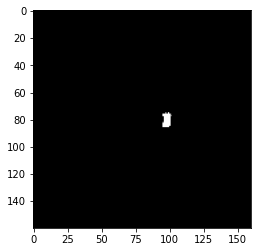

 83%|████████▎ | 83/100 [77:05:33<15:47:17, 3343.39s/it]

END OF EPOCH: 83 	Validation Loss per image: 0.323371
Epoch [   84/  100] | Batch [  100] | Loss: 0.3049 | Duration from start 356.0644 


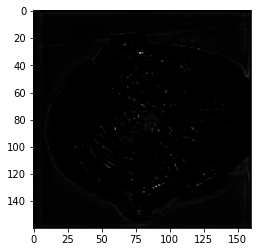

Epoch [   84/  100] | Batch [  200] | Loss: 0.2272 | Duration from start 705.8931 


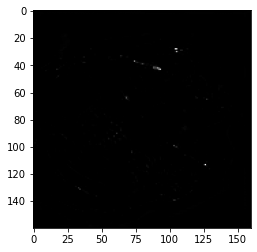

Epoch [   84/  100] | Batch [  300] | Loss: 0.2346 | Duration from start 1055.7243 


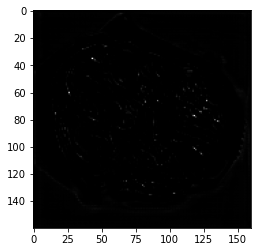

Epoch [   84/  100] | Batch [  400] | Loss: 0.2352 | Duration from start 1405.5653 


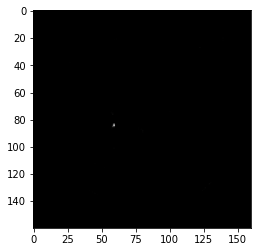

Epoch [   84/  100] | Batch [  500] | Loss: 0.2353 | Duration from start 1755.4070 


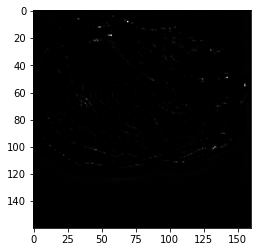

Epoch [   84/  100] | Batch [  600] | Loss: 0.2183 | Duration from start 2105.2172 


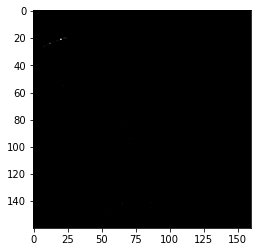

Epoch [   84/  100] | Batch [  700] | Loss: 0.2167 | Duration from start 2455.0422 


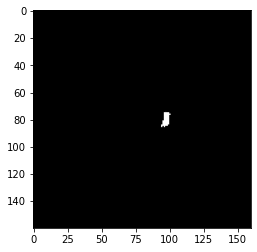

Epoch [   84/  100] | Batch [  800] | Loss: 0.2275 | Duration from start 2804.8303 


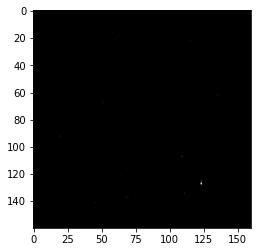

Epoch [   84/  100] | Batch [  900] | Loss: 0.2151 | Duration from start 3154.7313 


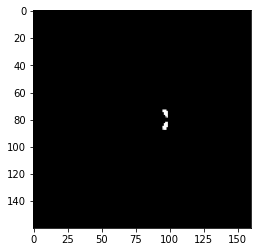

 84%|████████▍ | 84/100 [78:01:18<14:51:41, 3343.84s/it]

END OF EPOCH: 84 	Validation Loss per image: 0.298680
Epoch [   85/  100] | Batch [  100] | Loss: 0.3051 | Duration from start 356.2281 


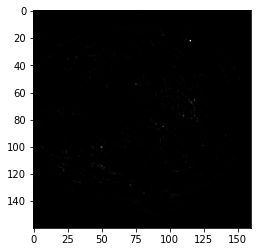

Epoch [   85/  100] | Batch [  200] | Loss: 0.2358 | Duration from start 706.0256 


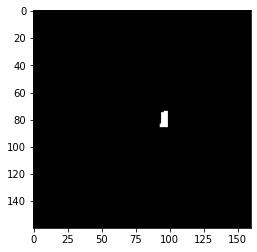

Epoch [   85/  100] | Batch [  300] | Loss: 0.2193 | Duration from start 1055.7509 


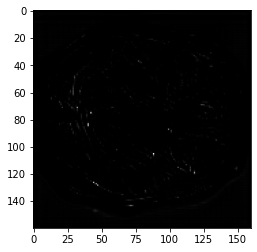

Epoch [   85/  100] | Batch [  400] | Loss: 0.2102 | Duration from start 1405.5722 


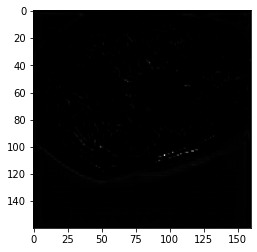

Epoch [   85/  100] | Batch [  500] | Loss: 0.2205 | Duration from start 1755.4810 


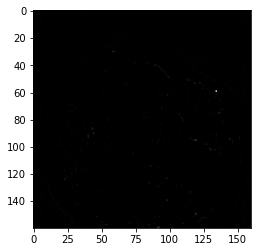

Epoch [   85/  100] | Batch [  600] | Loss: 0.2364 | Duration from start 2105.3081 


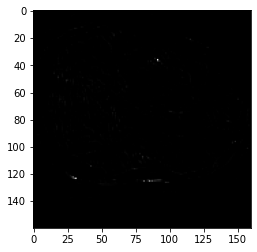

Epoch [   85/  100] | Batch [  700] | Loss: 0.2174 | Duration from start 2455.1110 


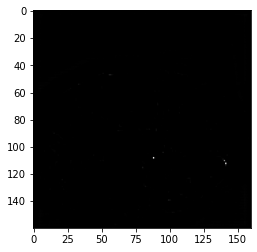

Epoch [   85/  100] | Batch [  800] | Loss: 0.2184 | Duration from start 2804.8900 


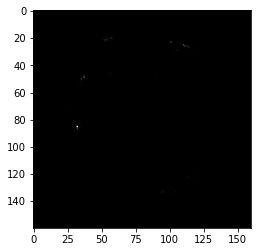

Epoch [   85/  100] | Batch [  900] | Loss: 0.2182 | Duration from start 3154.6531 


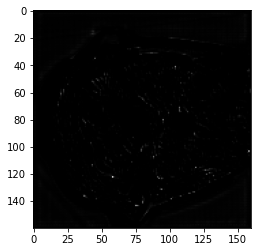

 85%|████████▌ | 85/100 [78:57:03<13:56:05, 3344.39s/it]

END OF EPOCH: 85 	Validation Loss per image: 0.307533
Epoch [   86/  100] | Batch [  100] | Loss: 0.2857 | Duration from start 356.6042 


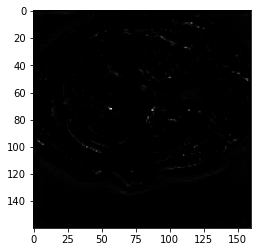

Epoch [   86/  100] | Batch [  200] | Loss: 0.2289 | Duration from start 706.4974 


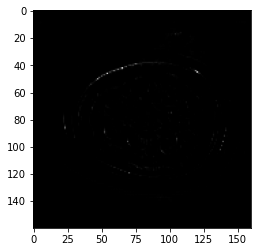

Epoch [   86/  100] | Batch [  300] | Loss: 0.2204 | Duration from start 1056.2780 


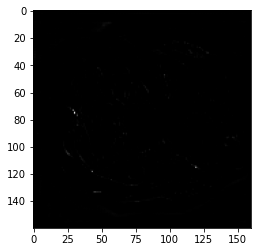

Epoch [   86/  100] | Batch [  400] | Loss: 0.2172 | Duration from start 1406.1146 


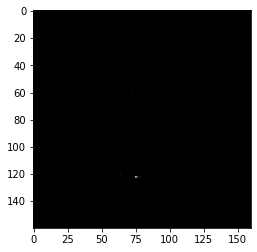

Epoch [   86/  100] | Batch [  500] | Loss: 0.2244 | Duration from start 1755.9004 


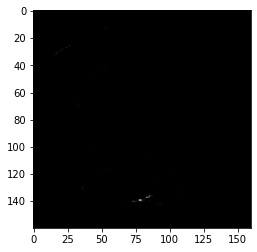

Epoch [   86/  100] | Batch [  600] | Loss: 0.2326 | Duration from start 2105.7111 


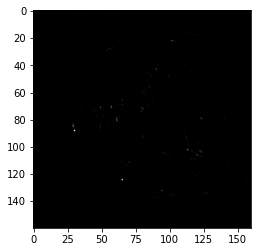

Epoch [   86/  100] | Batch [  700] | Loss: 0.2227 | Duration from start 2455.5538 


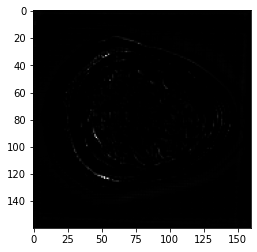

Epoch [   86/  100] | Batch [  800] | Loss: 0.2225 | Duration from start 2805.4179 


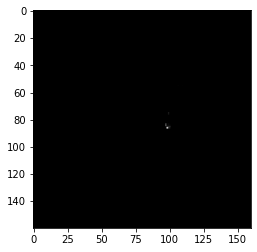

Epoch [   86/  100] | Batch [  900] | Loss: 0.2332 | Duration from start 3155.2920 


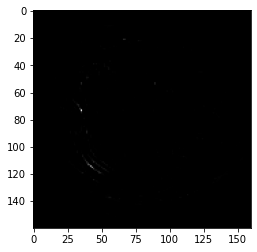

 86%|████████▌ | 86/100 [79:52:49<13:00:27, 3344.84s/it]

END OF EPOCH: 86 	Validation Loss per image: 0.292660
Epoch [   87/  100] | Batch [  100] | Loss: 0.2853 | Duration from start 357.0429 


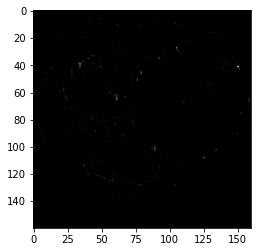

Epoch [   87/  100] | Batch [  200] | Loss: 0.2227 | Duration from start 706.9000 


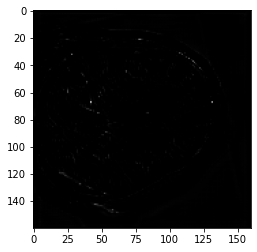

Epoch [   87/  100] | Batch [  300] | Loss: 0.2194 | Duration from start 1056.7548 


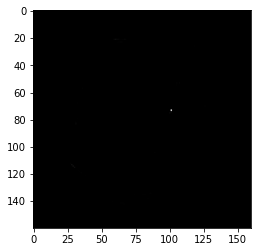

Epoch [   87/  100] | Batch [  400] | Loss: 0.2361 | Duration from start 1406.4661 


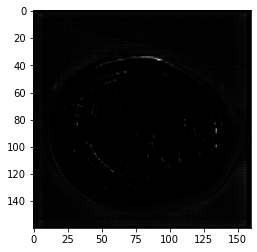

Epoch [   87/  100] | Batch [  500] | Loss: 0.2268 | Duration from start 1756.2492 


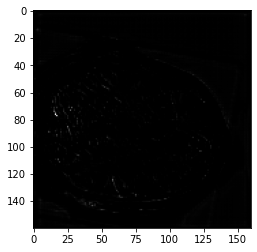

Epoch [   87/  100] | Batch [  600] | Loss: 0.2271 | Duration from start 2106.0640 


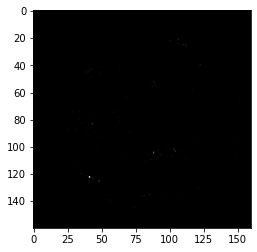

Epoch [   87/  100] | Batch [  700] | Loss: 0.2209 | Duration from start 2456.0588 


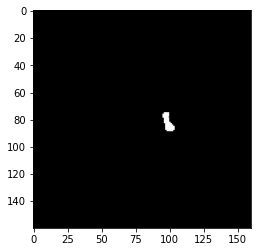

Epoch [   87/  100] | Batch [  800] | Loss: 0.2306 | Duration from start 2805.9092 


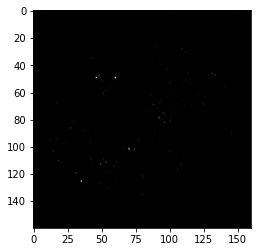

Epoch [   87/  100] | Batch [  900] | Loss: 0.2360 | Duration from start 3155.7169 


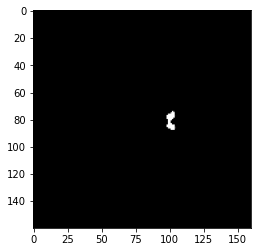

 87%|████████▋ | 87/100 [80:48:33<12:04:38, 3344.51s/it]

END OF EPOCH: 87 	Validation Loss per image: 0.293285
Epoch [   88/  100] | Batch [  100] | Loss: 0.3026 | Duration from start 355.6160 


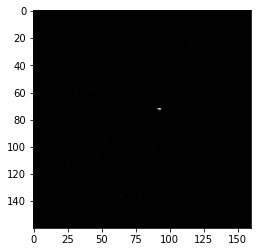

Epoch [   88/  100] | Batch [  200] | Loss: 0.2264 | Duration from start 705.5293 


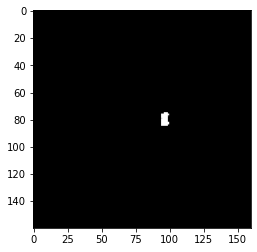

Epoch [   88/  100] | Batch [  300] | Loss: 0.2200 | Duration from start 1055.3676 


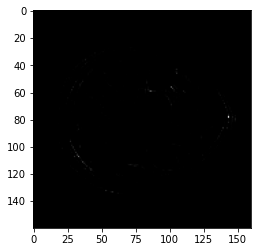

Epoch [   88/  100] | Batch [  400] | Loss: 0.2185 | Duration from start 1405.2341 


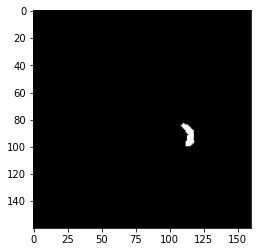

Epoch [   88/  100] | Batch [  500] | Loss: 0.2084 | Duration from start 1755.0258 


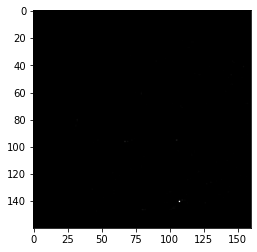

Epoch [   88/  100] | Batch [  600] | Loss: 0.2238 | Duration from start 2104.8941 


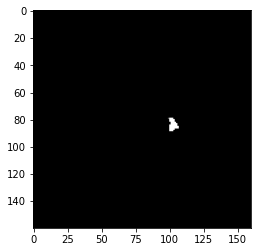

Epoch [   88/  100] | Batch [  700] | Loss: 0.2338 | Duration from start 2454.8192 


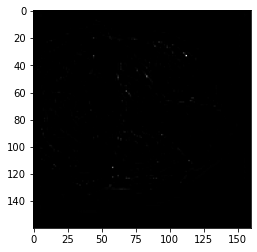

Epoch [   88/  100] | Batch [  800] | Loss: 0.2397 | Duration from start 2804.6548 


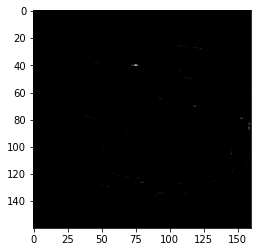

Epoch [   88/  100] | Batch [  900] | Loss: 0.2339 | Duration from start 3154.4663 


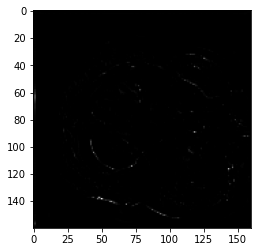

 88%|████████▊ | 88/100 [81:44:17<11:08:53, 3344.42s/it]

END OF EPOCH: 88 	Validation Loss per image: 0.292786
Epoch [   89/  100] | Batch [  100] | Loss: 0.3036 | Duration from start 356.3946 


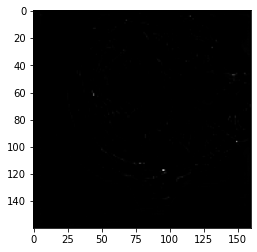

Epoch [   89/  100] | Batch [  200] | Loss: 0.2211 | Duration from start 706.2322 


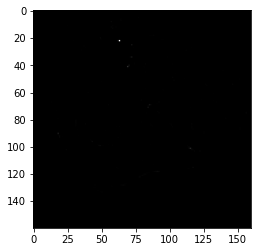

Epoch [   89/  100] | Batch [  300] | Loss: 0.2255 | Duration from start 1056.0942 


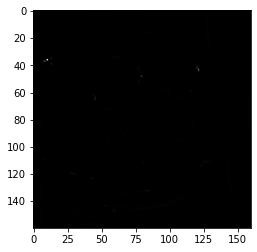

Epoch [   89/  100] | Batch [  400] | Loss: 0.2254 | Duration from start 1405.9938 


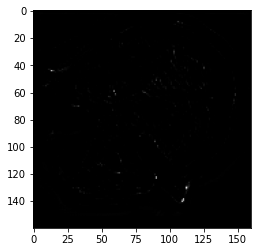

Epoch [   89/  100] | Batch [  500] | Loss: 0.2226 | Duration from start 1755.8074 


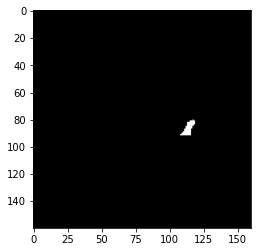

Epoch [   89/  100] | Batch [  600] | Loss: 0.2009 | Duration from start 2105.5954 


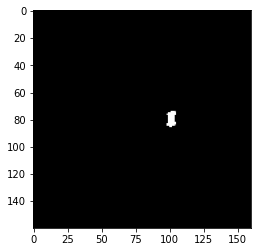

Epoch [   89/  100] | Batch [  700] | Loss: 0.2237 | Duration from start 2455.4450 


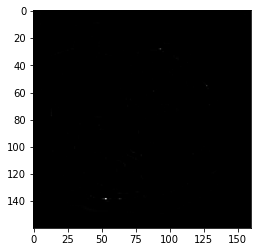

Epoch [   89/  100] | Batch [  800] | Loss: 0.2147 | Duration from start 2805.2954 


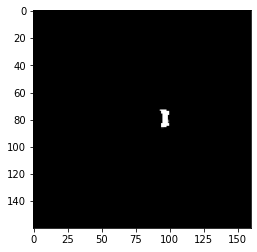

Epoch [   89/  100] | Batch [  900] | Loss: 0.2256 | Duration from start 3155.0843 


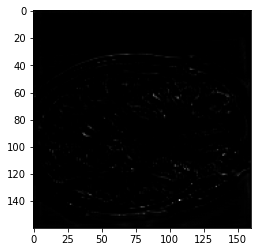

 89%|████████▉ | 89/100 [82:40:04<10:13:16, 3345.16s/it]

END OF EPOCH: 89 	Validation Loss per image: 0.298504
Epoch [   90/  100] | Batch [  100] | Loss: 0.2991 | Duration from start 358.5414 


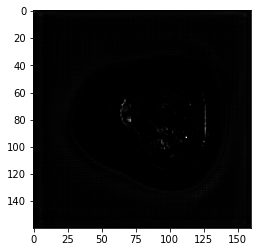

Epoch [   90/  100] | Batch [  200] | Loss: 0.2284 | Duration from start 708.4342 


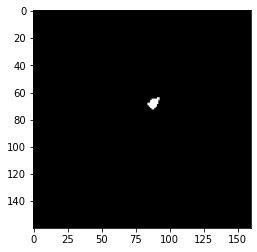

Epoch [   90/  100] | Batch [  300] | Loss: 0.2233 | Duration from start 1058.2722 


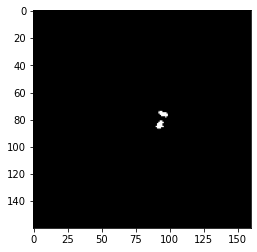

Epoch [   90/  100] | Batch [  400] | Loss: 0.2345 | Duration from start 1408.1240 


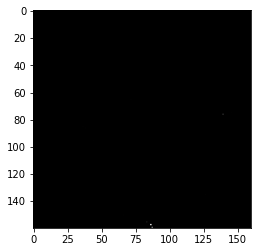

Epoch [   90/  100] | Batch [  500] | Loss: 0.2414 | Duration from start 1757.9282 


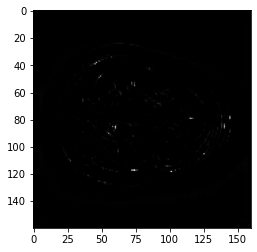

Epoch [   90/  100] | Batch [  600] | Loss: 0.2226 | Duration from start 2107.7716 


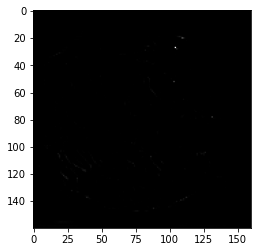

Epoch [   90/  100] | Batch [  700] | Loss: 0.2213 | Duration from start 2457.6162 


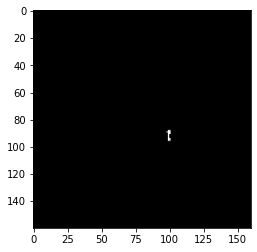

Epoch [   90/  100] | Batch [  800] | Loss: 0.2163 | Duration from start 2807.3978 


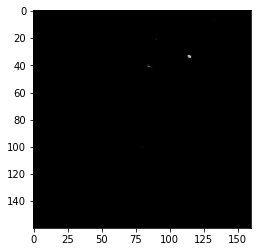

Epoch [   90/  100] | Batch [  900] | Loss: 0.2278 | Duration from start 3157.2924 


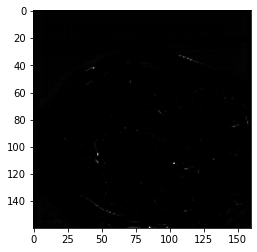

 90%|█████████ | 90/100 [83:35:49<9:17:30, 3345.02s/it] 

END OF EPOCH: 90 	Validation Loss per image: 0.287421
Epoch [   91/  100] | Batch [  100] | Loss: 0.2953 | Duration from start 356.3524 


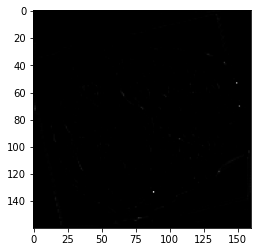

Epoch [   91/  100] | Batch [  200] | Loss: 0.2194 | Duration from start 706.2464 


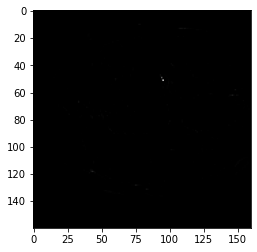

Epoch [   91/  100] | Batch [  300] | Loss: 0.2230 | Duration from start 1056.1680 


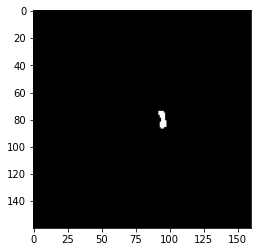

Epoch [   91/  100] | Batch [  400] | Loss: 0.2170 | Duration from start 1405.9737 


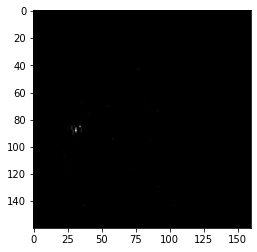

Epoch [   91/  100] | Batch [  500] | Loss: 0.2258 | Duration from start 1755.8980 


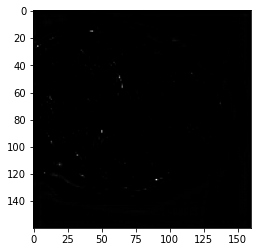

Epoch [   91/  100] | Batch [  600] | Loss: 0.2228 | Duration from start 2105.7722 


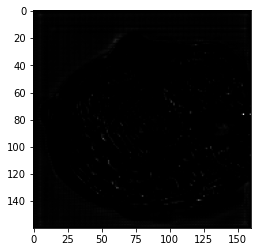

Epoch [   91/  100] | Batch [  700] | Loss: 0.2341 | Duration from start 2455.6305 


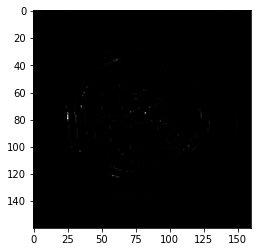

Epoch [   91/  100] | Batch [  800] | Loss: 0.2284 | Duration from start 2805.4854 


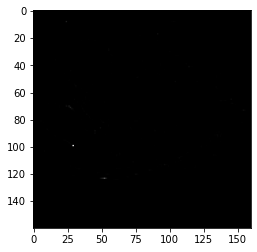

Epoch [   91/  100] | Batch [  900] | Loss: 0.2352 | Duration from start 3155.2826 


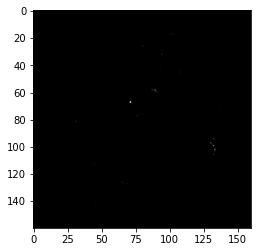

 91%|█████████ | 91/100 [84:31:35<8:21:47, 3345.29s/it]

END OF EPOCH: 91 	Validation Loss per image: 0.293588
Epoch [   92/  100] | Batch [  100] | Loss: 0.2913 | Duration from start 355.6381 


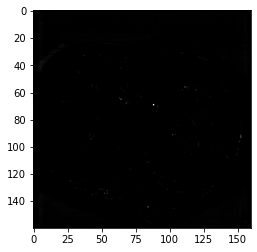

Epoch [   92/  100] | Batch [  200] | Loss: 0.2244 | Duration from start 705.5104 


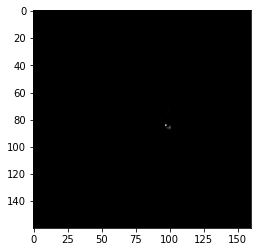

Epoch [   92/  100] | Batch [  300] | Loss: 0.2114 | Duration from start 1055.3428 


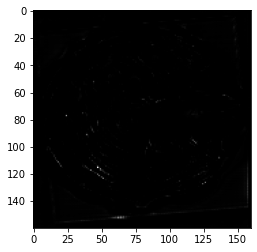

Epoch [   92/  100] | Batch [  400] | Loss: 0.2394 | Duration from start 1405.1919 


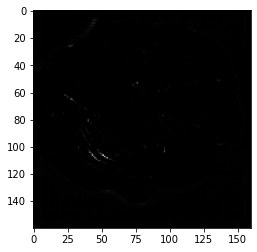

Epoch [   92/  100] | Batch [  500] | Loss: 0.2213 | Duration from start 1755.0320 


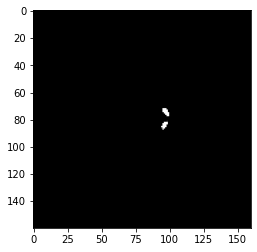

Epoch [   92/  100] | Batch [  600] | Loss: 0.2167 | Duration from start 2104.9633 


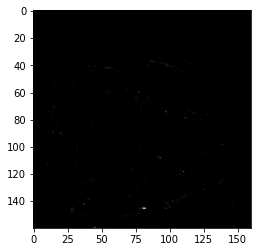

Epoch [   92/  100] | Batch [  700] | Loss: 0.2186 | Duration from start 2454.8742 


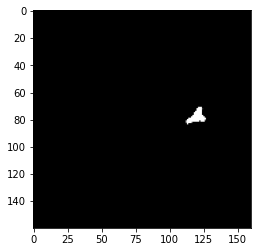

Epoch [   92/  100] | Batch [  800] | Loss: 0.2202 | Duration from start 2804.8127 


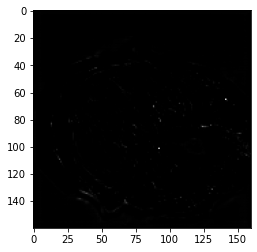

Epoch [   92/  100] | Batch [  900] | Loss: 0.2180 | Duration from start 3154.6785 


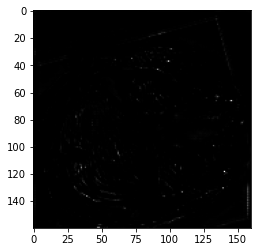

 92%|█████████▏| 92/100 [85:27:19<7:25:59, 3344.89s/it]

END OF EPOCH: 92 	Validation Loss per image: 0.296466
Epoch [   93/  100] | Batch [  100] | Loss: 0.2894 | Duration from start 358.6643 


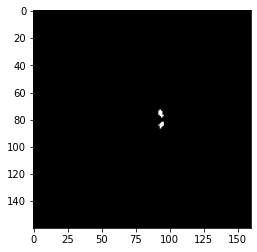

Epoch [   93/  100] | Batch [  200] | Loss: 0.2261 | Duration from start 708.4737 


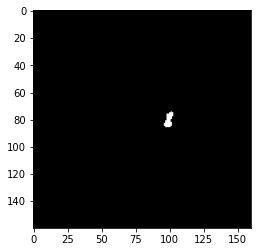

Epoch [   93/  100] | Batch [  300] | Loss: 0.2158 | Duration from start 1058.3302 


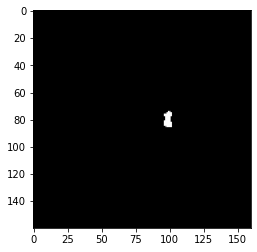

Epoch [   93/  100] | Batch [  400] | Loss: 0.2271 | Duration from start 1408.1090 


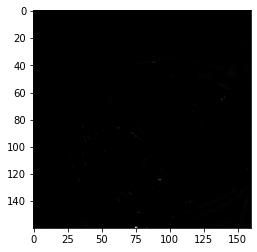

Epoch [   93/  100] | Batch [  500] | Loss: 0.2313 | Duration from start 1757.9645 


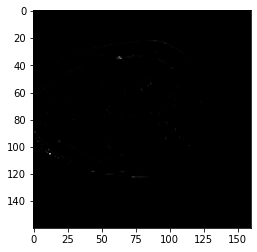

Epoch [   93/  100] | Batch [  600] | Loss: 0.2291 | Duration from start 2107.8021 


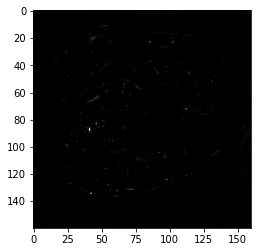

Epoch [   93/  100] | Batch [  700] | Loss: 0.2197 | Duration from start 2457.6485 


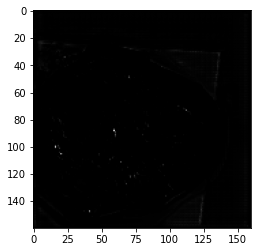

Epoch [   93/  100] | Batch [  800] | Loss: 0.2179 | Duration from start 2807.5154 


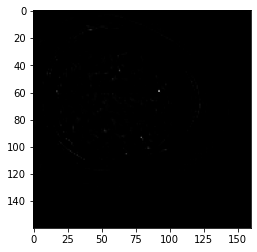

Epoch [   93/  100] | Batch [  900] | Loss: 0.2195 | Duration from start 3157.4301 


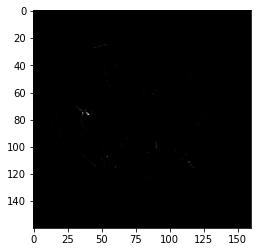

 93%|█████████▎| 93/100 [86:23:05<6:30:17, 3345.39s/it]

END OF EPOCH: 93 	Validation Loss per image: 0.315291
Epoch [   94/  100] | Batch [  100] | Loss: 0.2962 | Duration from start 354.5708 


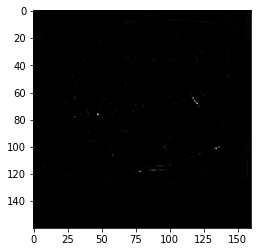

Epoch [   94/  100] | Batch [  200] | Loss: 0.2137 | Duration from start 704.3966 


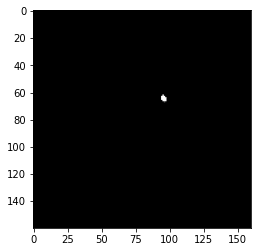

Epoch [   94/  100] | Batch [  300] | Loss: 0.2246 | Duration from start 1054.2475 


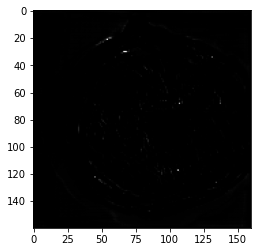

Epoch [   94/  100] | Batch [  400] | Loss: 0.2284 | Duration from start 1404.2217 


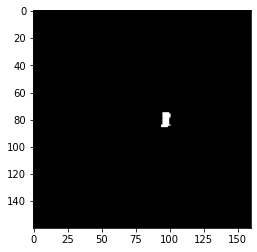

Epoch [   94/  100] | Batch [  500] | Loss: 0.2264 | Duration from start 1754.0661 


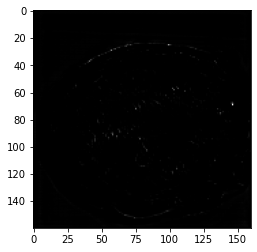

Epoch [   94/  100] | Batch [  600] | Loss: 0.2116 | Duration from start 2103.9789 


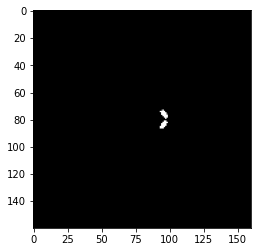

Epoch [   94/  100] | Batch [  700] | Loss: 0.2230 | Duration from start 2453.7934 


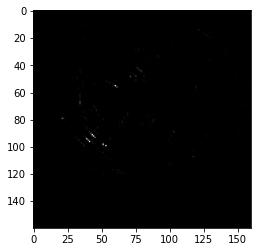

Epoch [   94/  100] | Batch [  800] | Loss: 0.2301 | Duration from start 2803.6661 


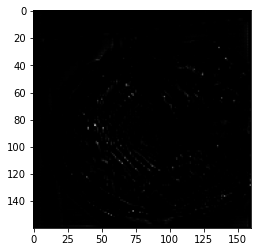

Epoch [   94/  100] | Batch [  900] | Loss: 0.2115 | Duration from start 3153.5635 


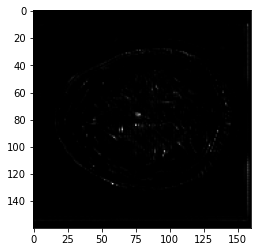

 94%|█████████▍| 94/100 [87:18:49<5:34:29, 3344.89s/it]

END OF EPOCH: 94 	Validation Loss per image: 0.287986
Epoch [   95/  100] | Batch [  100] | Loss: 0.3037 | Duration from start 354.3949 


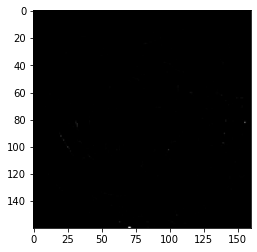

Epoch [   95/  100] | Batch [  200] | Loss: 0.2144 | Duration from start 704.3423 


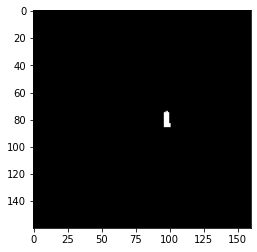

Epoch [   95/  100] | Batch [  300] | Loss: 0.2262 | Duration from start 1054.2673 


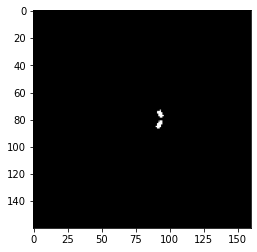

Epoch [   95/  100] | Batch [  400] | Loss: 0.2120 | Duration from start 1404.1220 


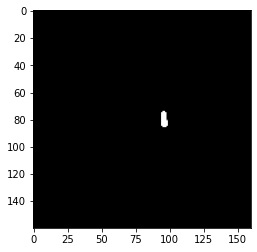

Epoch [   95/  100] | Batch [  500] | Loss: 0.2310 | Duration from start 1754.0306 


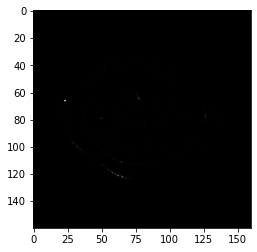

Epoch [   95/  100] | Batch [  600] | Loss: 0.2273 | Duration from start 2103.9025 


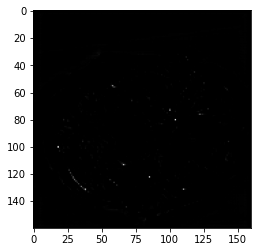

Epoch [   95/  100] | Batch [  700] | Loss: 0.2328 | Duration from start 2453.7066 


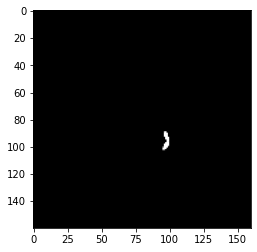

Epoch [   95/  100] | Batch [  800] | Loss: 0.2196 | Duration from start 2803.5689 


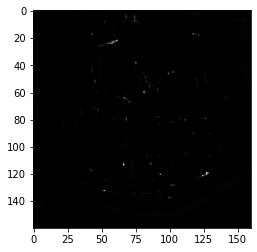

Epoch [   95/  100] | Batch [  900] | Loss: 0.2366 | Duration from start 3153.4339 


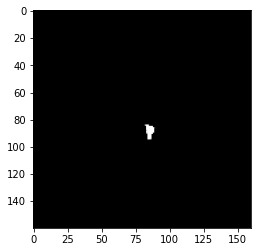

 95%|█████████▌| 95/100 [88:14:31<4:38:40, 3344.04s/it]

END OF EPOCH: 95 	Validation Loss per image: 0.314147
Epoch [   96/  100] | Batch [  100] | Loss: 0.2900 | Duration from start 355.5077 


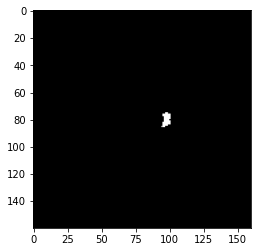

Epoch [   96/  100] | Batch [  200] | Loss: 0.2127 | Duration from start 705.3403 


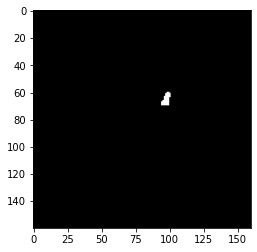

Epoch [   96/  100] | Batch [  300] | Loss: 0.2243 | Duration from start 1055.1872 


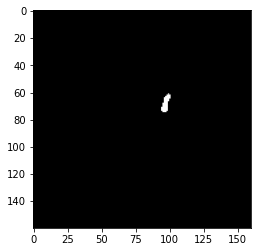

Epoch [   96/  100] | Batch [  400] | Loss: 0.2258 | Duration from start 1405.0409 


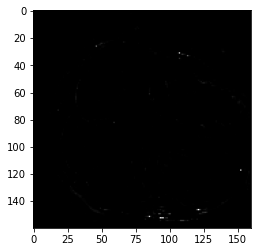

Epoch [   96/  100] | Batch [  500] | Loss: 0.2129 | Duration from start 1754.9151 


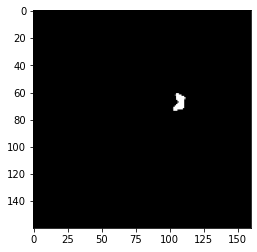

Epoch [   96/  100] | Batch [  600] | Loss: 0.2168 | Duration from start 2104.6367 


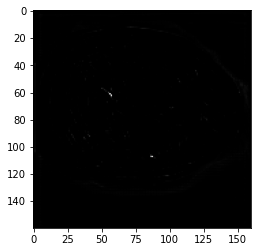

Epoch [   96/  100] | Batch [  700] | Loss: 0.2324 | Duration from start 2454.4637 


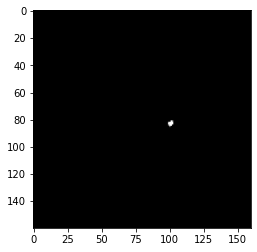

Epoch [   96/  100] | Batch [  800] | Loss: 0.2205 | Duration from start 2804.3401 


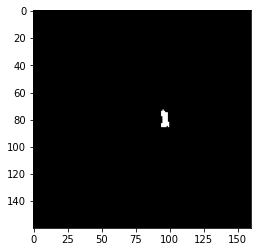

Epoch [   96/  100] | Batch [  900] | Loss: 0.2202 | Duration from start 3154.0934 


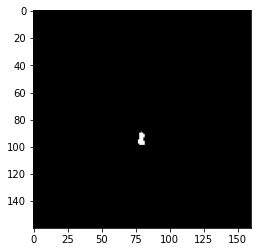

 96%|█████████▌| 96/100 [89:10:15<3:42:55, 3343.93s/it]

END OF EPOCH: 96 	Validation Loss per image: 0.324899
Epoch [   97/  100] | Batch [  100] | Loss: 0.2890 | Duration from start 356.4701 


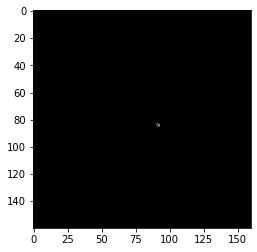

Epoch [   97/  100] | Batch [  200] | Loss: 0.2237 | Duration from start 706.2991 


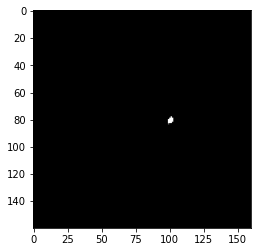

Epoch [   97/  100] | Batch [  300] | Loss: 0.2197 | Duration from start 1056.1030 


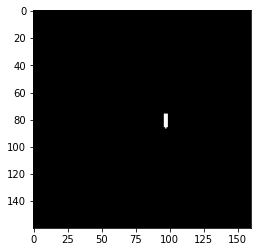

Epoch [   97/  100] | Batch [  400] | Loss: 0.2359 | Duration from start 1405.9264 


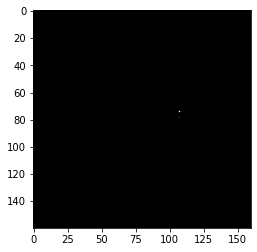

Epoch [   97/  100] | Batch [  500] | Loss: 0.2231 | Duration from start 1755.7751 


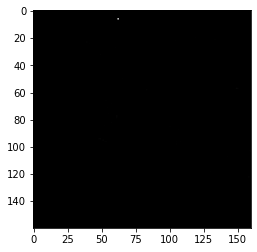

Epoch [   97/  100] | Batch [  600] | Loss: 0.2337 | Duration from start 2105.5473 


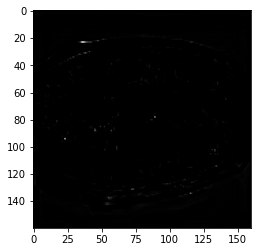

Epoch [   97/  100] | Batch [  700] | Loss: 0.2252 | Duration from start 2455.3743 


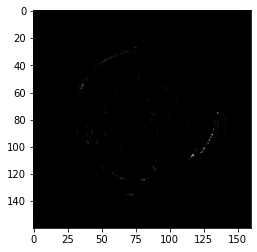

Epoch [   97/  100] | Batch [  800] | Loss: 0.2142 | Duration from start 2805.1408 


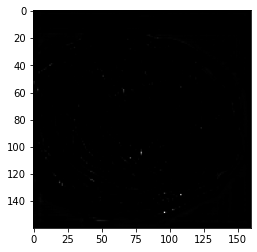

Epoch [   97/  100] | Batch [  900] | Loss: 0.2292 | Duration from start 3154.9350 


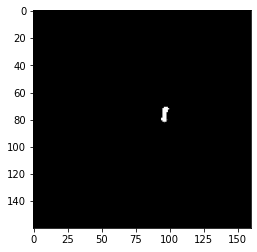

 97%|█████████▋| 97/100 [90:06:00<2:47:13, 3344.47s/it]

END OF EPOCH: 97 	Validation Loss per image: 0.287252
Epoch [   98/  100] | Batch [  100] | Loss: 0.2811 | Duration from start 357.7831 


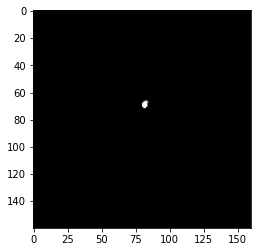

Epoch [   98/  100] | Batch [  200] | Loss: 0.2173 | Duration from start 707.5645 


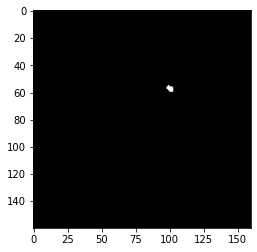

Epoch [   98/  100] | Batch [  300] | Loss: 0.2155 | Duration from start 1057.3273 


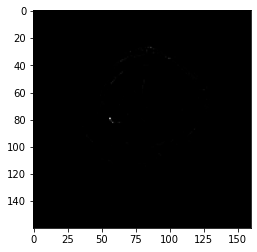

Epoch [   98/  100] | Batch [  400] | Loss: 0.2183 | Duration from start 1407.0875 


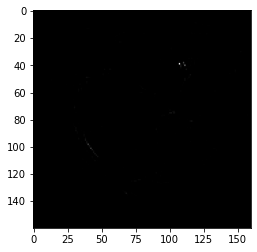

Epoch [   98/  100] | Batch [  500] | Loss: 0.2292 | Duration from start 1756.9246 


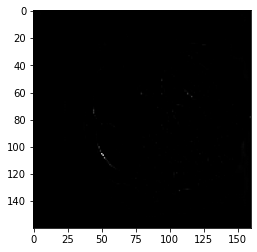

Epoch [   98/  100] | Batch [  600] | Loss: 0.2319 | Duration from start 2106.6974 


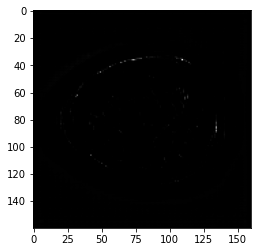

Epoch [   98/  100] | Batch [  700] | Loss: 0.2220 | Duration from start 2456.6079 


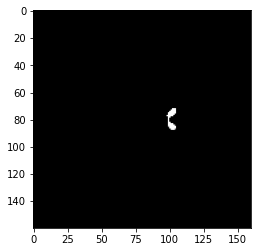

Epoch [   98/  100] | Batch [  800] | Loss: 0.2324 | Duration from start 2806.3813 


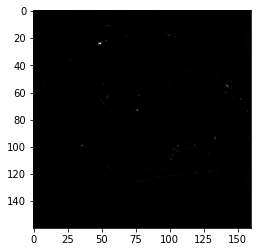

Epoch [   98/  100] | Batch [  900] | Loss: 0.2262 | Duration from start 3156.1719 


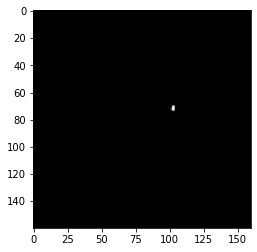

 98%|█████████▊| 98/100 [91:01:47<1:51:30, 3345.17s/it]

END OF EPOCH: 98 	Validation Loss per image: 0.299630
Epoch [   99/  100] | Batch [  100] | Loss: 0.2866 | Duration from start 357.0699 


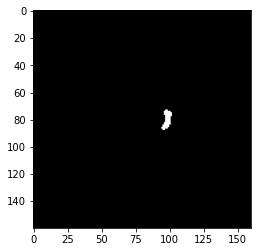

Epoch [   99/  100] | Batch [  200] | Loss: 0.2143 | Duration from start 706.9098 


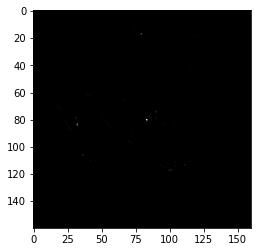

Epoch [   99/  100] | Batch [  300] | Loss: 0.2329 | Duration from start 1056.7826 


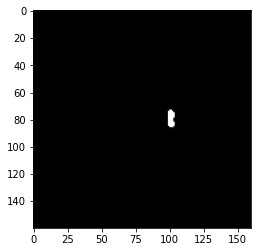

Epoch [   99/  100] | Batch [  400] | Loss: 0.2089 | Duration from start 1406.5478 


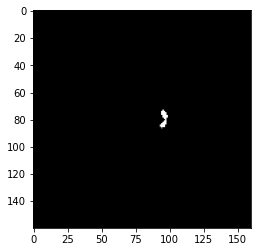

Epoch [   99/  100] | Batch [  500] | Loss: 0.2353 | Duration from start 1756.3047 


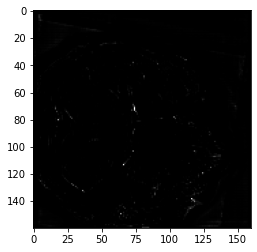

Epoch [   99/  100] | Batch [  600] | Loss: 0.2177 | Duration from start 2106.0870 


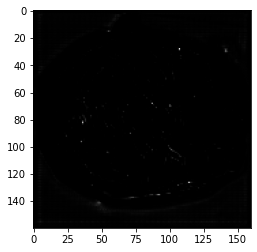

Epoch [   99/  100] | Batch [  700] | Loss: 0.2238 | Duration from start 2455.8484 


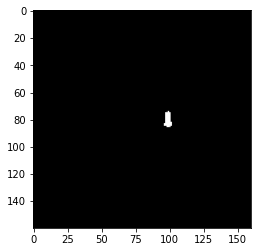

Epoch [   99/  100] | Batch [  800] | Loss: 0.2267 | Duration from start 2805.6597 


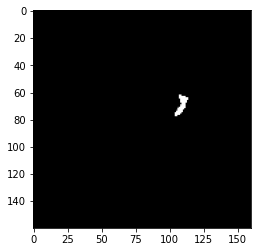

Epoch [   99/  100] | Batch [  900] | Loss: 0.2196 | Duration from start 3155.4608 


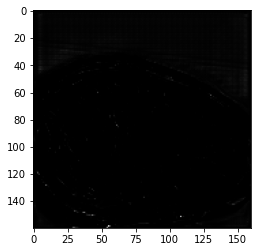

 99%|█████████▉| 99/100 [91:57:32<55:45, 3345.21s/it]  

END OF EPOCH: 99 	Validation Loss per image: 0.285174
Epoch [  100/  100] | Batch [  100] | Loss: 0.2995 | Duration from start 354.4224 


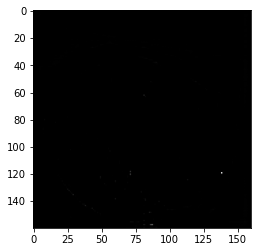

Epoch [  100/  100] | Batch [  200] | Loss: 0.2248 | Duration from start 704.3255 


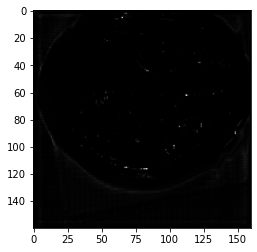

Epoch [  100/  100] | Batch [  300] | Loss: 0.2107 | Duration from start 1054.0812 


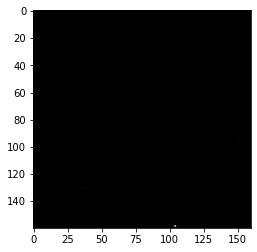

Epoch [  100/  100] | Batch [  400] | Loss: 0.2322 | Duration from start 1403.8793 


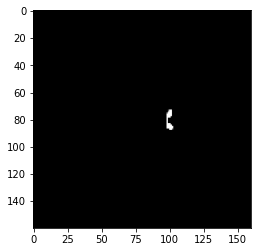

Epoch [  100/  100] | Batch [  500] | Loss: 0.2212 | Duration from start 1753.6543 


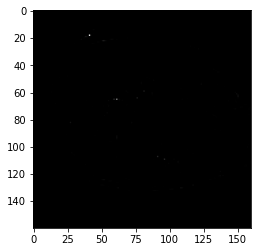

Epoch [  100/  100] | Batch [  600] | Loss: 0.2057 | Duration from start 2103.4489 


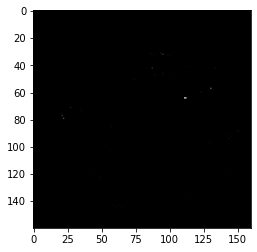

Epoch [  100/  100] | Batch [  700] | Loss: 0.2192 | Duration from start 2453.2560 


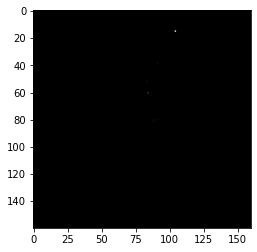

Epoch [  100/  100] | Batch [  800] | Loss: 0.2276 | Duration from start 2803.0945 


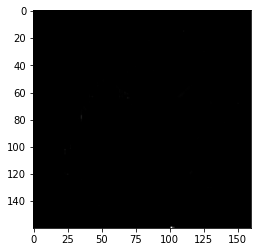

Epoch [  100/  100] | Batch [  900] | Loss: 0.2206 | Duration from start 3152.8957 


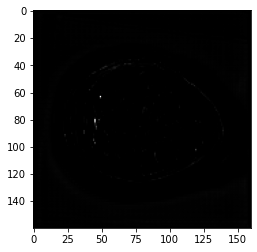

100%|██████████| 100/100 [92:53:16<00:00, 3343.96s/it]

END OF EPOCH: 100 	Validation Loss per image: 0.329835


In [16]:
# train the model
oc_segmentator, track_train_loss, track_valid_loss = train_network(n_epochs, dataloaders, unet, optimizer, criterion, device, 100, '../../1_Data/0_CNN_weights/100ep_00005lr.pt')

Below we can inspect the changes in the loss function, as evaluated on the training and validation set, during training

<function matplotlib.pyplot.show(*args, **kw)>

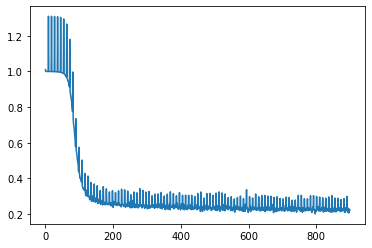

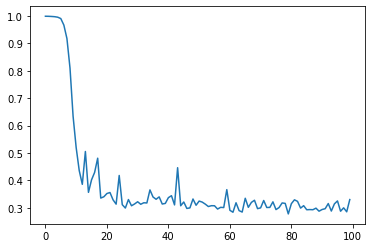

In [17]:
# print the change of the loss
plt.figure()
plt.plot(track_train_loss)
plt.figure()
plt.plot(track_valid_loss)
plt.show

In [22]:
np.min(track_valid_loss)

0.27745489205155416

During the training we saved the parameters of the actual newtwork only if its performance on the validation set was better than previously (please note that the initial value was infinity, so the first iteration was naturally the first one to be saved, and later on was overwritten). Here we load the weights of the network that demonstrated superior performance on validation data.

In [18]:
# load the model that got the best validation accuracy (uncomment the line below)
model = UNet(1,2);
model.load_state_dict(torch.load('../../1_Data/0_CNN_weights/100ep_00005lr.pt'))

<All keys matched successfully>

Finally, we qualitatively test the performance of the network on the test data, just to confirm that everything is in order.

torch.Size([1, 1, 160, 160, 160])
torch.Size([1, 1, 160, 160, 160])


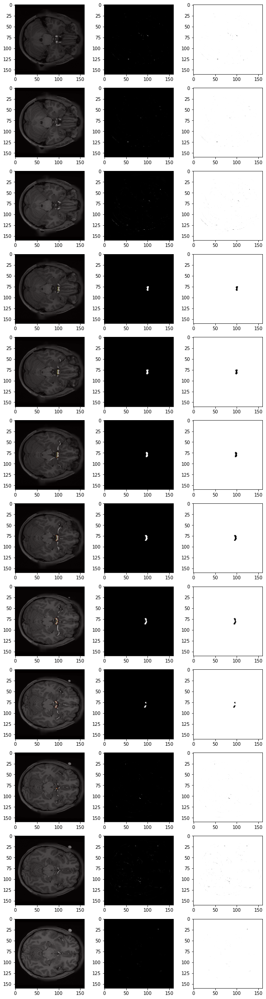

In [19]:
# Check the output of trained network

validata = iter(dataloaders['test'])
valid_output = validata.next()
valid_data, valid_label = valid_output['t1']['data'], valid_output['label']['data']

print(valid_data.shape)
print(valid_label.shape)

starty, endy = 60, 100
startx, endx = 100, 130
slice=45

# Plot the exemplary test data
#plt.imshow(valid_data[0,0,starty:endy,startx:endx,slice].numpy(), cmap='gray')
#plt.imshow(valid_label[0,0,starty:endy,startx:endx,slice].numpy(), cmap='hot', alpha=0.25)

# Run the data through trained network
with torch.no_grad():
    prediction = model.to(device)(valid_data.to(device))

k=12
fig = plt.figure(figsize=(10,40))
for i in range(k):
    fig.add_subplot(k,3,3*i+1)
    plt.imshow(valid_data[0,0,:,:,slice+i].numpy(), cmap='gray')
    plt.imshow(valid_label[0,0,:,:,slice+i].numpy(), cmap='hot', alpha=0.33)
    fig.add_subplot(k,3,3*i+2)
    plt.imshow(prediction.cpu()[0,0,:,:,slice+i].numpy(), cmap='gray', alpha=1)
    fig.add_subplot(k,3,3*i+3)
    plt.imshow(prediction.cpu()[0,1,:,:,slice+i].numpy(), cmap='gray', alpha=1)